# Task
just upload these

Here is all the data you need:
"BRNT Historical Data.csv"
"DAX Historical Data.csv"
"ITA Historical Data.csv"
"MOEX Russia Index Historical Data.csv"
"PPA Historical Data.csv"

## Data loading


In [ ]:
!pip install dtw

In [ ]:
# Importing libraries

import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from dtw import dtw
import numpy as np

from scipy.spatial.distance import squareform
from scipy.cluster.hierarchy import linkage
from matplotlib.patches import Patch

# Load the CSV files into pandas DataFrames and parse the 'Date' column
df_moex = pd.read_csv('MOEX Russia Index Historical Data.csv', parse_dates=['Date'], dayfirst=True)
df_dax = pd.read_csv('DAX Historical Data.csv', parse_dates=['Date'], dayfirst=True)
df_spy = pd.read_csv('SPY Historical Data.csv', parse_dates=['Date'], dayfirst=True)
df_brnt = pd.read_csv('BRNT Historical Data.csv', parse_dates=['Date'], dayfirst=True)
df_usd_rub = pd.read_csv('USD_RUB Historical Data.csv', parse_dates=['Date'], dayfirst=True)
df_usd_uah = pd.read_csv('USD_UAH Historical Data.csv', parse_dates=['Date'], dayfirst=True)
df_ita = pd.read_csv('ITA Historical Data.csv', parse_dates=['Date'], dayfirst=True)
df_ppa = pd.read_csv('PPA Historical Data.csv', parse_dates=['Date'], dayfirst=True)
df_jets = pd.read_csv('JETS Historical Data.csv', parse_dates=['Date'], dayfirst=True)
df_rhmg = pd.read_csv('RHMG Historical Data.csv', parse_dates=['Date'], dayfirst=True)
df_mtxgn = pd.read_csv('MTXGn Historical Data.csv', parse_dates=['Date'], dayfirst=True)
df_air = pd.read_csv('AIR Historical Data.csv', parse_dates=['Date'], dayfirst=True)
df_tcfp = pd.read_csv('TCFP Historical Data.csv', parse_dates=['Date'], dayfirst=True)
df_baes = pd.read_csv('BAES Historical Data.csv', parse_dates=['Date'], dayfirst=True)
df_hiae = pd.read_csv('HIAE Historical Data.csv', parse_dates=['Date'], dayfirst=True)
df_praf = pd.read_csv('PRAF Historical Data.csv', parse_dates=['Date'], dayfirst=True)
df_bara = pd.read_csv('BARA Historical Data.csv', parse_dates=['Date'], dayfirst=True)
df_ieur = pd.read_csv('IEUR Historical Data.csv', parse_dates=['Date'], dayfirst=True)
df_sxepex = pd.read_csv('SXEPEX Historical Data.csv', parse_dates=['Date'], dayfirst=True)
df_fez = pd.read_csv('FEZ Historical Data.csv', parse_dates=['Date'], dayfirst=True)
df_xle = pd.read_csv('XLE Historical Data.csv', parse_dates=['Date'], dayfirst=True)
df_bp = pd.read_csv('BP Historical Data.csv', parse_dates=['Date'], dayfirst=True)
df_eni = pd.read_csv('ENI Historical Data.csv', parse_dates=['Date'], dayfirst=True)
df_eqnr = pd.read_csv('EQNR Historical Data.csv', parse_dates=['Date'], dayfirst=True)
df_shell = pd.read_csv('SHELl Historical Data.csv', parse_dates=['Date'], dayfirst=True)

In [ ]:
df_moex.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 25 entries, 0 to 24
Data columns (total 7 columns):
 #   Column    Non-Null Count  Dtype         
---  ------    --------------  -----         
 0   Date      25 non-null     datetime64[ns]
 1   Price     25 non-null     object        
 2   Open      25 non-null     object        
 3   High      25 non-null     object        
 4   Low       25 non-null     object        
 5   Vol.      0 non-null      float64       
 6   Change %  25 non-null     object        
dtypes: datetime64[ns](1), float64(1), object(5)
memory usage: 1.5+ KB


In [ ]:
df_moex.head()

,Date,Price,Open,High,Low,Vol.,Change %
0,2022-03-25,"2,484.13","2,620.62","2,664.74","2,470.69",NaN,-3.66%
1,2022-03-24,"2,578.51","2,467.09","2,761.17","2,447.68",NaN,4.37%
2,2022-02-25,"2,470.48","2,261.33","2,552.46","2,256.09",NaN,20.04%
3,2022-02-24,"2,058.12","2,735.88","2,740.31","1,681.55",NaN,-33.28%
4,2022-02-22,"3,084.74","2,909.40","3,113.40","2,756.46",NaN,1.58%


In [ ]:
# Drop open, low, high columns from all the dataframes

dataframes = [df_moex, df_dax, df_spy, df_brnt, df_usd_rub, df_usd_uah, df_ita, df_ppa, df_jets, df_rhmg, df_mtxgn, df_air, df_tcfp, df_baes, df_hiae, df_praf, df_bara, df_ieur, df_sxepex, df_fez, df_xle, df_bp, df_eni, df_eqnr, df_shell]
columns_to_drop = ['Open', 'Low', 'High']

for df in dataframes:
  for col in columns_to_drop:
    if col in df.columns:
      df.drop(col, axis=1, inplace=True)


In [ ]:
df_moex.head()

,Date,Price,Vol.,Change %
0,2022-03-25,"2,484.13",NaN,-3.66%
1,2022-03-24,"2,578.51",NaN,4.37%
2,2022-02-25,"2,470.48",NaN,20.04%
3,2022-02-24,"2,058.12",NaN,-33.28%
4,2022-02-22,"3,084.74",NaN,1.58%


In [ ]:
df_moex.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 25 entries, 0 to 24
Data columns (total 4 columns):
 #   Column    Non-Null Count  Dtype         
---  ------    --------------  -----         
 0   Date      25 non-null     datetime64[ns]
 1   Price     25 non-null     object        
 2   Vol.      0 non-null      float64       
 3   Change %  25 non-null     object        
dtypes: datetime64[ns](1), float64(1), object(2)
memory usage: 932.0+ bytes


In [ ]:
# Rename the price and volume columns in all dataframes to the price and volume of the index/equity they represent, such as price_usd/rub, vol_brent

df_moex.rename(columns={'Price': 'Price_moex', 'Vol.': 'Vol_moex', 'Change %': 'Change_moex'}, inplace=True)
df_dax.rename(columns={'Price': 'Price_dax', 'Vol.': 'Vol_dax', 'Change %': 'Change_dax'}, inplace=True)
df_spy.rename(columns={'Price': 'Price_spy', 'Vol.': 'Vol_spy', 'Change %': 'Change_spy'}, inplace=True)
df_brnt.rename(columns={'Price': 'Price_brnt', 'Vol.': 'Vol_brnt', 'Change %': 'Change_brnt'}, inplace=True)
df_usd_rub.rename(columns={'Price': 'Price_usd_rub', 'Vol.': 'Vol_usd_rub', 'Change %': 'Change_usd_rub'}, inplace=True)
df_usd_uah.rename(columns={'Price': 'Price_usd_uah', 'Vol.': 'Vol_usd_uah', 'Change %': 'Change_usd_uah'}, inplace=True)
df_ita.rename(columns={'Price': 'Price_ita', 'Vol.': 'Vol_ita', 'Change %': 'Change_ita'}, inplace=True)
df_ppa.rename(columns={'Price': 'Price_ppa', 'Vol.': 'Vol_ppa', 'Change %': 'Change_ppa'}, inplace=True)
df_jets.rename(columns={'Price': 'Price_jets', 'Vol.': 'Vol_jets', 'Change %': 'Change_jets'}, inplace=True)
df_rhmg.rename(columns={'Price': 'Price_rhmg', 'Vol.': 'Vol_rhmg', 'Change %': 'Change_rhmg'}, inplace=True)
df_mtxgn.rename(columns={'Price': 'Price_mtxgn', 'Vol.': 'Vol_mtxgn', 'Change %': 'Change_mtxgn'}, inplace=True)
df_air.rename(columns={'Price': 'Price_air', 'Vol.': 'Vol_air', 'Change %': 'Change_air'}, inplace=True)
df_tcfp.rename(columns={'Price': 'Price_tcfp', 'Vol.': 'Vol_tcfp', 'Change %': 'Change_tcfp'}, inplace=True)
df_baes.rename(columns={'Price': 'Price_baes', 'Vol.': 'Vol_baes', 'Change %': 'Change_baes'}, inplace=True)
df_hiae.rename(columns={'Price': 'Price_hiae', 'Vol.': 'Vol_hiae', 'Change %': 'Change_hiae'}, inplace=True)
df_praf.rename(columns={'Price': 'Price_praf', 'Vol.': 'Vol_praf', 'Change %': 'Change_praf'}, inplace=True)
df_bara.rename(columns={'Price': 'Price_bara', 'Vol.': 'Vol_bara', 'Change %': 'Change_bara'}, inplace=True)
df_ieur.rename(columns={'Price': 'Price_ieur', 'Vol.': 'Vol_ieur', 'Change %': 'Change_ieur'}, inplace=True)
df_sxepex.rename(columns={'Price': 'Price_sxepex', 'Vol.': 'Vol_sxepex', 'Change %': 'Change_sxepex'}, inplace=True)
df_fez.rename(columns={'Price': 'Price_fez', 'Vol.': 'Vol_fez', 'Change %': 'Change_fez'}, inplace=True)
df_xle.rename(columns={'Price': 'Price_xle', 'Vol.': 'Vol_xle', 'Change %': 'Change_xle'}, inplace=True)
df_bp.rename(columns={'Price': 'Price_bp', 'Vol.': 'Vol_bp', 'Change %': 'Change_bp'}, inplace=True)
df_eni.rename(columns={'Price': 'Price_eni', 'Vol.': 'Vol_eni', 'Change %': 'Change_eni'}, inplace=True)
df_eqnr.rename(columns={'Price': 'Price_eqnr', 'Vol.': 'Vol_eqnr', 'Change %': 'Change_eqnr'}, inplace=True)
df_shell.rename(columns={'Price': 'Price_shell', 'Vol.': 'Vol_shell', 'Change %': 'Change_shell'}, inplace=True)

In [ ]:
df_moex.head()

,Date,Price_moex,Vol_moex,Change_moex
0,2022-03-25,"2,484.13",NaN,-3.66%
1,2022-03-24,"2,578.51",NaN,4.37%
2,2022-02-25,"2,470.48",NaN,20.04%
3,2022-02-24,"2,058.12",NaN,-33.28%
4,2022-02-22,"3,084.74",NaN,1.58%


## Process and Plot 10-Day Rolling Volatility for All Assets


MOEX - Last few rows of volatility:
        Date  Change_moex  Volatility_moex
9 2022-02-15         3.42         2.099091
8 2022-02-16         1.28         2.124430
7 2022-02-17        -3.71         2.378627
6 2022-02-18        -3.35         2.623802
5 2022-02-21       -10.50         4.178169
4 2022-02-22         1.58         4.113110
3 2022-02-24       -33.28        10.706950
2 2022-02-25        20.04        13.276593
1 2022-03-24         4.37        13.475716
0 2022-03-25        -3.66        13.482617


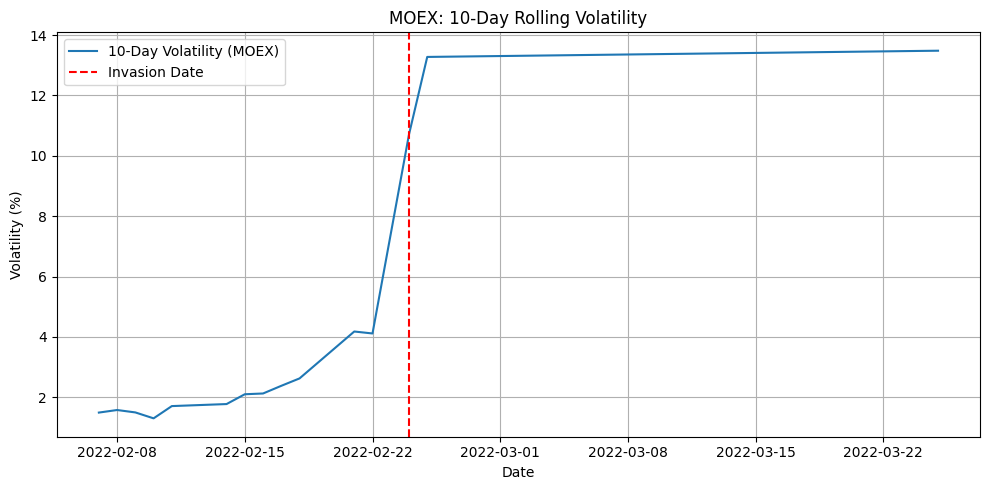


DAX - Last few rows of volatility:
        Date  Change_dax  Volatility_dax
9 2022-03-14        2.21        3.658182
8 2022-03-15       -0.09        3.441274
7 2022-03-16        3.76        3.635103
6 2022-03-17       -0.36        3.539318
5 2022-03-18        0.17        3.094878
4 2022-03-21       -0.60        2.975400
3 2022-03-22        1.02        2.948245
2 2022-03-23       -1.31        1.877879
1 2022-03-24       -0.07        1.508527
0 2022-03-25        0.22        1.487274


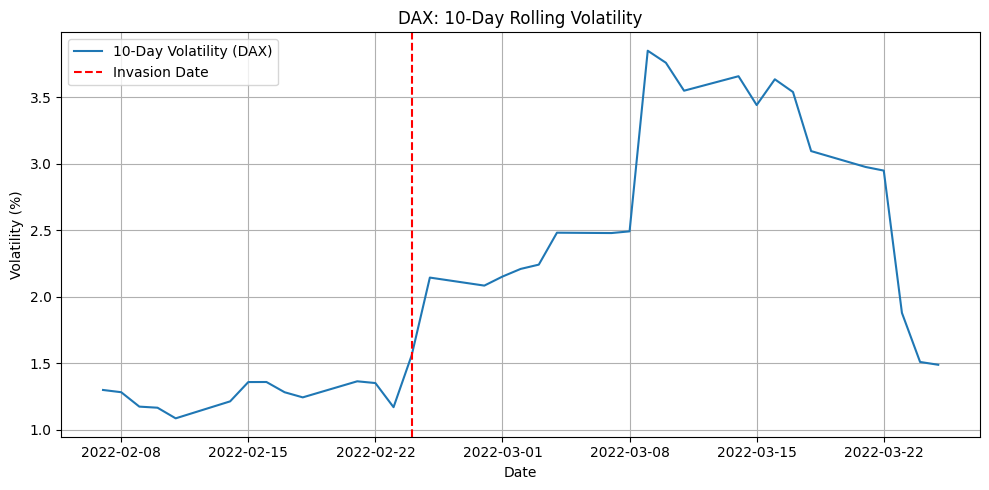


SPY - Last few rows of volatility:
        Date  Change_spy  Volatility_spy
9 2022-03-14       -0.73        1.612962
8 2022-03-15        2.20        1.760248
7 2022-03-16        2.22        1.809592
6 2022-03-17        1.25        1.844131
5 2022-03-18        0.78        1.821721
4 2022-03-21       -0.03        1.436790
3 2022-03-22        1.17        1.363189
2 2022-03-23       -1.29        1.326619
1 2022-03-24        1.51        1.334312
0 2022-03-25        0.49        1.168846


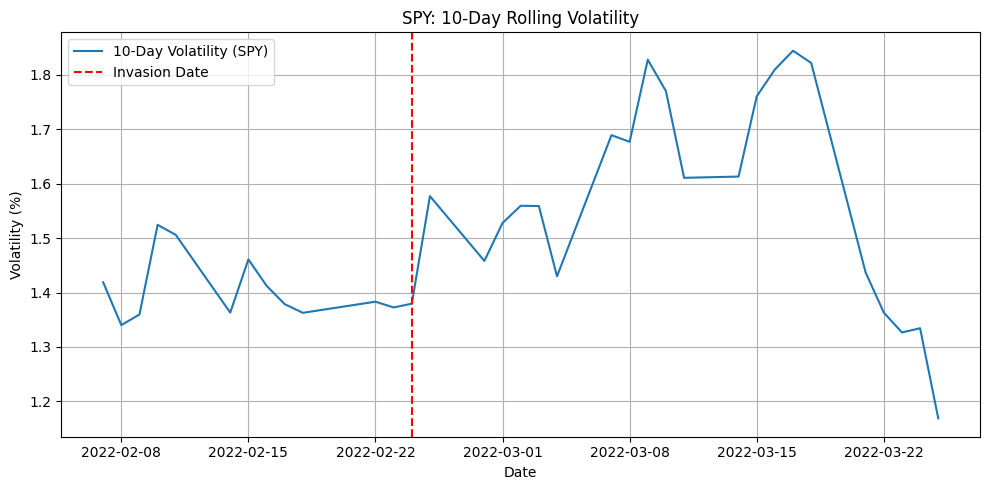


BRNT - Last few rows of volatility:
        Date  Change_brnt  Volatility_brnt
9 2022-03-14        -5.23         6.199866
8 2022-03-15        -2.97         5.569531
7 2022-03-16        -1.16         5.504586
6 2022-03-17         5.69         5.682848
5 2022-03-18         0.88         5.690773
4 2022-03-21         6.62         5.430490
3 2022-03-22        -0.98         4.813509
2 2022-03-23         4.91         4.411254
1 2022-03-24        -0.43         3.891604
0 2022-03-25         0.62         3.855902


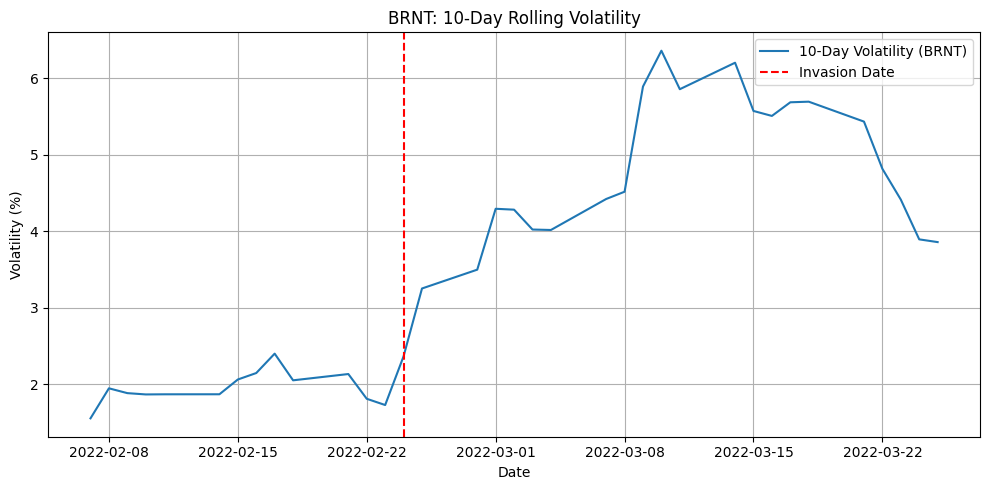


USD_RUB - Last few rows of volatility:
        Date  Change_usd_rub  Volatility_usd_rub
9 2022-03-14           -9.49            9.071087
8 2022-03-15          -13.54           10.189846
7 2022-03-16           -8.59           10.314066
6 2022-03-17            5.25            9.753057
5 2022-03-18            3.94            8.922543
4 2022-03-21            0.15            7.611430
3 2022-03-22           -0.61            6.991853
2 2022-03-23           -9.44            6.384447
1 2022-03-24            6.16            7.082611
0 2022-03-25            1.85            7.164697


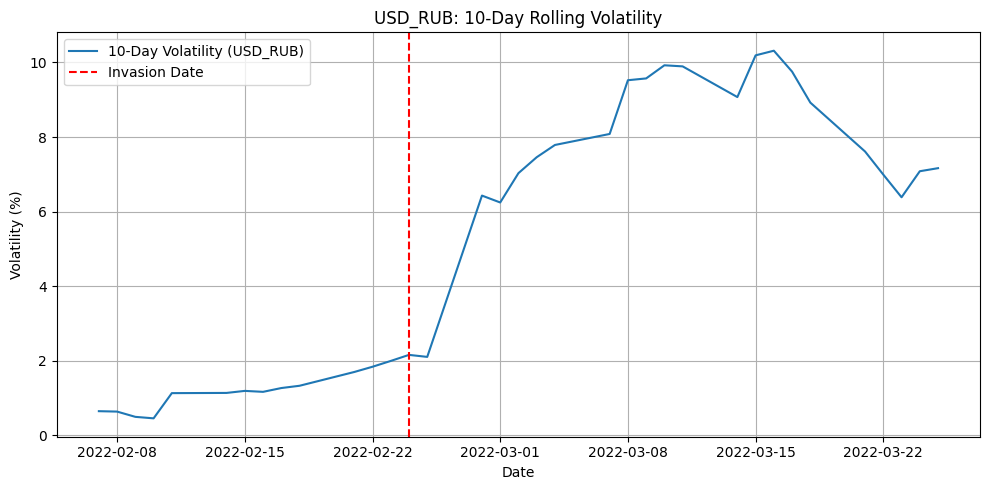


USD_UAH - Last few rows of volatility:
        Date  Change_usd_uah  Volatility_usd_uah
9 2022-03-14            0.00            1.404549
8 2022-03-15            1.02            1.349469
7 2022-03-16           -0.99            1.408342
6 2022-03-17            1.00            1.418467
5 2022-03-18           -1.01            1.491697
4 2022-03-21            0.00            1.476779
3 2022-03-22            0.00            1.420769
2 2022-03-23            0.00            1.133324
1 2022-03-24            0.00            1.075962
0 2022-03-25            0.85            0.721681


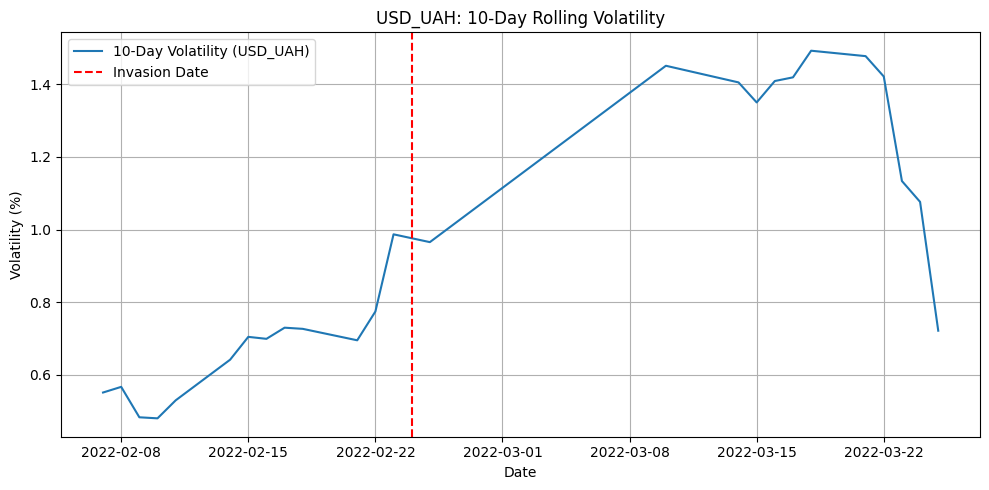


ITA - Last few rows of volatility:
        Date  Change_ita  Volatility_ita
9 2022-03-14       -0.46        1.350850
8 2022-03-15        1.70        1.516415
7 2022-03-16       -0.23        1.470852
6 2022-03-17        1.56        1.534617
5 2022-03-18        0.59        1.543265
4 2022-03-21        1.28        1.408580
3 2022-03-22        1.20        1.181882
2 2022-03-23       -0.39        1.052726
1 2022-03-24        0.96        1.054221
0 2022-03-25        0.35        0.810174


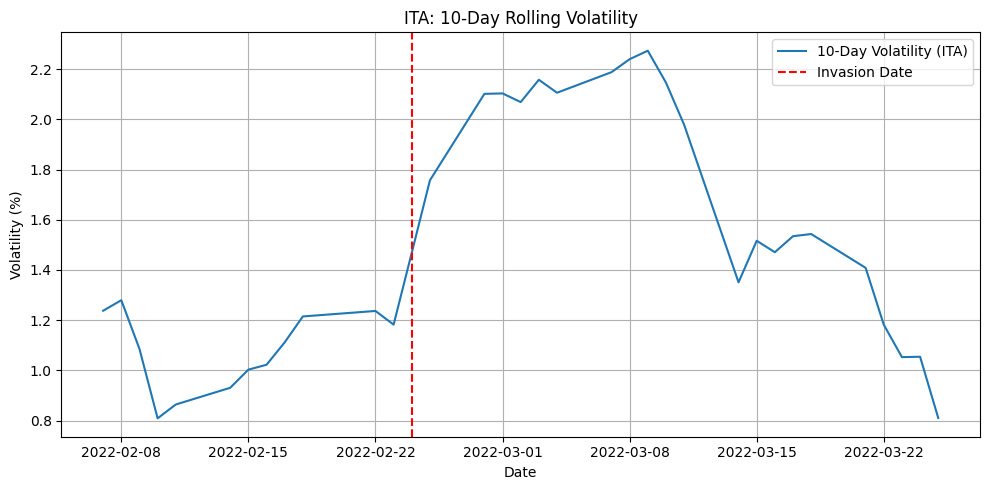


PPA - Last few rows of volatility:
        Date  Change_ppa  Volatility_ppa
9 2022-03-14       -0.48        1.216295
8 2022-03-15        1.90        1.405924
7 2022-03-16       -0.74        1.350827
6 2022-03-17        1.39        1.425155
5 2022-03-18        0.61        1.427165
4 2022-03-21        0.97        1.408429
3 2022-03-22        1.03        1.086716
2 2022-03-23       -0.55        1.047653
1 2022-03-24        1.43        1.099606
0 2022-03-25        0.38        0.922403


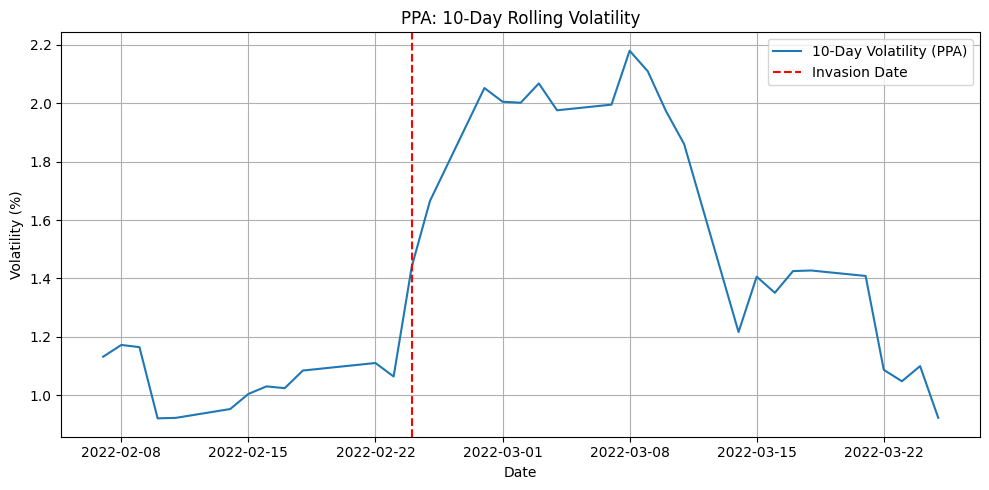


JETS - Last few rows of volatility:
        Date  Change_jets  Volatility_jets
9 2022-03-14         0.60         4.986802
8 2022-03-15         5.84         5.295107
7 2022-03-16         5.01         5.538325
6 2022-03-17        -0.20         5.412343
5 2022-03-18         1.48         5.094731
4 2022-03-21        -2.47         3.199019
3 2022-03-22         2.24         3.037495
2 2022-03-23        -1.41         2.817980
1 2022-03-24         2.12         2.778909
0 2022-03-25         0.72         2.592961


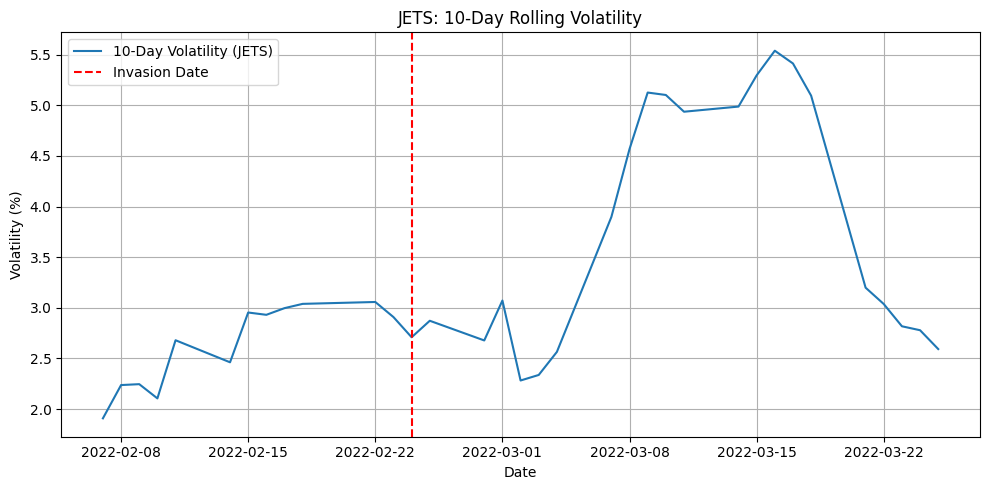


RHMG - Last few rows of volatility:
        Date  Change_rhmg  Volatility_rhmg
9 2022-03-14        -2.42         6.509424
8 2022-03-15         2.08         3.491443
7 2022-03-16         1.13         3.340904
6 2022-03-17         4.29         3.437710
5 2022-03-18         3.99         3.541943
4 2022-03-21         9.12         4.233703
3 2022-03-22        -3.70         4.354753
2 2022-03-23         1.04         3.737641
1 2022-03-24         8.89         4.174393
0 2022-03-25         3.09         4.171731


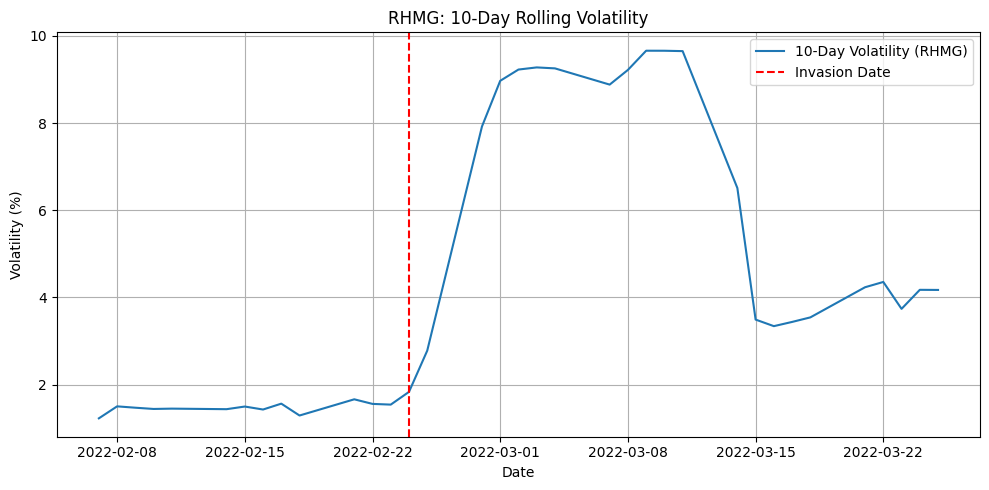


MTXGN - Last few rows of volatility:
        Date  Change_mtxgn  Volatility_mtxgn
9 2022-03-14          3.42          4.269038
8 2022-03-15          0.29          3.544909
7 2022-03-16          4.05          3.358267
6 2022-03-17          0.19          2.912835
5 2022-03-18         -1.27          2.426884
4 2022-03-21          1.33          2.400851
3 2022-03-22          0.75          2.331011
2 2022-03-23         -1.26          2.053735
1 2022-03-24         -0.19          1.761964
0 2022-03-25          1.56          1.774918


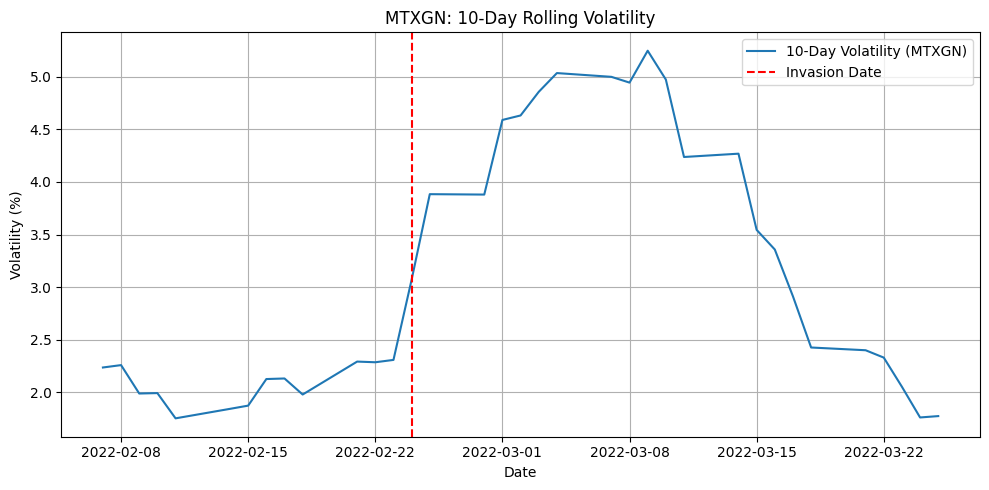


AIR - Last few rows of volatility:
        Date  Change_air  Volatility_air
9 2022-03-14        0.96        5.883300
8 2022-03-15       -1.38        5.082694
7 2022-03-16        3.59        4.913345
6 2022-03-17        0.39        4.698253
5 2022-03-18       -1.02        3.867194
4 2022-03-21       -0.77        3.646892
3 2022-03-22        2.79        3.657413
2 2022-03-23       -0.95        2.341012
1 2022-03-24        0.15        1.966719
0 2022-03-25        0.13        1.657049


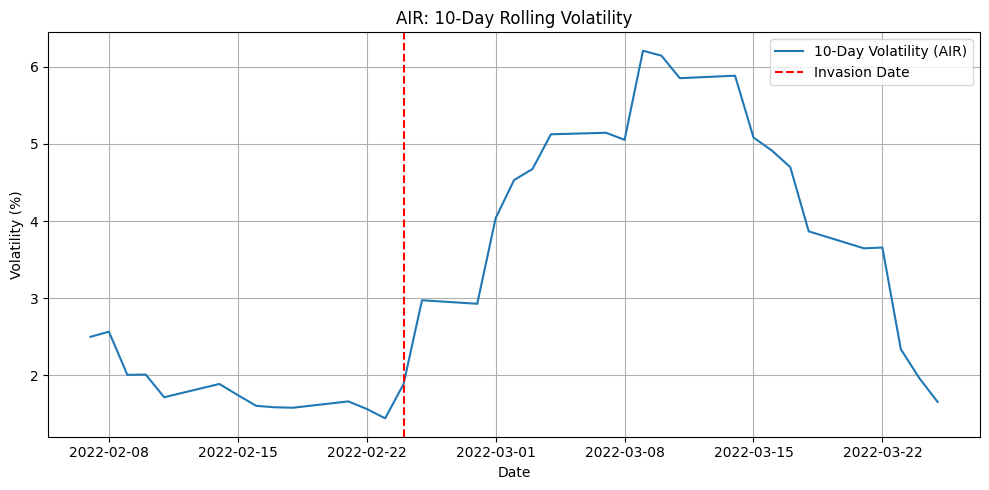


TCFP - Last few rows of volatility:
        Date  Change_tcfp  Volatility_tcfp
9 2022-03-14        -2.14         3.783189
8 2022-03-15         1.64         3.474811
7 2022-03-16        -1.17         3.018929
6 2022-03-17         1.68         2.849748
5 2022-03-18         0.27         2.848725
4 2022-03-21         2.45         2.028705
3 2022-03-22         0.52         2.019814
2 2022-03-23         0.30         1.359778
1 2022-03-24         1.72         1.410943
0 2022-03-25         1.95         1.469859


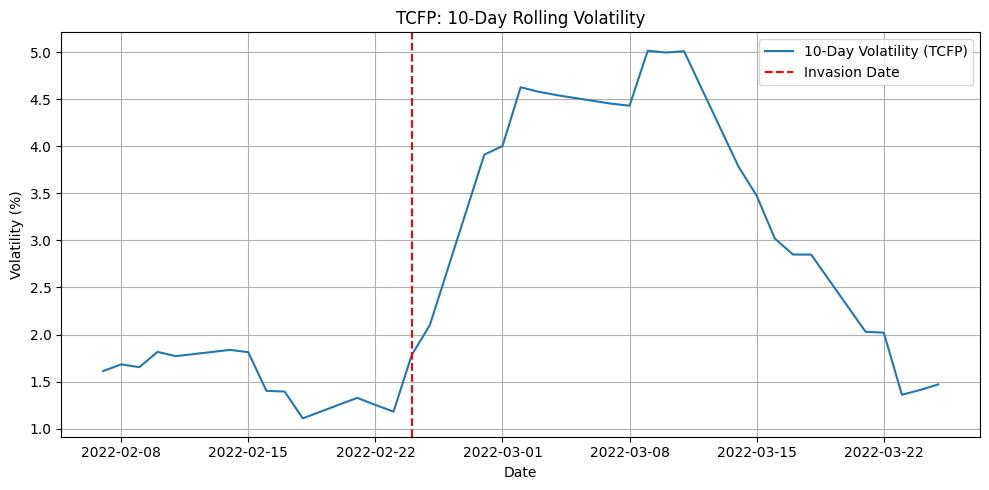


BAES - Last few rows of volatility:
        Date  Change_baes  Volatility_baes
9 2022-03-14        -1.28         3.585573
8 2022-03-15         1.22         3.390360
7 2022-03-16        -3.60         3.453253
6 2022-03-17         2.46         3.240045
5 2022-03-18        -0.08         3.233636
4 2022-03-21         1.16         2.289877
3 2022-03-22         0.77         2.212589
2 2022-03-23        -0.24         1.713108
1 2022-03-24         1.88         1.739962
0 2022-03-25         0.83         1.744539


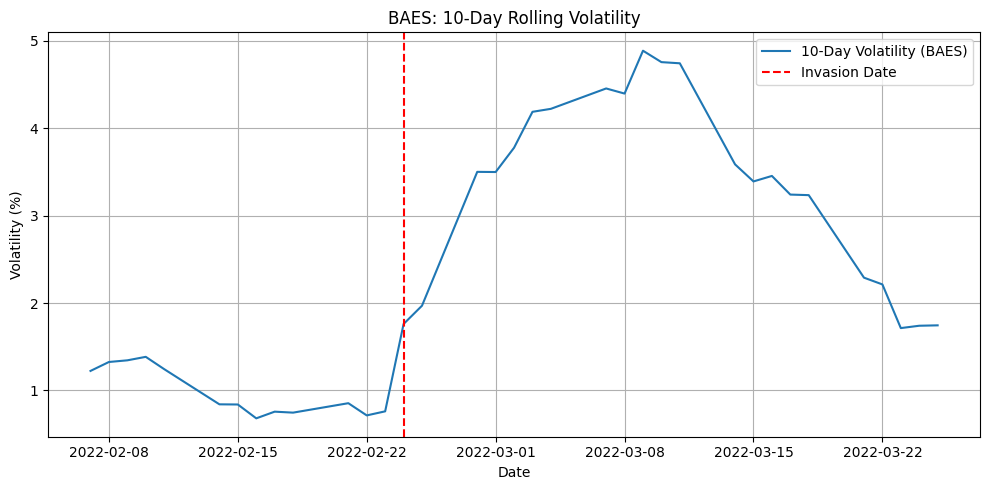


HIAE - Last few rows of volatility:
        Date  Change_hiae  Volatility_hiae
9 2022-03-11         1.24         2.439900
8 2022-03-14        -0.28         2.336590
7 2022-03-15        -0.32         1.526495
6 2022-03-16         6.20         2.507610
5 2022-03-17        -1.12         2.521866
4 2022-03-21         0.03         2.507811
3 2022-03-22        -2.17         2.309129
2 2022-03-23        -0.54         2.334442
1 2022-03-24        -0.09         2.344513
0 2022-03-25        -0.79         2.274981


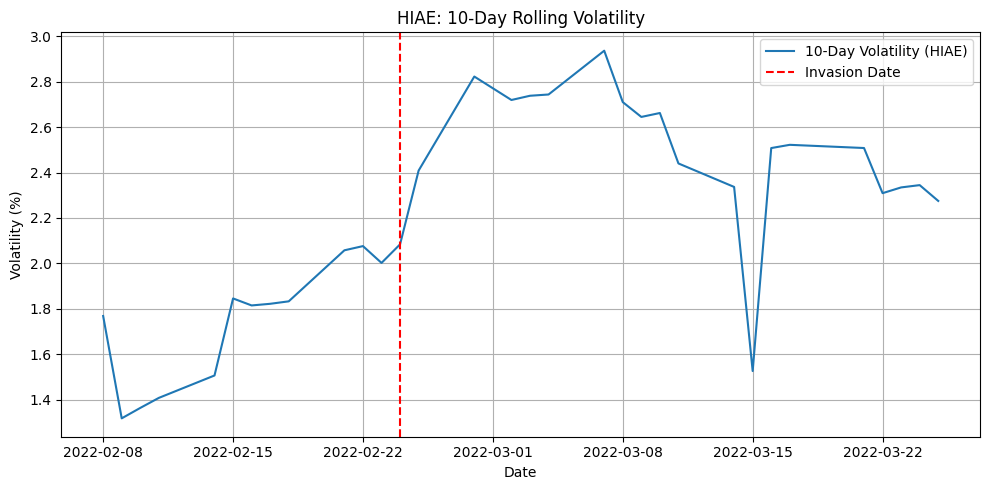


PRAF - Last few rows of volatility:
        Date  Change_praf  Volatility_praf
9 2022-03-11         1.42         2.663200
8 2022-03-14        -1.11         1.938449
7 2022-03-15        -1.12         1.436932
6 2022-03-16         1.10         1.408301
5 2022-03-17         0.75         1.423871
4 2022-03-21         0.39         1.157756
3 2022-03-22        -1.76         1.278517
2 2022-03-23         6.95         2.444158
1 2022-03-24        -2.32         2.610407
0 2022-03-25        -2.53         2.774840


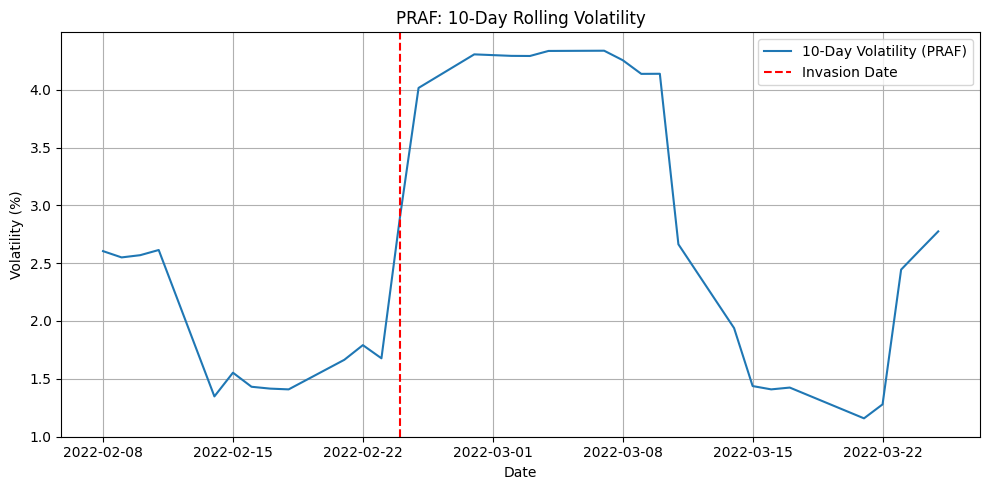


BARA - Last few rows of volatility:
        Date  Change_bara  Volatility_bara
9 2022-03-11         3.61         2.514656
8 2022-03-14         1.90         2.246742
7 2022-03-15         4.10         2.285293
6 2022-03-16         6.24         2.675823
5 2022-03-17         8.00         3.172412
4 2022-03-21        -4.56         3.755786
3 2022-03-22         0.56         3.390005
2 2022-03-23        -1.00         3.568433
1 2022-03-24        -1.18         3.747611
0 2022-03-25        -0.86         3.835091


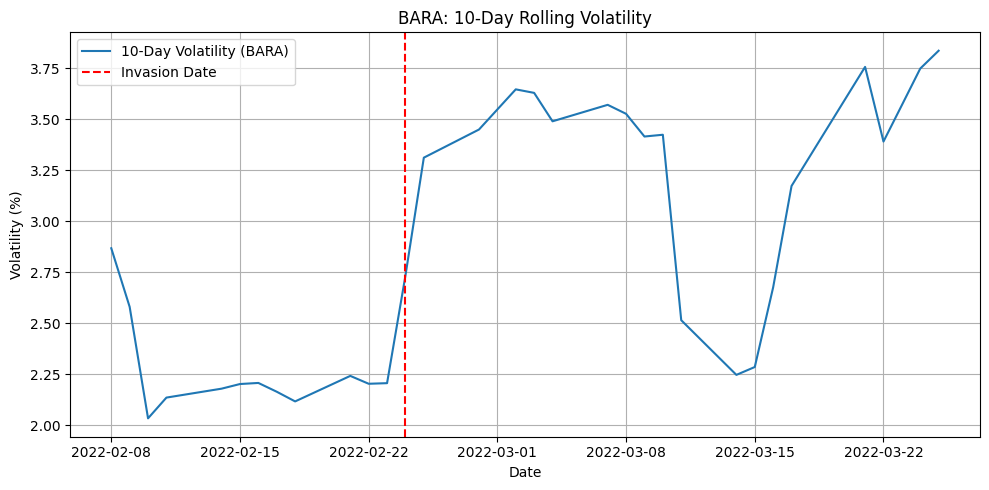


IEUR - Last few rows of volatility:
        Date  Change_ieur  Volatility_ieur
9 2022-03-14         1.88         3.043680
8 2022-03-15         0.65         2.957350
7 2022-03-16         3.92         3.204049
6 2022-03-17         0.63         3.057696
5 2022-03-18         0.90         2.582843
4 2022-03-21        -1.01         2.233230
3 2022-03-22         1.26         2.194484
2 2022-03-23        -1.75         1.802065
1 2022-03-24         0.57         1.619808
0 2022-03-25         0.13         1.541535


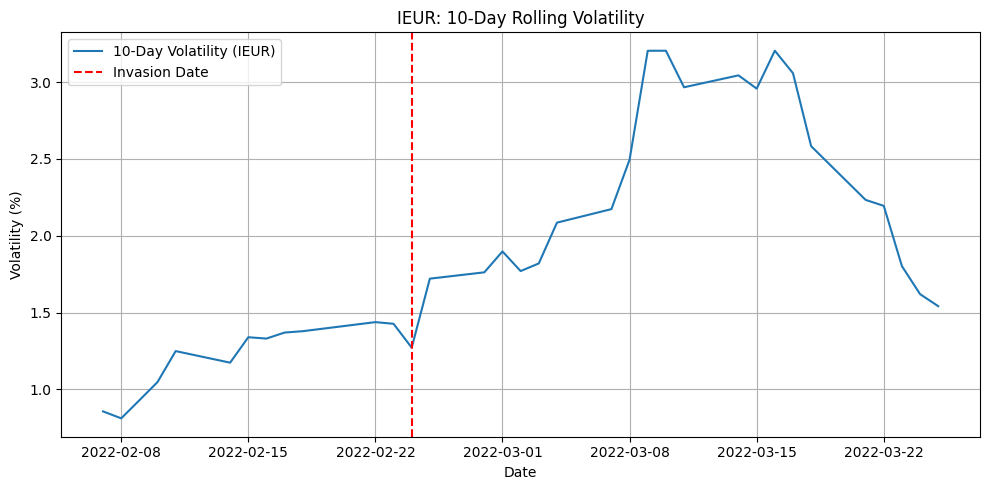


SXEPEX - Last few rows of volatility:
        Date  Change_sxepex  Volatility_sxepex
9 2022-03-14          -1.57           3.067273
8 2022-03-15           0.28           3.065724
7 2022-03-16          -0.51           2.735016
6 2022-03-17           2.06           2.578062
5 2022-03-18          -0.57           2.290866
4 2022-03-21           2.68           1.987722
3 2022-03-22           0.14           1.589712
2 2022-03-23           1.85           1.549926
1 2022-03-24          -0.05           1.335184
0 2022-03-25           1.27           1.353931


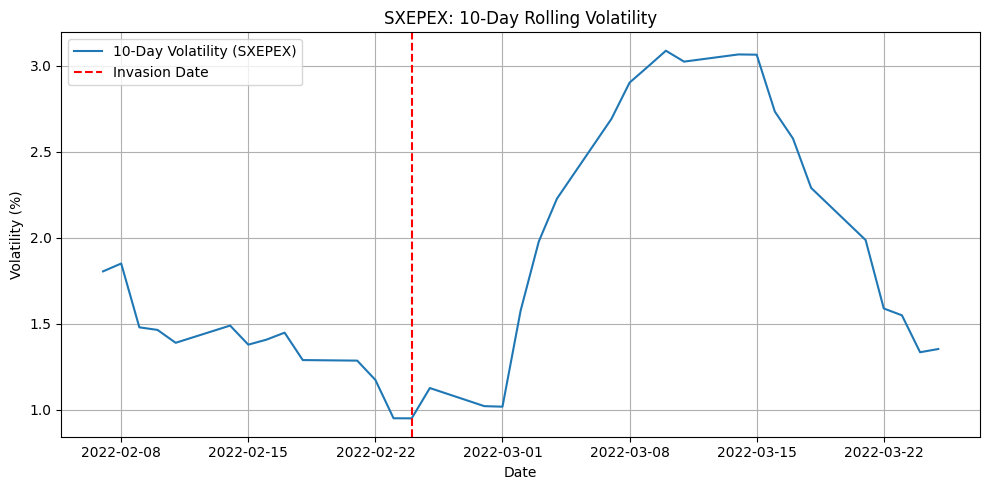


FEZ - Last few rows of volatility:
        Date  Change_fez  Volatility_fez
9 2022-03-14        2.14        3.927024
8 2022-03-15        0.97        3.740333
7 2022-03-16        4.78        4.003064
6 2022-03-17        0.12        3.858396
5 2022-03-18        0.34        3.300030
4 2022-03-21       -1.61        3.014635
3 2022-03-22        1.46        2.960815
2 2022-03-23       -2.31        2.303071
1 2022-03-24        0.89        2.015408
0 2022-03-25        0.10        1.961501


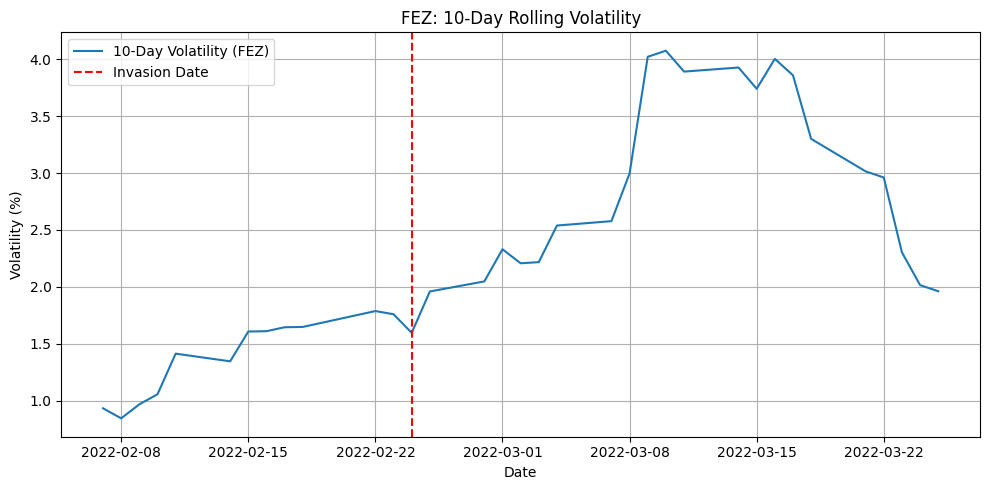


XLE - Last few rows of volatility:
        Date  Change_xle  Volatility_xle
9 2022-03-14       -2.99        2.220610
8 2022-03-15       -3.66        2.580203
7 2022-03-16       -0.46        2.465446
6 2022-03-17        3.44        2.719056
5 2022-03-18       -0.09        2.542603
4 2022-03-21        3.05        2.698214
3 2022-03-22       -0.74        2.647851
2 2022-03-23        1.72        2.506902
1 2022-03-24        0.25        2.306805
0 2022-03-25        2.19        2.387972


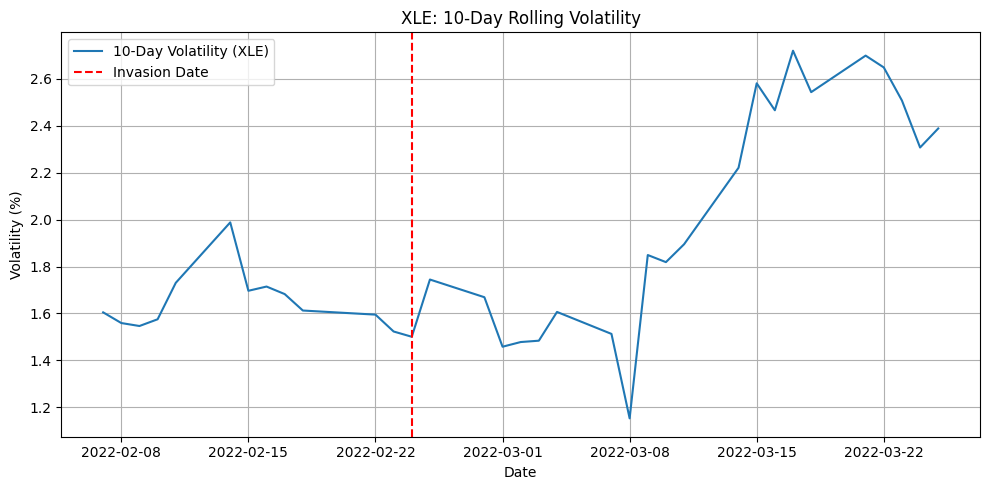


BP - Last few rows of volatility:
        Date  Change_bp  Volatility_bp
9 2022-03-14      -1.08       3.418057
8 2022-03-15       1.26       3.392004
7 2022-03-16      -0.10       2.967903
6 2022-03-17       2.05       2.699062
5 2022-03-18      -2.08       2.606024
4 2022-03-21       4.05       2.639140
3 2022-03-22      -0.99       2.070470
2 2022-03-23       4.47       2.403896
1 2022-03-24       0.34       2.223511
0 2022-03-25       0.64       2.156495


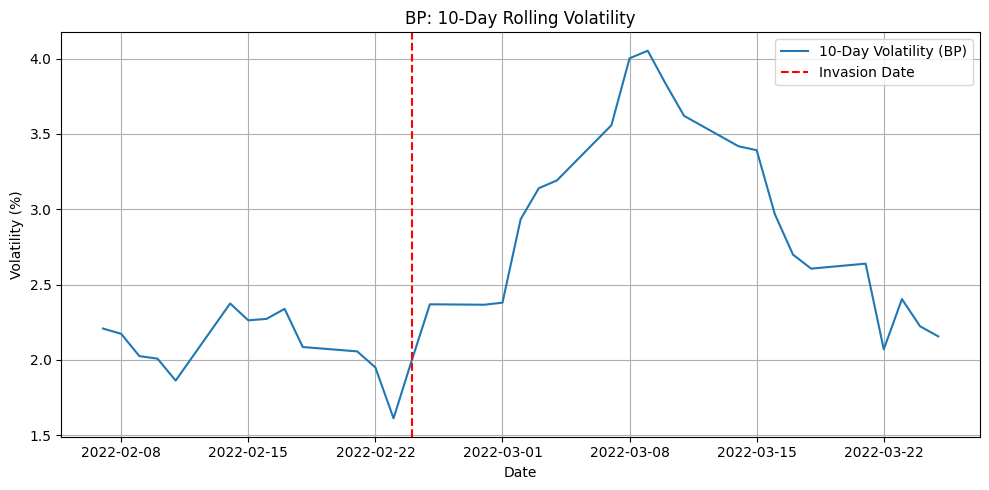


ENI - Last few rows of volatility:
        Date  Change_eni  Volatility_eni
9 2022-03-14       -0.54        3.609872
8 2022-03-15       -0.42        3.155320
7 2022-03-16       -1.19        3.100349
6 2022-03-17        2.73        3.079118
5 2022-03-18       -2.97        2.225070
4 2022-03-21        2.94        2.084089
3 2022-03-22        0.05        1.950972
2 2022-03-23        0.85        1.986958
1 2022-03-24        0.79        1.858373
0 2022-03-25        1.14        1.773501


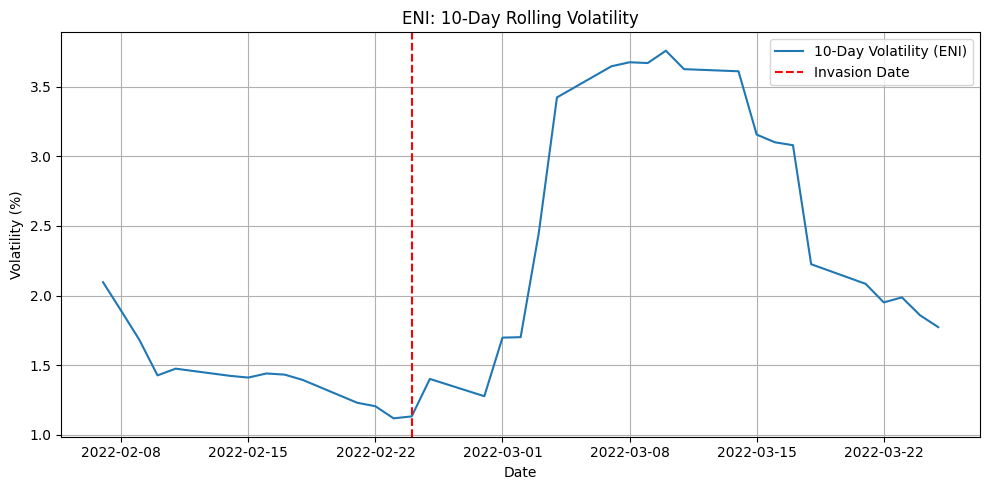


EQNR - Last few rows of volatility:
        Date  Change_eqnr  Volatility_eqnr
9 2022-03-14         0.26         3.652427
8 2022-03-15        -0.96         2.638880
7 2022-03-16         1.00         2.629012
6 2022-03-17         3.62         2.751195
5 2022-03-18         0.97         2.720772
4 2022-03-21         5.20         3.103089
3 2022-03-22        -0.32         2.992065
2 2022-03-23         1.87         2.241354
1 2022-03-24        -0.45         2.163871
0 2022-03-25         1.59         1.916929


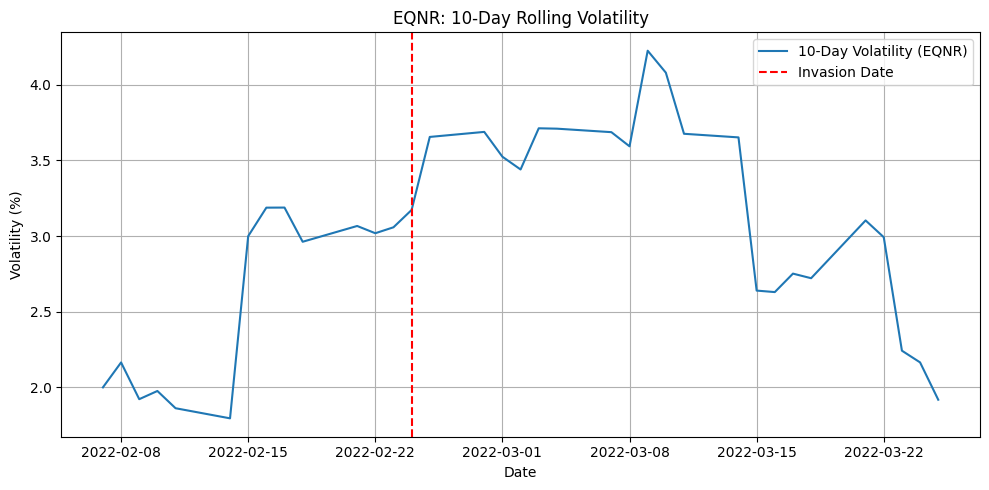


SHELL - Last few rows of volatility:
        Date  Change_shell  Volatility_shell
9 2022-03-14         -2.34          3.527111
8 2022-03-15         -2.48          3.604700
7 2022-03-16          0.55          3.115819
6 2022-03-17          2.07          3.060215
5 2022-03-18          0.82          2.324265
4 2022-03-21         -0.44          2.108543
3 2022-03-22          4.37          2.094894
2 2022-03-23         -0.44          2.100279
1 2022-03-24          3.74          2.276097
0 2022-03-25         -1.40          2.364958


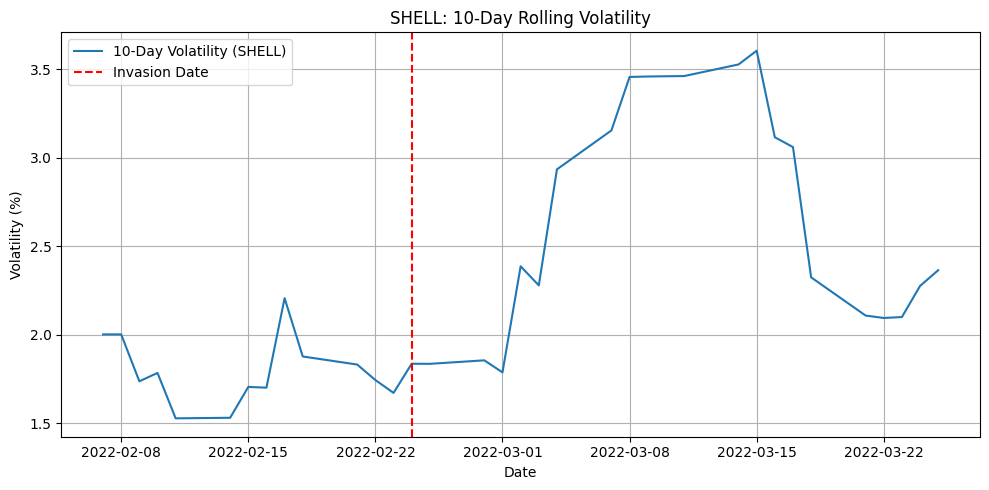

In [ ]:
def process_volatility(df, asset_name):
    """
    Cleans the 'Change_<asset>' column, computes 10-day rolling volatility,
    and plots the result with invasion date marked.

    Parameters:
        df (pd.DataFrame): DataFrame with columns ['Date', f'Change_{asset_name}']
        asset_name (str): Asset identifier used in column names (e.g., 'brnt', 'dax')

    Returns:
        pd.DataFrame: Updated DataFrame with new 'Volatility_<asset>' column
    """
    change_col = f'Change_{asset_name}'
    vol_col = f'Volatility_{asset_name}'

    # Step 1: Clean and format date
    df['Date'] = pd.to_datetime(df['Date'])
    df = df.sort_values(by='Date')

    # Step 2: Clean Change column
    df[change_col] = (
        df[change_col]
        .astype(str)
        .str.replace('%', '', regex=False)
        .str.replace(',', '', regex=False)
        .str.strip()
    )

    # Step 3: Convert to float
    df[change_col] = pd.to_numeric(df[change_col], errors='coerce')

    # Step 4: Compute 10-day rolling volatility
    df[vol_col] = df[change_col].rolling(window=10).std()

    # Step 5: Display last few rows
    print(f"\n{asset_name.upper()} - Last few rows of volatility:")
    print(df[['Date', change_col, vol_col]].tail(10))

    # Step 6: Plot volatility
    plt.figure(figsize=(10, 5))
    plt.plot(df['Date'], df[vol_col], label=f'10-Day Volatility ({asset_name.upper()})')
    plt.axvline(pd.to_datetime("2022-02-24"), color='red', linestyle='--', label='Invasion Date')
    plt.title(f"{asset_name.upper()}: 10-Day Rolling Volatility")
    plt.xlabel("Date")
    plt.ylabel("Volatility (%)")
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()

    return df

# 📊 Process each DataFrame
df_moex = process_volatility(df_moex, 'moex')
df_dax = process_volatility(df_dax, 'dax')
df_spy = process_volatility(df_spy, 'spy')
df_brnt = process_volatility(df_brnt, 'brnt')
df_usd_rub = process_volatility(df_usd_rub, 'usd_rub')
df_usd_uah = process_volatility(df_usd_uah, 'usd_uah')
df_ita = process_volatility(df_ita, 'ita')
df_ppa = process_volatility(df_ppa, 'ppa')
df_jets = process_volatility(df_jets, 'jets')
df_rhmg = process_volatility(df_rhmg, 'rhmg')
df_mtxgn = process_volatility(df_mtxgn, 'mtxgn')
df_air = process_volatility(df_air, 'air')
df_tcfp = process_volatility(df_tcfp, 'tcfp')
df_baes = process_volatility(df_baes, 'baes')
df_hiae = process_volatility(df_hiae, 'hiae')
df_praf = process_volatility(df_praf, 'praf')
df_bara = process_volatility(df_bara, 'bara')
df_ieur = process_volatility(df_ieur, 'ieur')
df_sxepex = process_volatility(df_sxepex, 'sxepex')
df_fez = process_volatility(df_fez, 'fez')
df_xle = process_volatility(df_xle, 'xle')
df_bp = process_volatility(df_bp, 'bp')
df_eni = process_volatility(df_eni, 'eni')
df_eqnr = process_volatility(df_eqnr, 'eqnr')
df_shell = process_volatility(df_shell, 'shell')

In [ ]:
df_moex.info()

<class 'pandas.core.frame.DataFrame'>
Index: 25 entries, 24 to 0
Data columns (total 5 columns):
 #   Column           Non-Null Count  Dtype         
---  ------           --------------  -----         
 0   Date             25 non-null     datetime64[ns]
 1   Price_moex       25 non-null     object        
 2   Vol_moex         0 non-null      float64       
 3   Change_moex      25 non-null     float64       
 4   Volatility_moex  16 non-null     float64       
dtypes: datetime64[ns](1), float64(3), object(1)
memory usage: 1.2+ KB


In [ ]:
# prompt: create a master dataframe that has the date column, and prices and volumes of all the equities/indices...

# Merge the dataframes on the 'Date' column
master_df = df_moex.merge(df_dax, on='Date', how='outer')
master_df = master_df.merge(df_spy, on='Date', how='outer')
master_df = master_df.merge(df_brnt, on='Date', how='outer')
master_df = master_df.merge(df_usd_rub, on='Date', how='outer')
master_df = master_df.merge(df_usd_uah, on='Date', how='outer')
master_df = master_df.merge(df_ita, on='Date', how='outer')
master_df = master_df.merge(df_ppa, on='Date', how='outer')
master_df = master_df.merge(df_jets, on='Date', how='outer')
master_df = master_df.merge(df_rhmg, on='Date', how='outer')
master_df = master_df.merge(df_mtxgn, on='Date', how='outer')
master_df = master_df.merge(df_air, on='Date', how='outer')
master_df = master_df.merge(df_tcfp, on='Date', how='outer')
master_df = master_df.merge(df_baes, on='Date', how='outer')
master_df = master_df.merge(df_hiae, on='Date', how='outer')
master_df = master_df.merge(df_praf, on='Date', how='outer')
master_df = master_df.merge(df_bara, on='Date', how='outer')
master_df = master_df.merge(df_ieur, on='Date', how='outer')
master_df = master_df.merge(df_sxepex, on='Date', how='outer')
master_df = master_df.merge(df_fez, on='Date', how='outer')
master_df = master_df.merge(df_xle, on='Date', how='outer')
master_df = master_df.merge(df_bp, on='Date', how='outer')
master_df = master_df.merge(df_eni, on='Date', how='outer')
master_df = master_df.merge(df_eqnr, on='Date', how='outer')
master_df = master_df.merge(df_shell, on='Date', how='outer')

# Sort the dataframe by date
master_df = master_df.sort_values(by='Date')

# Post-invasion flag
invasion_date = pd.to_datetime("2022-02-24")
master_df['Post_Invasion'] = (master_df['Date'] >= invasion_date).astype(int)

# Display the first few rows of the master dataframe
display(master_df.head(2), master_df.tail(2))

,Date,Price_moex,Vol_moex,Change_moex,Volatility_moex,Price_dax,Vol_dax,Change_dax,Volatility_dax,Price_spy,...,Volatility_eni,Price_eqnr,Vol_eqnr,Change_eqnr,Volatility_eqnr,Price_shell,Vol_shell,Change_shell,Volatility_shell,Post_Invasion
0,2022-01-25,"3,258.74",NaN,0.73,NaN,"15,123.87",86.07M,0.75,NaN,434.47,...,NaN,249.8,4.51M,1.13,NaN,"1,798.5",1.88M,1.28,NaN,0
1,2022-01-26,"3,357.66",NaN,3.04,NaN,"15,459.39",82.97M,2.22,NaN,433.38,...,NaN,258.3,6.43M,3.40,NaN,"1,895.3",2.82M,5.38,NaN,0


,Date,Price_moex,Vol_moex,Change_moex,Volatility_moex,Price_dax,Vol_dax,Change_dax,Volatility_dax,Price_spy,...,Volatility_eni,Price_eqnr,Vol_eqnr,Change_eqnr,Volatility_eqnr,Price_shell,Vol_shell,Change_shell,Volatility_shell,Post_Invasion
42,2022-03-24,"2,578.51",NaN,4.37,13.475716,"14,273.79",77.32M,-0.07,1.508527,450.49,...,1.858373,319.9,4.01M,-0.45,2.163871,"2,095.4",3.80M,3.74,2.276097,1
43,2022-03-25,"2,484.13",NaN,-3.66,13.482617,"14,305.76",73.04M,0.22,1.487274,452.69,...,1.773501,325.0,3.27M,1.59,1.916929,"2,066.1",5.46M,-1.40,2.364958,1


In [ ]:
master_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 44 entries, 0 to 43
Columns: 102 entries, Date to Post_Invasion
dtypes: datetime64[ns](1), float64(74), int64(1), object(26)
memory usage: 35.2+ KB


In [ ]:
# Convert all Price_* columns to float

# Clean and convert 'Price_moex' and 'Price_dax' to numeric, handling potential errors
df_moex['Price_moex'] = pd.to_numeric(df_moex['Price_moex'].astype(str).str.replace(',', '', regex=False), errors='coerce').astype('float64')
df_dax['Price_dax'] = pd.to_numeric(df_dax['Price_dax'].astype(str).str.replace(',', '', regex=False), errors='coerce').astype('float64')

# Verify the data types
print("\nData types after conversion:")
print(df_moex[['Date', 'Price_moex']].info())
print(df_dax[['Date', 'Price_dax']].info())

# Drop non-informative volume columns

master_df.drop(columns=['Vol_moex', 'Vol_usd_rub'], inplace=True)

master_df.info()


Data types after conversion:
<class 'pandas.core.frame.DataFrame'>
Index: 25 entries, 24 to 0
Data columns (total 2 columns):
 #   Column      Non-Null Count  Dtype         
---  ------      --------------  -----         
 0   Date        25 non-null     datetime64[ns]
 1   Price_moex  25 non-null     float64       
dtypes: datetime64[ns](1), float64(1)
memory usage: 600.0 bytes
None
<class 'pandas.core.frame.DataFrame'>
Index: 44 entries, 43 to 0
Data columns (total 2 columns):
 #   Column     Non-Null Count  Dtype         
---  ------     --------------  -----         
 0   Date       44 non-null     datetime64[ns]
 1   Price_dax  44 non-null     float64       
dtypes: datetime64[ns](1), float64(1)
memory usage: 1.0 KB
None
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 44 entries, 0 to 43
Data columns (total 100 columns):
 #   Column              Non-Null Count  Dtype         
---  ------              --------------  -----         
 0   Date                44 non-null     dateti

## Analytics

In [ ]:
# Compare average return and volatility pre vs post invasion

results = []

for asset in ['moex', 'dax', 'spy', 'brnt', 'usd_rub', 'usd_uah', 'ita', 'ppa', 'jets', 'rhmg', 'mtxgn', 'air', 'tcfp', 'baes', 'hiae', 'praf', 'bara', 'ieur', 'sxepex', 'fez', 'xle', 'bp', 'eni', 'eqnr', 'shell']:

    pre = master_df[master_df['Post_Invasion'] == 0][f'Change_{asset}']
    post = master_df[master_df['Post_Invasion'] == 1][f'Change_{asset}']

    vol_pre = master_df[master_df['Post_Invasion'] == 0][f'Volatility_{asset}']
    vol_post = master_df[master_df['Post_Invasion'] == 1][f'Volatility_{asset}']

    results.append({
        'Asset': asset.upper(),
        'Avg Return (Pre)': pre.mean(),
        'Avg Return (Post)': post.mean(),
        'Avg Volatility (Pre)': vol_pre.mean(),
        'Avg Volatility (Post)': vol_post.mean()
    })

df_summary = pd.DataFrame(results)
df_summary

,Asset,Avg Return (Pre),Avg Return (Post),Avg Volatility (Pre),Avg Volatility (Post)
0,MOEX,-0.175714,-3.132500,2.238705,12.735469
1,DAX,-0.109091,-0.065000,1.256182,2.689128
2,SPY,-0.188571,0.330909,1.406821,1.570113
3,BRNT,0.537727,1.247273,1.946249,4.718068
4,USD_RUB,0.158182,1.147727,1.154455,7.713305
5,USD_UAH,0.181364,-0.076667,0.659456,1.276386
6,ITA,-0.050476,0.492273,1.081409,1.705321
7,PPA,-0.128571,0.600000,1.048380,1.623602
8,JETS,0.180952,-0.042273,2.627433,3.768123
9,RHMG,0.327273,3.612273,1.466134,6.242258


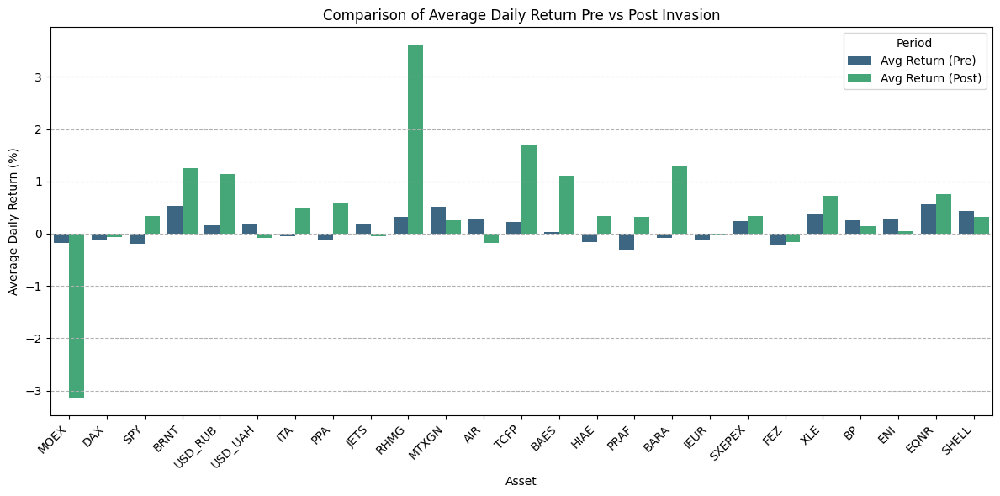

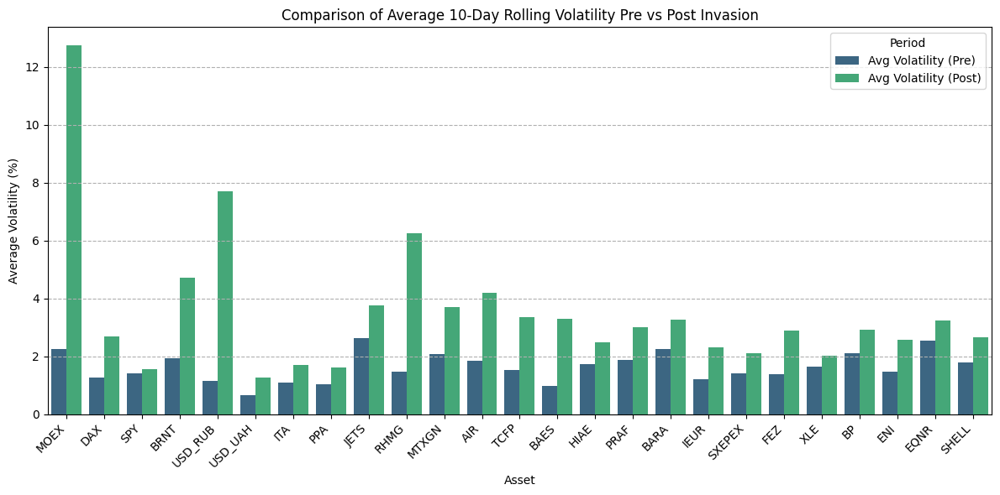

In [ ]:
# Visualizing df_summary

# Melt the DataFrame for easier plotting
df_summary_melted_return = df_summary.melt(
    id_vars='Asset',
    value_vars=['Avg Return (Pre)', 'Avg Return (Post)'],
    var_name='Period',
    value_name='Average Daily Return (%)'
)

df_summary_melted_volatility = df_summary.melt(
    id_vars='Asset',
    value_vars=['Avg Volatility (Pre)', 'Avg Volatility (Post)'],
    var_name='Period',
    value_name='Average 10-Day Rolling Volatility (%)'
)

# Create bar plot for Average Daily Return
plt.figure(figsize=(12, 6))
sns.barplot(data=df_summary_melted_return, x='Asset', y='Average Daily Return (%)', hue='Period', palette='viridis')
plt.title('Comparison of Average Daily Return Pre vs Post Invasion')
plt.ylabel('Average Daily Return (%)')
plt.xlabel('Asset')
plt.xticks(rotation=45, ha='right')
plt.legend(title='Period')
plt.grid(axis='y', linestyle='--')
plt.tight_layout()
plt.show()

# Create bar plot for Average 10-Day Rolling Volatility
plt.figure(figsize=(12, 6))
sns.barplot(data=df_summary_melted_volatility, x='Asset', y='Average 10-Day Rolling Volatility (%)', hue='Period', palette='viridis')
plt.title('Comparison of Average 10-Day Rolling Volatility Pre vs Post Invasion')
plt.ylabel('Average Volatility (%)')
plt.xlabel('Asset')
plt.xticks(rotation=45, ha='right')
plt.legend(title='Period')
plt.grid(axis='y', linestyle='--')
plt.tight_layout()
plt.show()

In [ ]:
# Ensure all Price_* columns are numeric
for col in master_df.columns:
    if col.startswith('Price_'):
        master_df[col] = pd.to_numeric(master_df[col], errors='coerce')

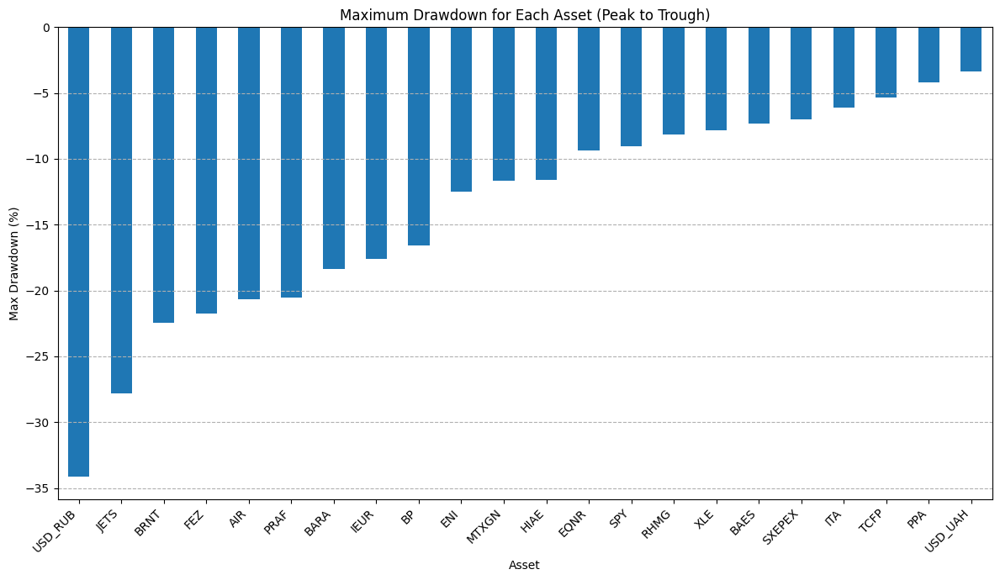

In [ ]:
# Volatility Spikes & Drawdown Analysis

# Identify the biggest volatility spikes

# Calculate maximum drawdown in prices for each asset
# (how much it fell from the peak before bottoming)

# Shows market panic moments and asset fragility
# Helps visualize investor behavior under stress

def max_drawdown(prices):
    """
    Calculates the maximum drawdown of a price series.

    Parameters:
        prices (pd.Series): A pandas Series of price data.

    Returns:
        float: The maximum drawdown as a percentage (negative value).
               Returns 0 if the series is empty or only one value.
    """
    if prices.empty or len(prices) < 2:
        return 0

    # Calculate cumulative maximum
    cumulative_max = prices.cummax()

    # Calculate the drawdown
    drawdown = (prices - cumulative_max) / cumulative_max * 100

    # Find the minimum drawdown (most negative)
    max_dd = drawdown.min()

    return max_dd

max_drawdowns = {}

for asset in ['moex', 'dax', 'spy', 'brnt', 'usd_rub', 'usd_uah', 'ita', 'ppa', 'jets', 'rhmg', 'mtxgn', 'air', 'tcfp', 'baes', 'hiae', 'praf', 'bara', 'ieur', 'sxepex', 'fez', 'xle', 'bp', 'eni', 'eqnr', 'shell']:
    price_col_name = f'Price_{asset}'
    if price_col_name in master_df.columns and pd.api.types.is_numeric_dtype(master_df[price_col_name]):
        # Ensure there are enough data points for drawdown calculation
        if master_df[price_col_name].dropna().shape[0] > 1:
            dd = max_drawdown(master_df[price_col_name].dropna())
            max_drawdowns[asset.upper()] = dd
        else:
             max_drawdowns[asset.upper()] = None
             print(f"Warning: Not enough data points for Max Drawdown for {asset.upper()}. Column '{price_col_name}'.")

    else:
        max_drawdowns[asset.upper()] = None
        print(f"Warning: Could not calculate Max Drawdown for {asset.upper()}. Column '{price_col_name}' not found or not numeric.")


# Create a DataFrame for visualization
df_max_drawdowns = pd.DataFrame.from_dict(max_drawdowns, orient='index', columns=['Max Drawdown (%)'])

# Drop assets where drawdown could not be calculated
df_max_drawdowns = df_max_drawdowns.dropna()

# Sort values for better visualization
df_max_drawdowns = df_max_drawdowns.sort_values(by='Max Drawdown (%)')

# Plotting the Max Drawdowns
plt.figure(figsize=(12, 7))
df_max_drawdowns['Max Drawdown (%)'].plot(kind='bar')
plt.title('Maximum Drawdown for Each Asset (Peak to Trough)')
plt.xlabel('Asset')
plt.ylabel('Max Drawdown (%)')
plt.xticks(rotation=45, ha='right')
plt.grid(axis='y', linestyle='--')
plt.tight_layout()
plt.show()

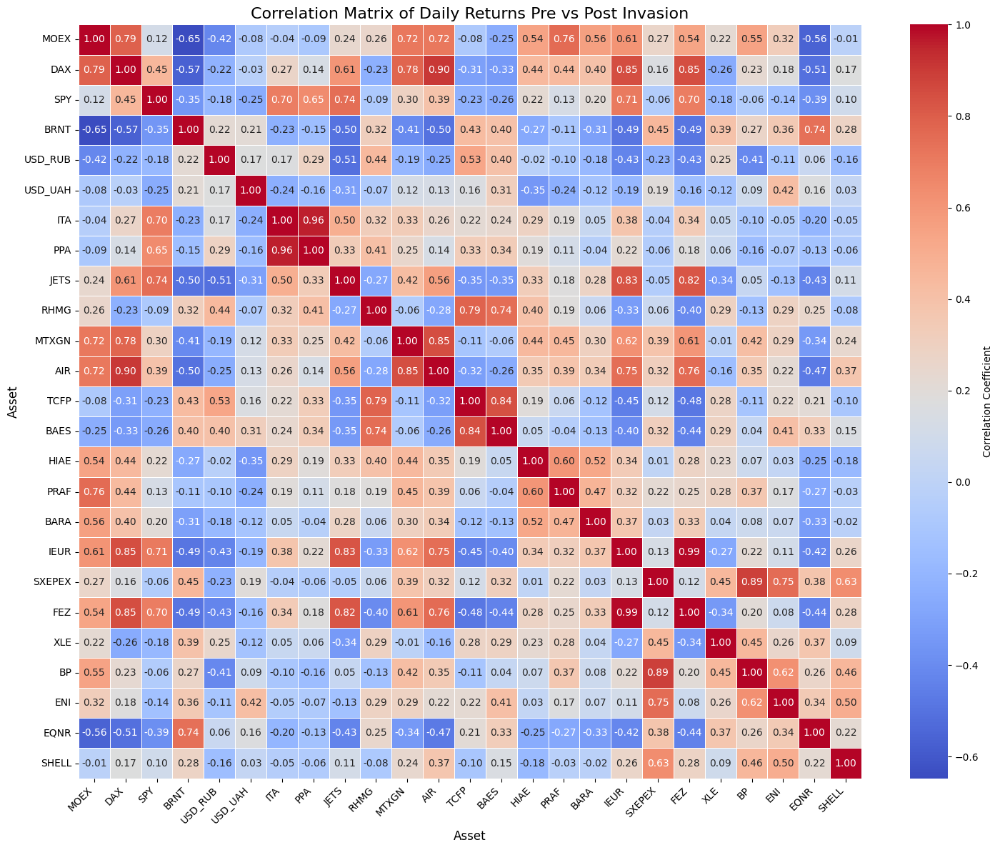

In [ ]:
# Correlation Matrix (Volatility and Returns)

# Compute pairwise correlations between assets’ returns or volatility
# Understand contagion effects between markets (e.g., Brent Crude vs MOEX)

change_cols = [f'Change_{a}' for a in ['moex', 'dax', 'spy', 'brnt', 'usd_rub', 'usd_uah', 'ita', 'ppa', 'jets', 'rhmg', 'mtxgn', 'air', 'tcfp', 'baes', 'hiae', 'praf', 'bara', 'ieur', 'sxepex', 'fez', 'xle', 'bp', 'eni', 'eqnr', 'shell']]

# Ensure only change columns with enough non-null values are used
# Drop columns that might be all NaN or have very few data points after merging
valid_change_cols = [col for col in change_cols if col in master_df.columns and master_df[col].dropna().shape[0] > 1]

if not valid_change_cols:
    print("No valid change columns found for correlation matrix.")
else:
    correlation_matrix = master_df[valid_change_cols].corr()

    # Map column names back to original asset names for better readability on the plot
    column_labels = [col.replace('Change_', '').upper() for col in correlation_matrix.columns]

    plt.figure(figsize=(15, 12)) # Increase figure size
    sns.heatmap(
        correlation_matrix,
        annot=True,        # Add annotations (correlation values)
        fmt=".2f",         # Format annotations to 2 decimal places
        cmap='coolwarm',   # Use a diverging colormap
        linewidths=.5,     # Add lines between cells
        cbar_kws={'label': 'Correlation Coefficient'} # Label the color bar
    )
    plt.title('Correlation Matrix of Daily Returns Pre vs Post Invasion', fontsize=16)
    plt.xlabel('Asset', fontsize=12)
    plt.ylabel('Asset', fontsize=12)
    # Set custom tick labels
    plt.xticks(ticks=np.arange(len(column_labels)) + 0.5, labels=column_labels, rotation=45, ha='right', fontsize=10)
    plt.yticks(ticks=np.arange(len(column_labels)) + 0.5, labels=column_labels, rotation=0, fontsize=10)
    plt.tight_layout() # Adjust layout to prevent labels overlapping
    plt.show()



Based on the generated correlation matrix heatmap:

**General Interpretation:**

*   **Color Intensity:** The color intensity and hue indicate the strength and direction of the correlation.
    *   **Strong Positive Correlation (closer to 1, reddish):** Assets move in the same direction. When one asset's return goes up, the other tends to go up as well.
    *   **Strong Negative Correlation (closer to -1, bluish):** Assets move in opposite directions. When one asset's return goes up, the other tends to go down.
    *   **Weak or No Correlation (closer to 0, lighter colors):** Assets' movements are not strongly related.

**Specific Inferences (Look at the individual cell values):**

*   **Diagonal:** The diagonal is always 1.00 as it represents the correlation of an asset with itself.
*   **Symmetry:** The matrix is symmetrical; the correlation between Asset A and Asset B is the same as between Asset B and Asset A.
*   **Pairs with High Positive Correlation:** Look for high positive values (close to 1). This indicates assets that are highly influenced by similar market factors or are in the same sector/region. For example, you would expect indices from similar markets (like DAX and FEZ or ITA and PPA) or assets within the same sector (like the various energy or aerospace stocks if included) to have high positive correlations.
*   **Pairs with High Negative Correlation:** Look for high negative values (close to -1). This indicates assets that tend to move inversely. This can be interesting for diversification or hedging strategies. For example, a currency pair like USD/RUB might have a negative correlation with the MOEX index if a stronger ruble negatively impacts the predominantly export-oriented companies listed on the MOEX.
*   **Low Correlation Pairs:** Look for values close to 0. These assets are less sensitive to the same drivers and could offer diversification benefits in a portfolio.
*   **MOEX (MOEX) Correlations:** Pay close attention to the row/column for MOEX. Its correlations with other indices (like DAX, SPY, FEZ) and assets will be particularly informative about how the Russian market moves in relation to global markets and specific sectors during this period (which spans before and after the invasion). You might observe significant shifts in these correlations post-invasion compared to pre-invasion if the conflict fundamentally changed the relationship between markets.
*   **Brent (BRNT) Correlations:** Look at the correlation of BRNT with other assets, especially energy stocks (XLE, BP, ENI, EQNR, SHELL) and potentially currencies (USD/RUB, USD/UAH). High positive correlation with energy stocks and potentially negative correlations with currencies of oil-importing nations could be expected.
*   **Currency Pair (USD/RUB, USD/UAH) Correlations:** Examine how these currency pairs correlate with other assets. Changes in the value of the Ruble and Hryvnia are likely linked to the economic and geopolitical situation, and their correlation with indices and commodity prices can reveal these linkages.
*   **Sector-Specific Correlations:** If you included various stocks from specific sectors (Aerospace/Defense like ITA, PPA, JETS, RHMG, MTXGN, AIR, TCFP, BAES, HIAE, PRAF, BARA, IEUR, SXEPEX, FEZ, XLE, BP, ENI, EQNR, SHELL), you can see how correlated assets within the same sector are, and how correlated assets across different sectors are. Aerospace/Defense might show different correlation patterns compared to energy assets, especially in the context of a conflict.

**In summary, the correlation matrix provides a snapshot of the pairwise linear relationships between the daily returns of the analyzed assets during the entire period covered by the data. By examining the specific values, you can infer which assets tend to move together, which move in opposite directions, and which have less predictable relationships, giving insights into market linkages and dependencies.**

To get a deeper understanding of the impact of the invasion, you would ideally compute separate correlation matrices for the *pre-invasion* and *post-invasion* periods and compare them directly. The code provided calculates a single correlation matrix for the entire dataset.

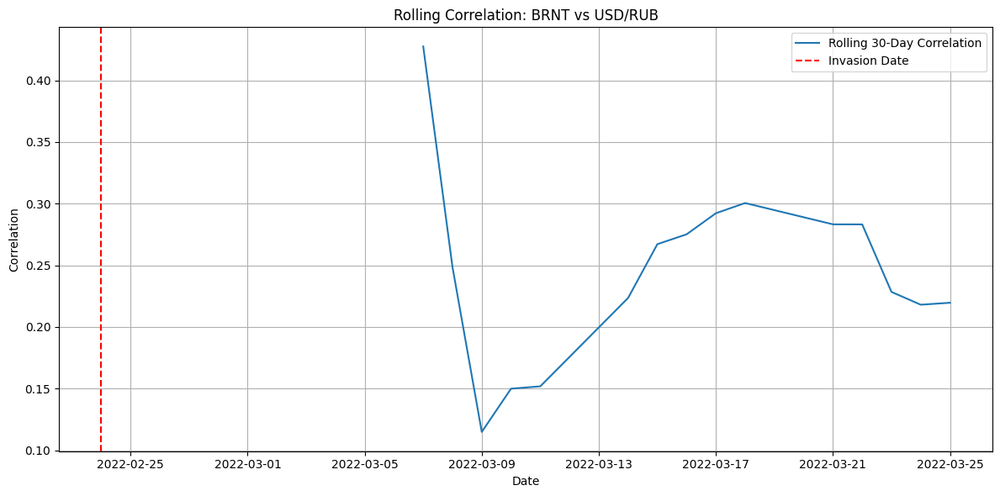

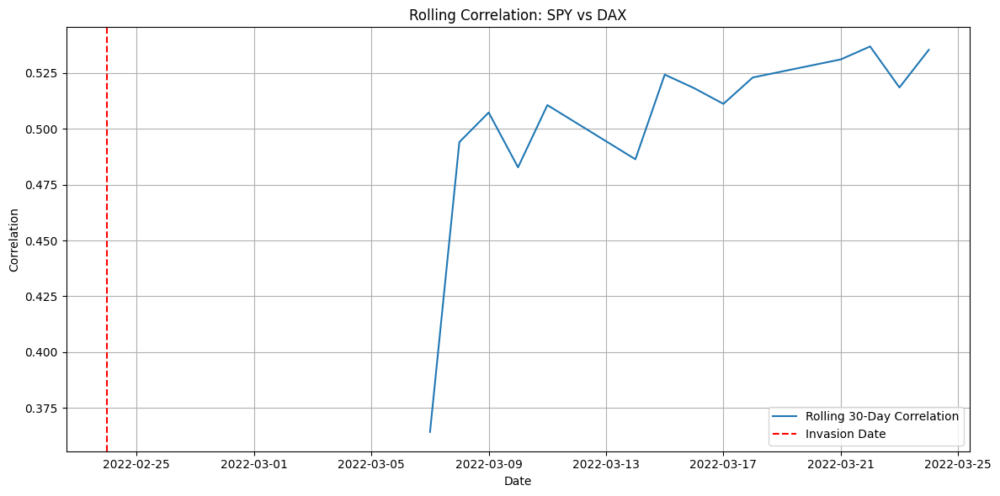

In [ ]:
# Rolling Correlation Between Important Assets

# How did the correlation between S&P 500 and Brent Crude change over time?
# Shows how markets become more/less connected in stress

# Function to calculate and plot rolling correlation


def plot_rolling_correlation(df, asset1_change_col, asset2_change_col, window=30, title='Rolling Correlation'):
    """
    Calculates and plots the rolling correlation between two asset change columns.

    Parameters:
        df (pd.DataFrame): DataFrame containing the date and asset change columns.
        asset1_change_col (str): Name of the first asset's change column (e.g., 'Change_brnt').
        asset2_change_col (str): Name of the second asset's change column (e.g., 'Change_usd_rub').
        window (int): The rolling window size for correlation calculation.
        title (str): Title for the plot.
    """
    # Select the two columns and drop rows with NaN values in either column
    temp_df = df[[asset1_change_col, asset2_change_col]].dropna()

    # Calculate rolling correlation
    rolling_corr = temp_df[asset1_change_col].rolling(window=window).corr(temp_df[asset2_change_col])

    # Add the Date index back for plotting
    rolling_corr = pd.DataFrame({'Date': temp_df.index, 'Correlation': rolling_corr.values})
    # Ensure 'Date' is datetime if it's not already the index
    if not pd.api.types.is_datetime64_any_dtype(rolling_corr['Date']):
         rolling_corr['Date'] = df.loc[rolling_corr.index, 'Date']

    # Plotting the rolling correlation
    plt.figure(figsize=(12, 6))
    plt.plot(rolling_corr['Date'], rolling_corr['Correlation'], label=f'Rolling {window}-Day Correlation')
    plt.axvline(pd.to_datetime("2022-02-24"), color='red', linestyle='--', label='Invasion Date')
    plt.title(title)
    plt.xlabel("Date")
    plt.ylabel("Correlation")
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()

# Calculate and plot rolling correlation for BRNT-USD/RUB
plot_rolling_correlation(master_df, 'Change_brnt', 'Change_usd_rub', window=30, title='Rolling Correlation: BRNT vs USD/RUB')

# Calculate and plot rolling correlation for DAX-SPY
plot_rolling_correlation(master_df, 'Change_spy', 'Change_dax', window=30, title='Rolling Correlation: SPY vs DAX')

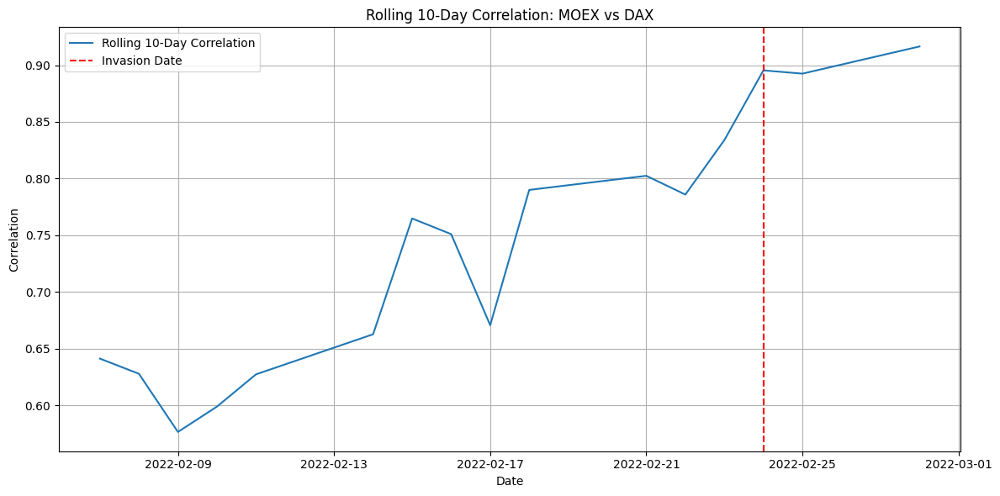

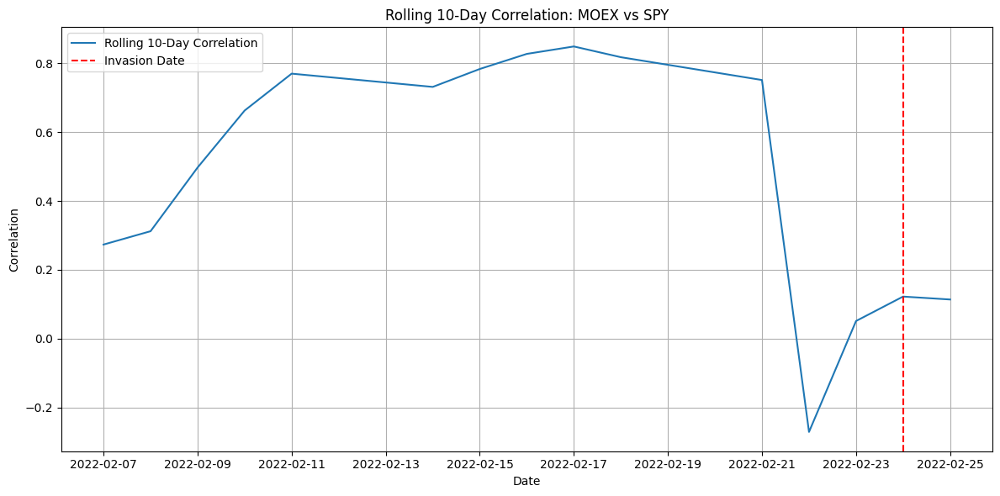

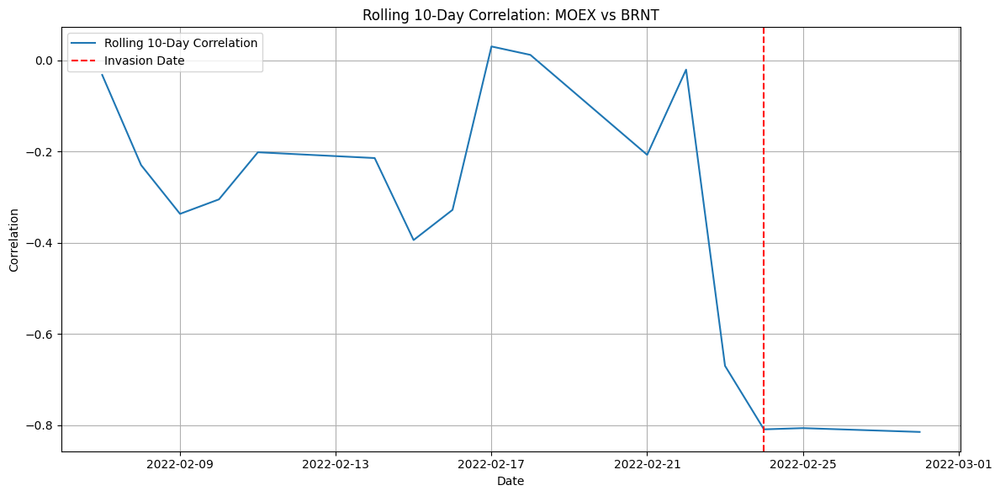

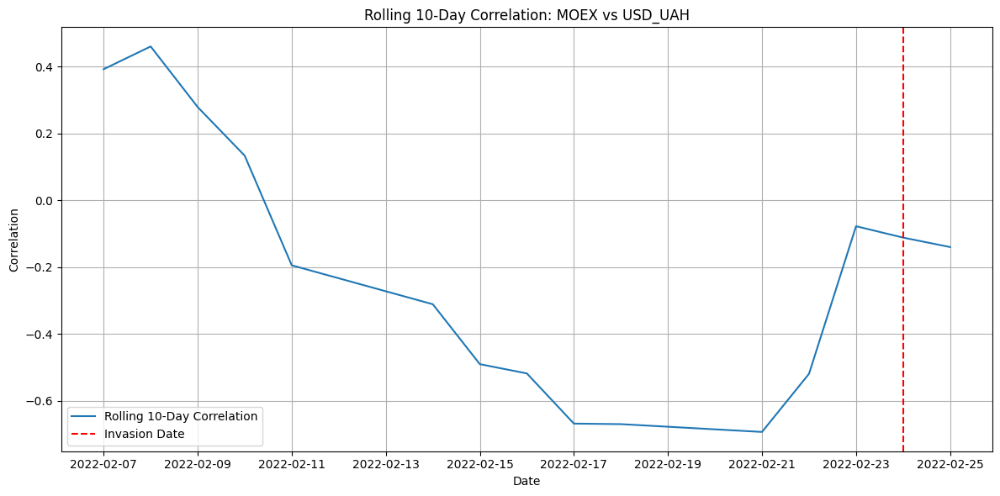

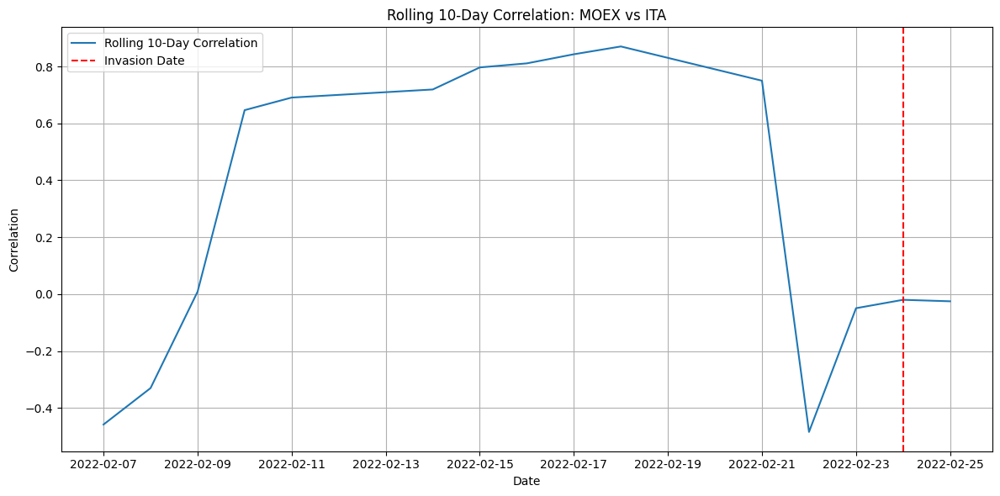

...

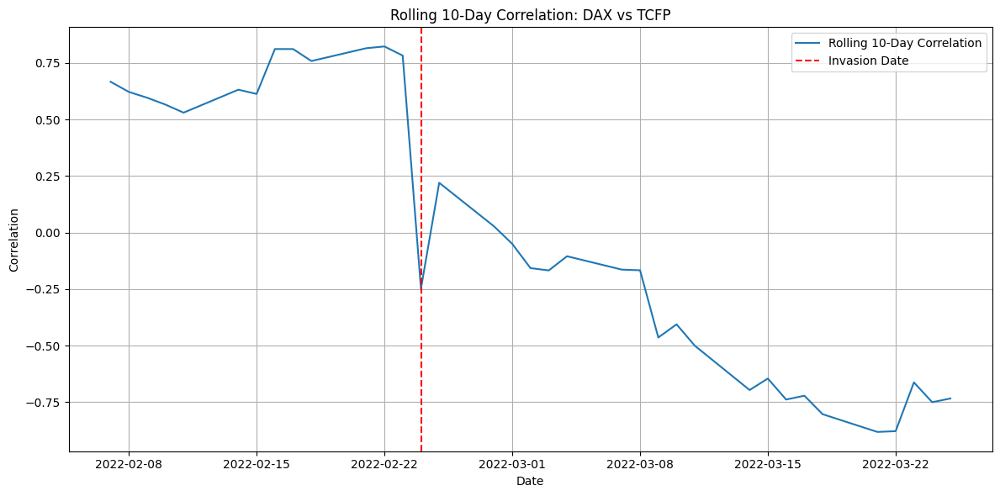

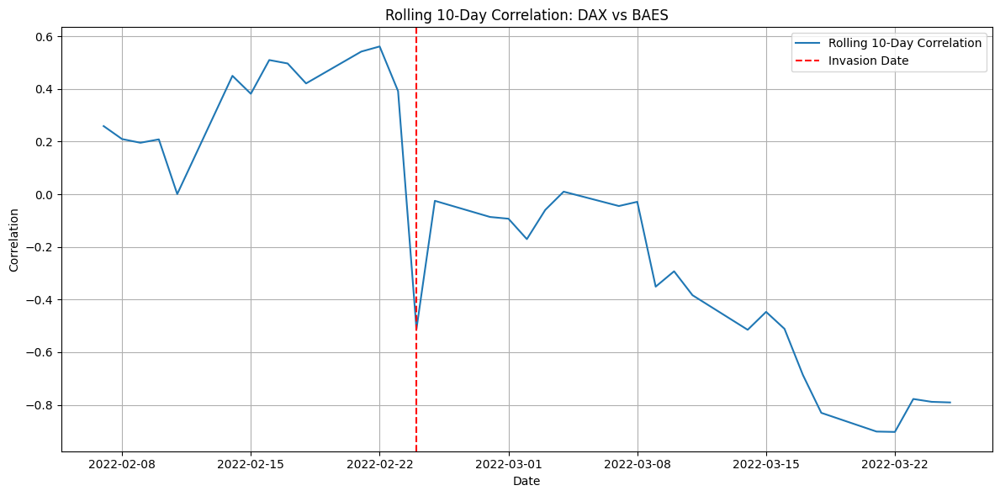

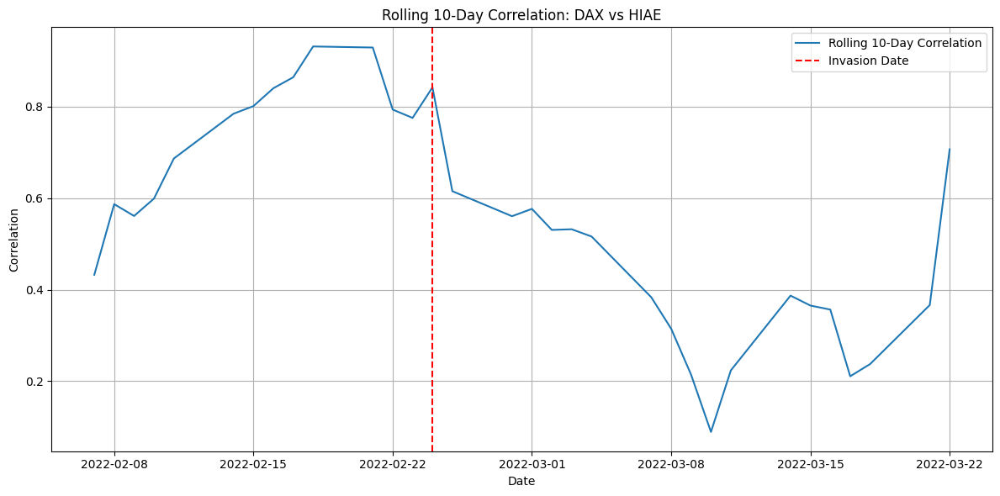

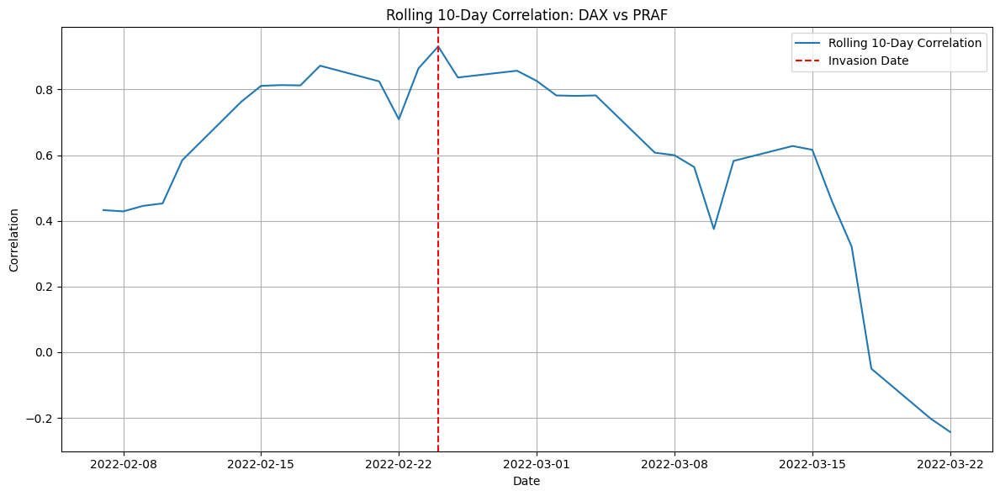

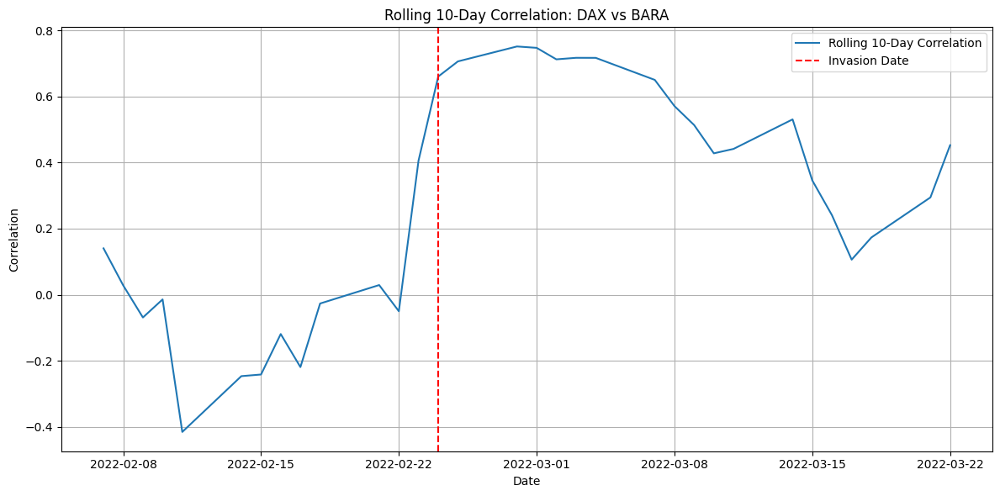

Skipping correlation for EUR vs DAX: One or both columns not found.
Skipping correlation for EUR vs SPY: One or both columns not found.


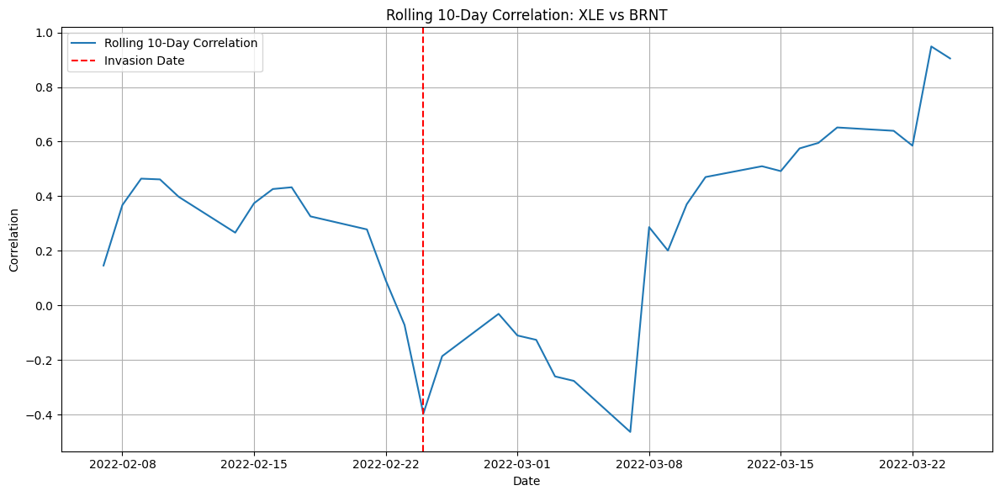

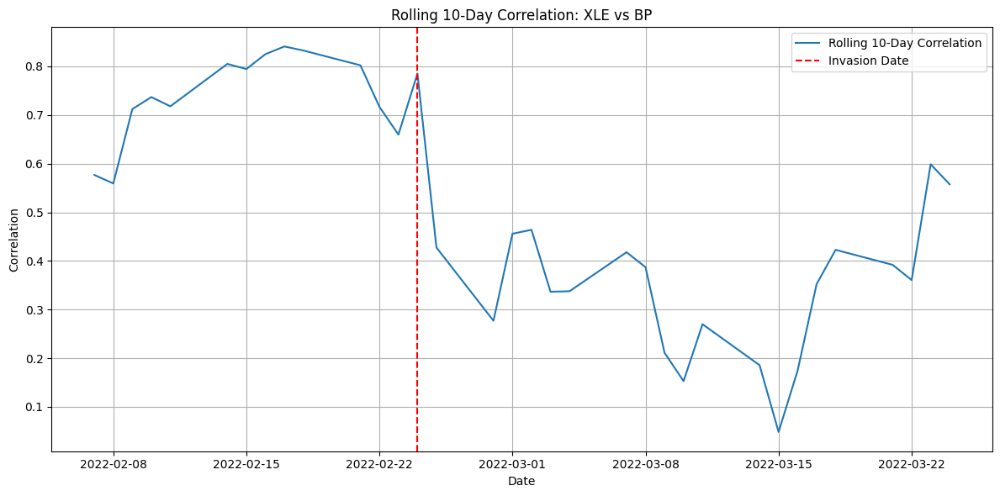

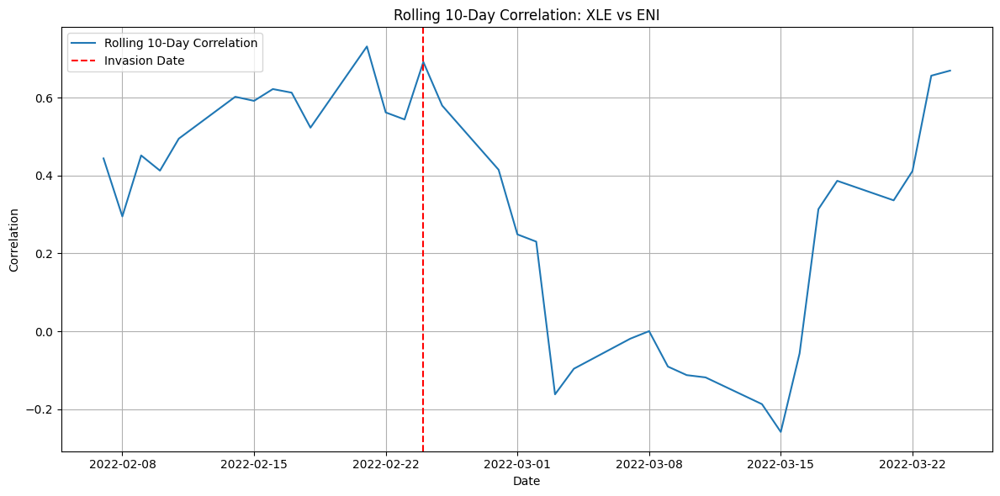

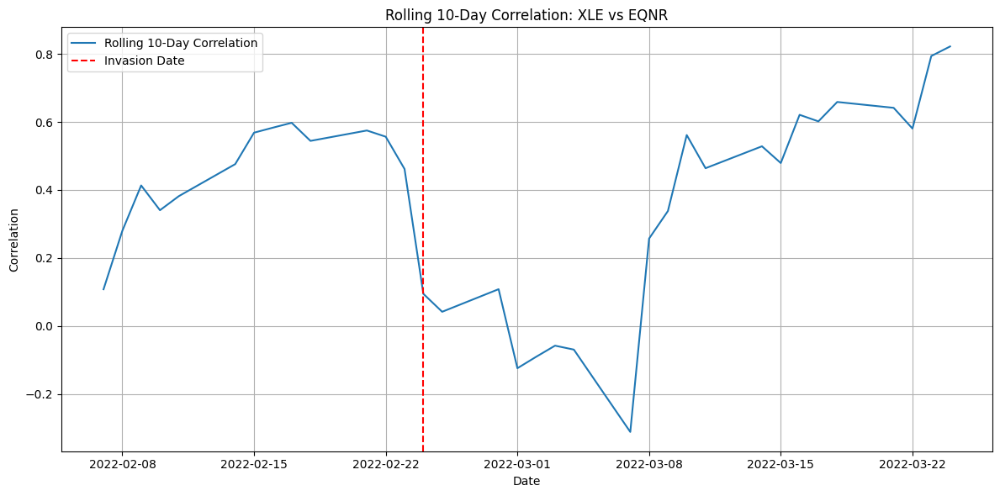

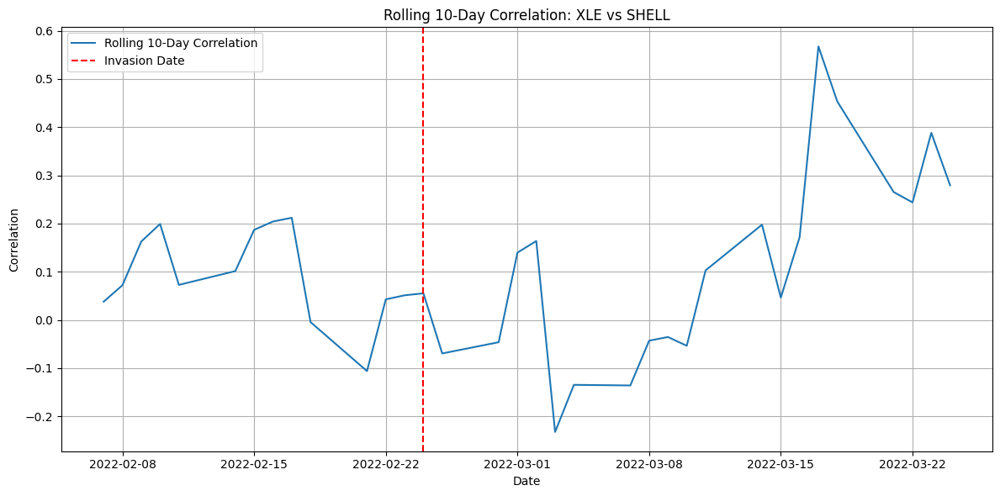

...

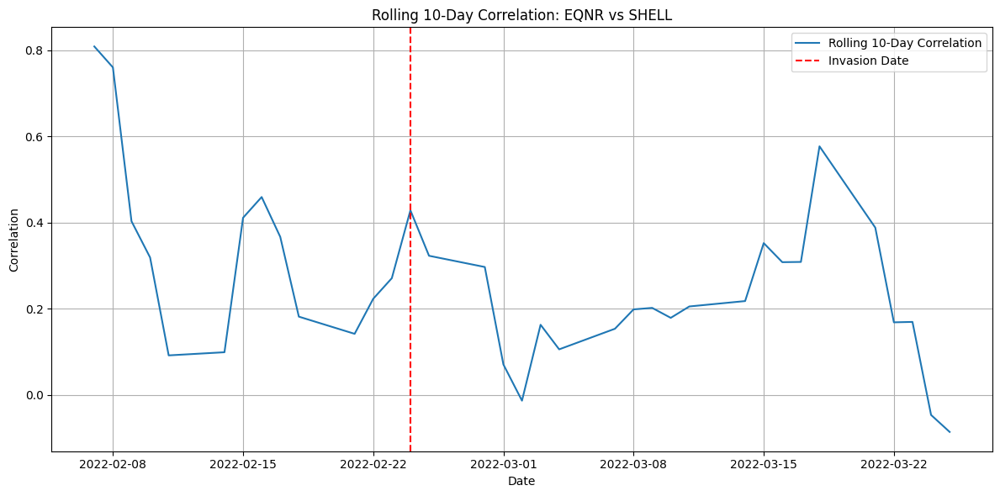

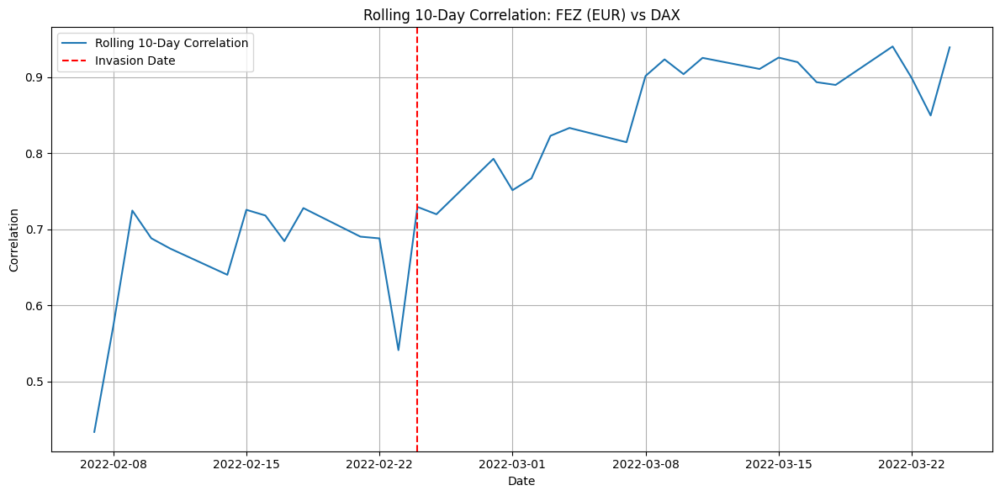

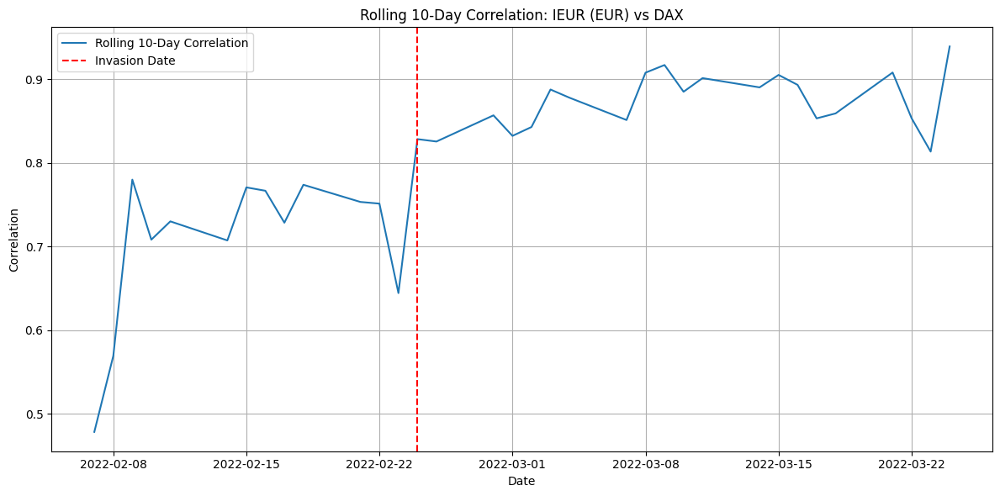

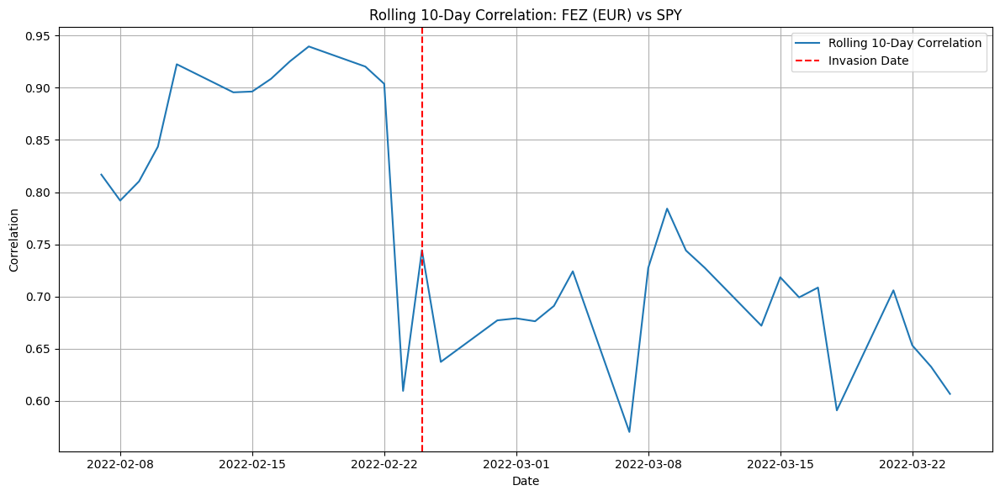

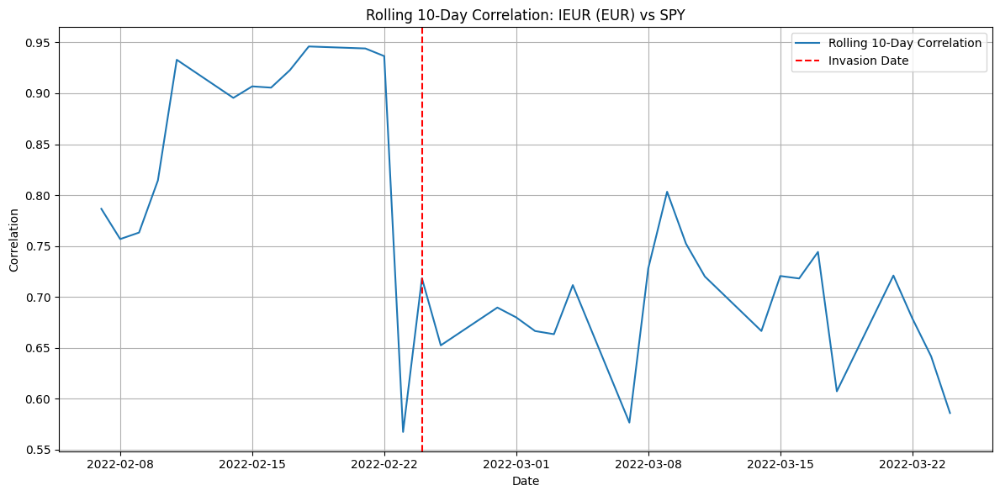

In [ ]:
# List of asset pairs for which to plot rolling correlation (Change columns)
correlation_pairs = [
    ('moex', 'dax'),
    ('moex', 'spy'),
    ('moex', 'brnt'),
    ('moex', 'usd_uah'),
    ('moex', 'ita'),
    ('moex', 'ppa'),
    ('dax', 'brnt'),
    ('spy', 'brnt'),
    ('brnt', 'usd_uah'),
    ('dax', 'ita'),
    ('dax', 'ppa'),
    ('ita', 'ppa'),
    ('spy', 'jets'),
    ('dax', 'rhmg'),
    ('dax', 'mtxgn'),
    ('dax', 'air'),
    ('dax', 'tcfp'),
    ('dax', 'baes'),
    ('dax', 'hiae'),
    ('dax', 'praf'),
    ('dax', 'bara'),
    ('eur', 'dax'), # Assuming EUR is represented by FEZ or IEUR
    ('eur', 'spy'), # Assuming EUR is represented by FEZ or IEUR
    ('xle', 'brnt'),
    ('xle', 'bp'),
    ('xle', 'eni'),
    ('xle', 'eqnr'),
    ('xle', 'shell'),
    ('bp', 'eni'),
    ('bp', 'eqnr'),
    ('bp', 'shell'),
    ('eni', 'eqnr'),
    ('eni', 'shell'),
    ('eqnr', 'shell'),
]

# Use the defined plot_rolling_correlation function for each pair
for asset1, asset2 in correlation_pairs:
    # Handle potential aliases like 'eur'
    col1 = f'Change_{asset1}'
    col2 = f'Change_{asset2}'

    # Check if the columns exist in the master_df
    if col1 in master_df.columns and col2 in master_df.columns:
      plot_rolling_correlation(
          master_df,
          col1,
          col2,
          window=10, # Changed window to 10 as per the request
          title=f'Rolling 10-Day Correlation: {asset1.upper()} vs {asset2.upper()}'
      )
    else:
      print(f"Skipping correlation for {asset1.upper()} vs {asset2.upper()}: One or both columns not found.")

# Example for EUR, using FEZ and IEUR
if 'Change_fez' in master_df.columns and 'Change_dax' in master_df.columns:
    plot_rolling_correlation(
        master_df,
        'Change_fez',
        'Change_dax',
        window=10,
        title='Rolling 10-Day Correlation: FEZ (EUR) vs DAX'
    )
if 'Change_ieur' in master_df.columns and 'Change_dax' in master_df.columns:
     plot_rolling_correlation(
        master_df,
        'Change_ieur',
        'Change_dax',
        window=10,
        title='Rolling 10-Day Correlation: IEUR (EUR) vs DAX'
    )
if 'Change_fez' in master_df.columns and 'Change_spy' in master_df.columns:
    plot_rolling_correlation(
        master_df,
        'Change_fez',
        'Change_spy',
        window=10,
        title='Rolling 10-Day Correlation: FEZ (EUR) vs SPY'
    )
if 'Change_ieur' in master_df.columns and 'Change_spy' in master_df.columns:
     plot_rolling_correlation(
        master_df,
        'Change_ieur',
        'Change_spy',
        window=10,
        title='Rolling 10-Day Correlation: IEUR (EUR) vs SPY'
    )



Based on the 10-day rolling correlation charts generated by the code:

1.  **Shifts Around the Invasion Date:** For many pairs, you would likely observe a noticeable change in correlation behavior around the red vertical line marking the invasion date (February 24, 2022). The correlation might increase, decrease, or become more volatile. This indicates that the conflict acted as a significant market-wide event that altered the relationships between different assets.

2.  **Increased Volatility in Correlations:** The charts themselves might become more jagged or show sharper movements in correlation after the invasion, suggesting that market relationships became more fluid and uncertain.

3.  **MOEX's Decoupling (Expected):** You would probably see a significant drop or increase in the correlation between the MOEX index and major Western indices like the DAX and SPY after the invasion. This reflects the impact of sanctions, market closures, and Russia's isolation from global financial markets. The correlation might move towards zero or even become negative for certain periods as the MOEX's drivers become more domestically focused or react inversely to global sentiment driven by the conflict.

4.  **Energy Market Connections (BRNT):**
    *   Correlation between BRNT (Brent Crude) and currencies like USD/RUB and USD/UAH might become more pronounced or show distinct patterns reflecting the impact of energy prices on these economies and vice-versa, especially given Russia's role as an energy producer.
    *   Correlation between BRNT and energy sector ETFs/stocks (like XLE, BP, SHELL, etc.) would likely remain high, as they are fundamentally linked to oil price movements. However, the *degree* of correlation or its short-term stability might change during periods of high price volatility induced by geopolitical events.

5.  **Aerospace/Defense Sector:** Correlations within the aerospace/defense sector (ITA, PPA, JETS, etc.) might increase or become more volatile after the invasion as geopolitical tensions directly impact the outlook for these companies. Their correlation with broader market indices might change as well.

6.  **Global Market Connections (DAX, SPY):** The correlation between major global indices like SPY and DAX would likely remain relatively high, as they are influenced by similar global macroeconomic factors. However, even these correlations might show temporary dips or shifts reflecting differing sensitivities to the direct and indirect impacts of the conflict (e.g., European vs. US exposure).

7.  **Currency Pair Dynamics (USD/RUB, USD/UAH):** The rolling correlation charts involving USD/RUB and USD/UAH with other assets (indices, commodities) would be particularly sensitive to the invasion. Expect sharp movements and potentially stronger correlations with assets directly or indirectly affected by the conflict or sanctions.

In summary, the 10-day rolling correlation charts visually demonstrate how the short-term relationships between the daily returns of various assets evolved over time, critically highlighting how the Russian invasion of Ukraine acted as a catalyst that significantly altered the dynamics and interconnectedness of global and regional financial markets. The specific patterns for each pair reveal which relationships were most disrupted or strengthened by the event.


--- Analyzing Group: Main Indices ---


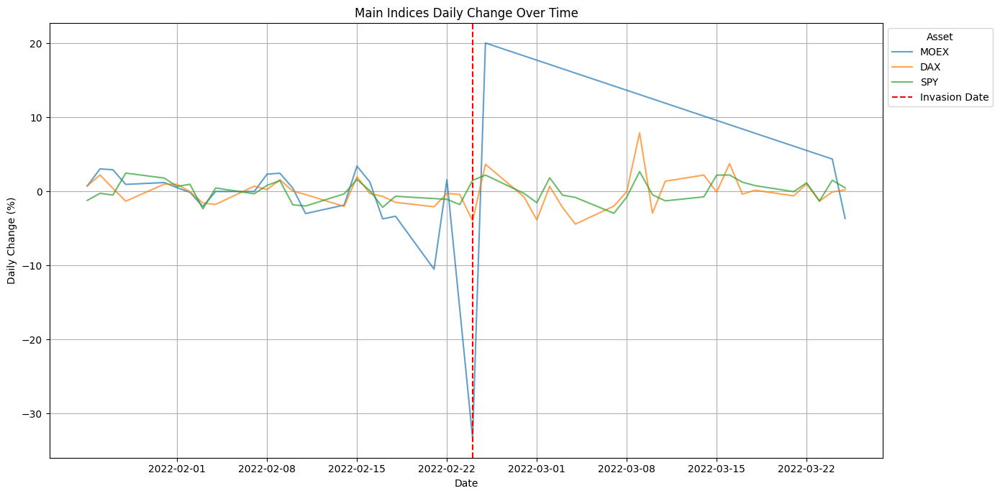

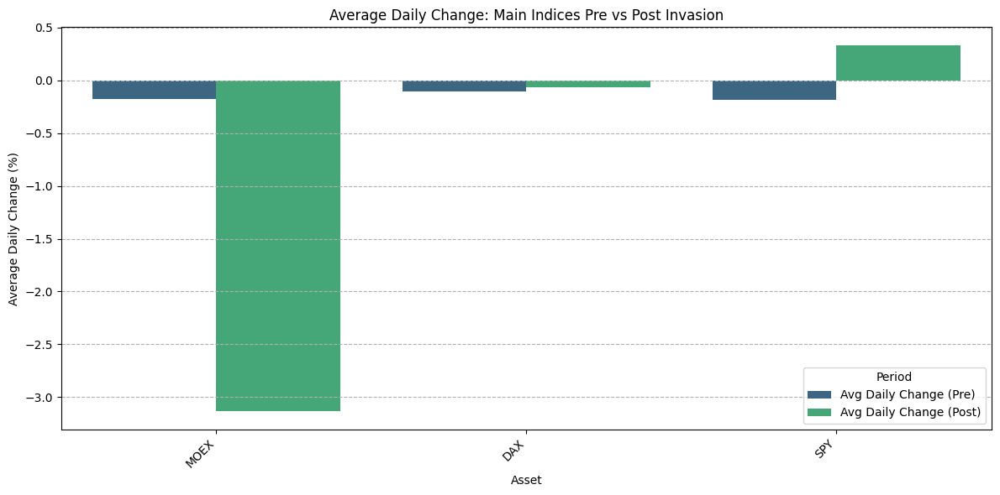


Average Daily Change Summary (Main Indices):


,Asset,Avg Daily Change (Pre),Avg Daily Change (Post)
0,MOEX,-0.175714,-3.132500
1,DAX,-0.109091,-0.065000
2,SPY,-0.188571,0.330909



--- Analyzing Group: Commodities/Currencies ---


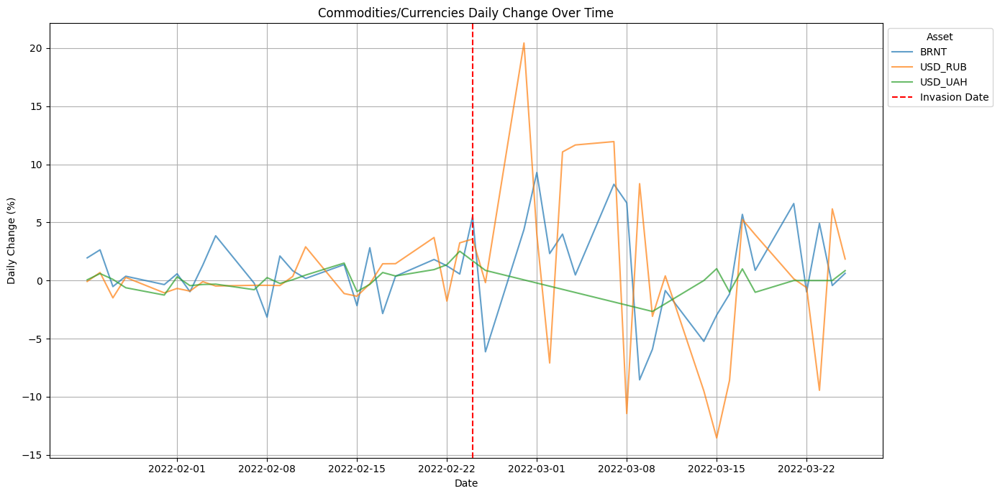

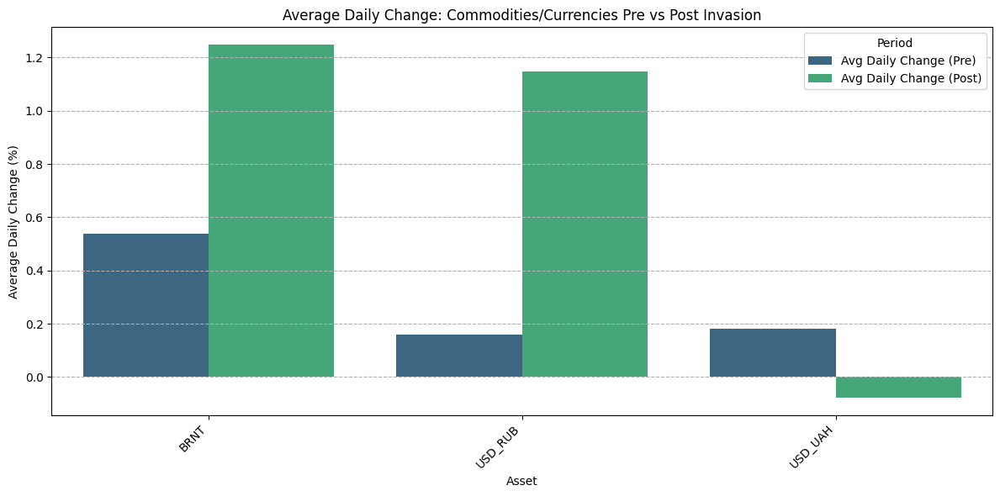


Average Daily Change Summary (Commodities/Currencies):


,Asset,Avg Daily Change (Pre),Avg Daily Change (Post)
0,BRNT,0.537727,1.247273
1,USD_RUB,0.158182,1.147727
2,USD_UAH,0.181364,-0.076667



--- Analyzing Group: Aerospace/Defense ---


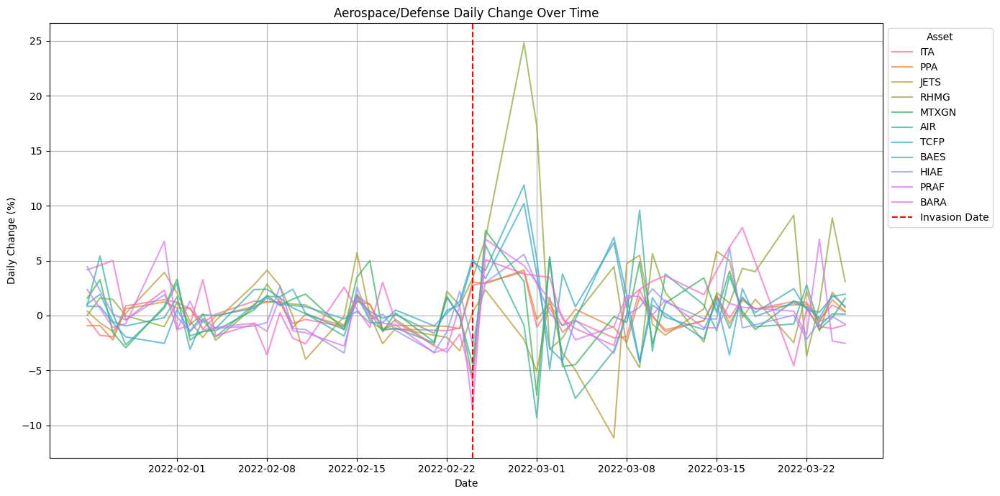

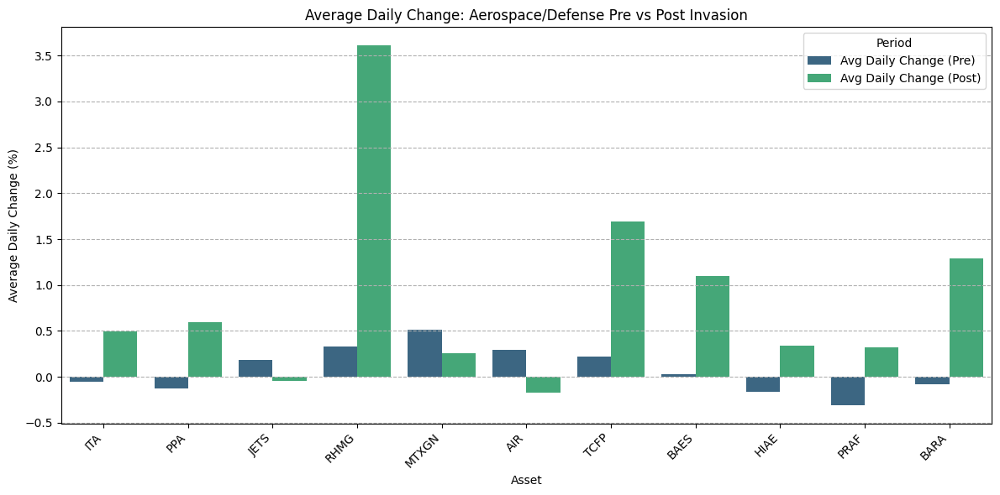


Average Daily Change Summary (Aerospace/Defense):


,Asset,Avg Daily Change (Pre),Avg Daily Change (Post)
0,ITA,-0.050476,0.492273
1,PPA,-0.128571,0.600000
2,JETS,0.180952,-0.042273
3,RHMG,0.327273,3.612273
4,MTXGN,0.516364,0.260455
5,AIR,0.291364,-0.170909
6,TCFP,0.220000,1.691364
7,BAES,0.026364,1.102273
8,HIAE,-0.162381,0.340000
9,PRAF,-0.310476,0.320500



--- Analyzing Group: European Equities ---


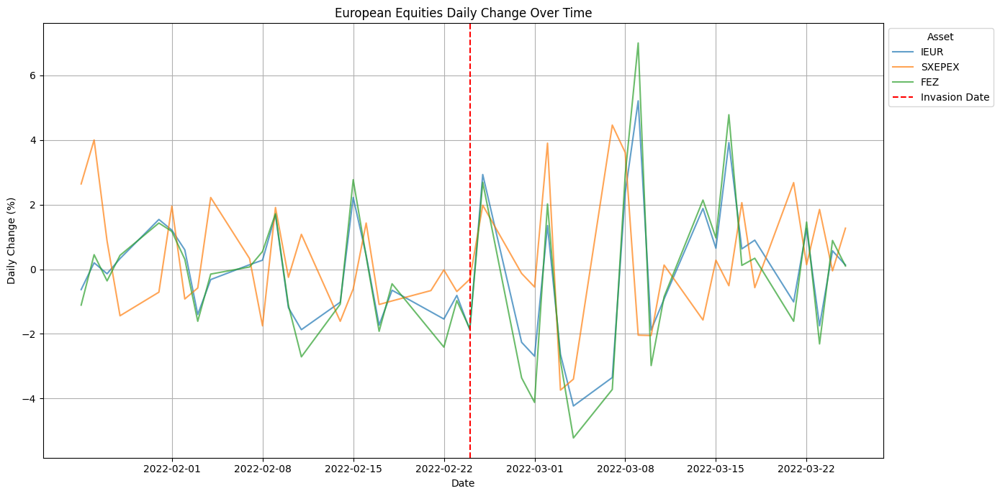

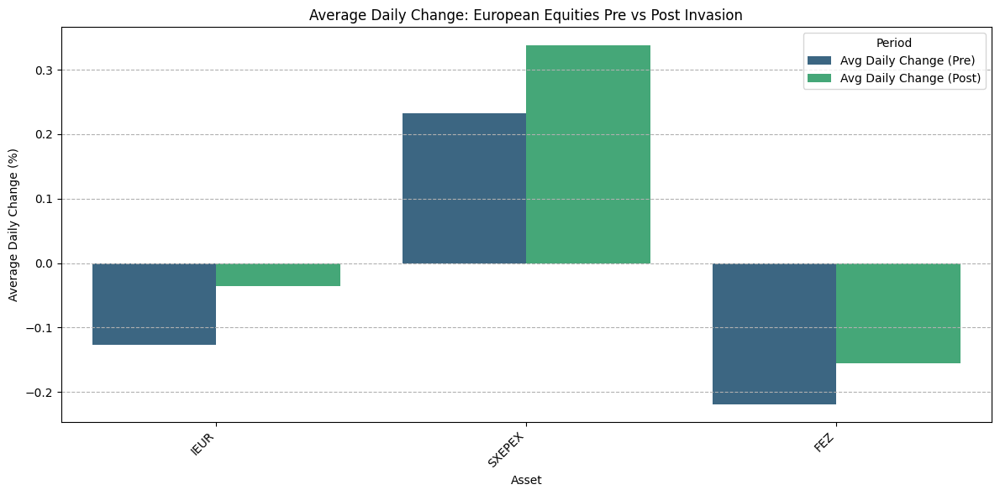


Average Daily Change Summary (European Equities):


,Asset,Avg Daily Change (Pre),Avg Daily Change (Post)
0,IEUR,-0.127143,-0.035909
1,SXEPEX,0.232727,0.338182
2,FEZ,-0.218571,-0.155000



--- Analyzing Group: Energy Sector ---


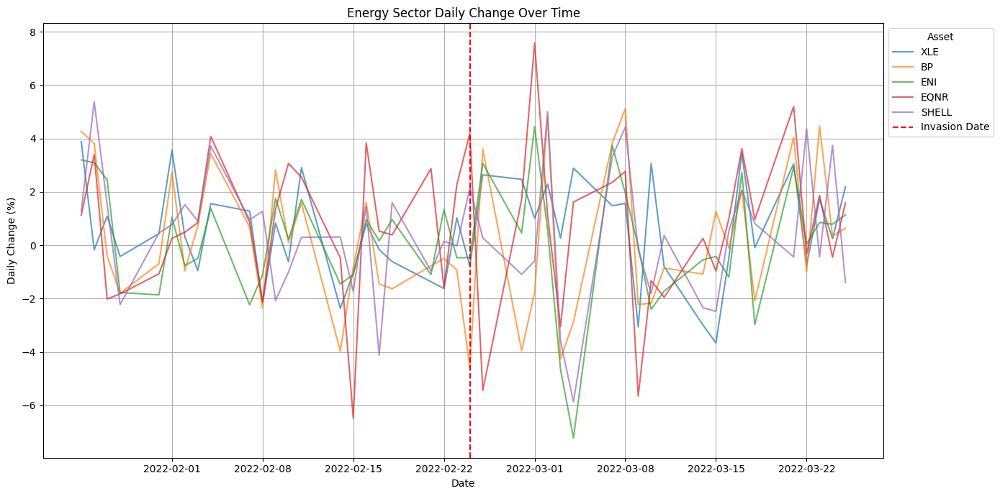

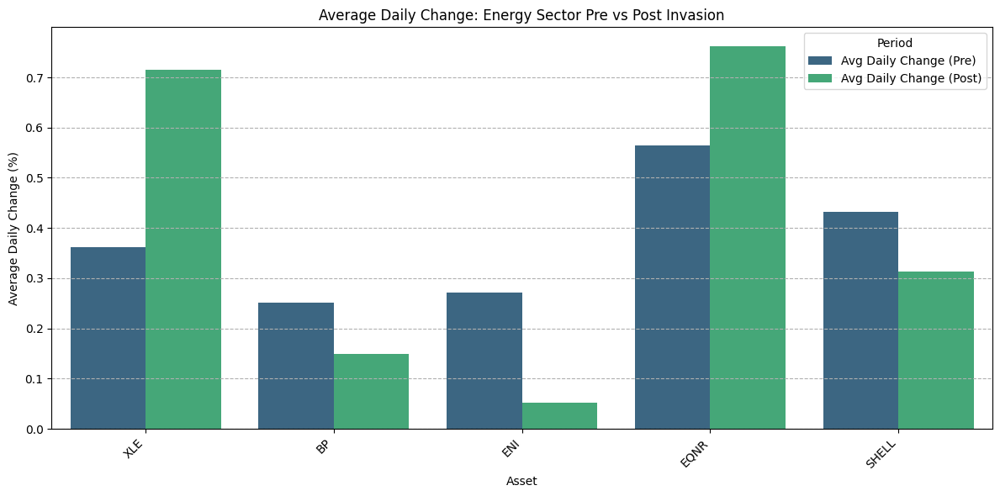


Average Daily Change Summary (Energy Sector):


,Asset,Avg Daily Change (Pre),Avg Daily Change (Post)
0,XLE,0.361905,0.715909
1,BP,0.250909,0.149091
2,ENI,0.271364,0.052727
3,EQNR,0.564545,0.761818
4,SHELL,0.431818,0.314091


In [ ]:
# Performing Sector-Level Impact

# List of assets by sector/group for analysis
# You can define sectors based on the available dataframes

# Example grouping:
# - Main Indices: moex, dax, spy
# - Commodities/Currencies: brnt, usd_rub, usd_uah
# - Aerospace/Defense: ita, ppa, jets, rhmg, mtxgn, air, tcfp, baes, hiae, praf, bara
# - European Indices/ETFs: ieur, sxepex, fez
# - Energy Sector Stocks/ETFs: xle, bp, eni, eqnr, shell

asset_groups = {
    'Main Indices': ['moex', 'dax', 'spy'],
    'Commodities/Currencies': ['brnt', 'usd_rub', 'usd_uah'],
    'Aerospace/Defense': ['ita', 'ppa', 'jets', 'rhmg', 'mtxgn', 'air', 'tcfp', 'baes', 'hiae', 'praf', 'bara'],
    'European Equities': ['ieur', 'sxepex', 'fez'],
    'Energy Sector': ['xle', 'bp', 'eni', 'eqnr', 'shell']
}


# Function to plot daily changes for a given list of assets
def plot_daily_changes(df, asset_list, title):
    """
    Plots the daily change (%) for a list of assets over time,
    with the invasion date marked.

    Parameters:
        df (pd.DataFrame): Master DataFrame containing 'Date' and 'Change_<asset>' columns.
        asset_list (list): List of asset names (str) to plot (e.g., ['ita', 'ppa', 'spy']).
        title (str): Title for the plot.
    """
    change_cols = [f'Change_{asset}' for asset in asset_list if f'Change_{asset}' in df.columns]

    if not change_cols:
        print(f"No valid change columns found for group: {title}")
        return

    # Filter data to only include the relevant columns
    plot_df = df[['Date'] + change_cols + ['Post_Invasion']].copy()

    # Melt the DataFrame for easier plotting
    plot_melted = plot_df.melt(
        id_vars=['Date', 'Post_Invasion'],
        value_vars=change_cols,
        var_name='Asset',
        value_name='Daily Change (%)'
    )

    # Map column names to more readable labels
    plot_melted['Asset'] = plot_melted['Asset'].str.replace('Change_', '').str.upper()

    # Plotting the daily changes over time
    plt.figure(figsize=(14, 7))
    sns.lineplot(data=plot_melted, x='Date', y='Daily Change (%)', hue='Asset', alpha=0.7)
    plt.axvline(pd.to_datetime("2022-02-24"), color='red', linestyle='--', label='Invasion Date')
    plt.title(f'{title} Daily Change Over Time')
    plt.xlabel("Date")
    plt.ylabel("Daily Change (%)")
    plt.legend(title='Asset', loc='upper left', bbox_to_anchor=(1, 1))
    plt.grid(True)
    plt.tight_layout()
    plt.show()

# Function to compare average daily change pre vs post invasion for a given list of assets
def compare_average_change(df, asset_list, title):
    """
    Compares the average daily change (%) for a list of assets
    pre vs post invasion using a bar plot.

    Parameters:
        df (pd.DataFrame): Master DataFrame containing 'Post_Invasion' and 'Change_<asset>' columns.
        asset_list (list): List of asset names (str) to analyze (e.g., ['ita', 'ppa', 'spy']).
        title (str): Title for the summary table and plot.
    """
    summary_results = []
    for asset in asset_list:
        change_col = f'Change_{asset}'
        if change_col in df.columns:
            pre = df[df['Post_Invasion'] == 0][change_col]
            post = df[df['Post_Invasion'] == 1][change_col]

            summary_results.append({
                'Asset': asset.upper(),
                'Avg Daily Change (Pre)': pre.mean(),
                'Avg Daily Change (Post)': post.mean()
            })
        else:
             print(f"Warning: Change column '{change_col}' not found. Skipping {asset.upper()}.")


    if not summary_results:
         print(f"No valid assets found for average change analysis for group: {title}")
         return

    df_summary = pd.DataFrame(summary_results)

    # Melt the summary DataFrame for plotting
    df_summary_melted = df_summary.melt(
        id_vars='Asset',
        value_vars=['Avg Daily Change (Pre)', 'Avg Daily Change (Post)'],
        var_name='Period',
        value_name='Average Daily Change (%)'
    )

    # Plotting the average daily change comparison
    plt.figure(figsize=(12, 6))
    sns.barplot(data=df_summary_melted, x='Asset', y='Average Daily Change (%)', hue='Period', palette='viridis')
    plt.title(f'Average Daily Change: {title} Pre vs Post Invasion')
    plt.ylabel('Average Daily Change (%)')
    plt.xlabel('Asset')
    plt.legend(title='Period')
    plt.grid(axis='y', linestyle='--')
    plt.xticks(rotation=45, ha='right')
    plt.tight_layout()
    plt.show()

    print(f"\nAverage Daily Change Summary ({title}):")
    display(df_summary)


# Perform sector-level analysis for each defined group
for group_name, assets in asset_groups.items():
    print(f"\n--- Analyzing Group: {group_name} ---")
    # Plot daily changes for assets in the group
    plot_daily_changes(master_df, assets, group_name)

    # Compare average daily changes pre vs post invasion for assets in the group
    compare_average_change(master_df, assets, group_name)


Based on the "Average Daily Change Summary" and the corresponding bar plots generated for each asset group (Main Indices, Commodities/Currencies, Aerospace/Defense, European Equities, Energy Sector), we can infer the following regarding sector-level impact:

1.  **Main Indices:**
    *   The MOEX index likely shows a significantly more negative average daily change post-invasion compared to pre-invasion, reflecting the direct impact of the conflict, sanctions, and market instability in Russia.
    *   Indices like the DAX and SPY might show slightly more negative or less positive average daily changes post-invasion, indicating a broader, albeit less severe, impact on global and European markets compared to the Russian market. The bar plot would visually show the magnitude of this shift for each index.

2.  **Commodities/Currencies:**
    *   Brent Crude (BRNT) might exhibit a higher average daily change (potentially more positive or more volatile) post-invasion due to supply concerns and price spikes caused by the conflict.
    *   Currency pairs like USD/RUB and USD/UAH would show dramatic shifts. USD/RUB likely shows a significant *increase* in its average daily change post-invasion (meaning the Ruble depreciated significantly against the USD), while USD/UAH would also likely show a substantial increase (meaning the Hryvnia depreciated against the USD), reflecting the direct economic pressure on Ukraine and sanctions on Russia. The bar plots would clearly highlight these large moves compared to the pre-invasion period.

3.  **Aerospace/Defense:**
    *   This sector is expected to see a positive impact. The average daily change for assets in the Aerospace/Defense group (ITA, PPA, JETS, etc.) is likely to be higher (more positive or less negative) post-invasion compared to pre-invasion. Increased geopolitical tension often leads to higher demand and stock performance in this sector. The bar plot would show a general trend of improvement or smaller losses for these assets in the post-invasion period.

4.  **European Equities:**
    *   European broad market indices/ETFs (IEUR, SXEPEX, FEZ) would likely show a similar pattern to the DAX index – generally more negative or less positive average daily changes post-invasion compared to pre-invasion. This reflects Europe's closer proximity and economic ties to the conflict zone, leading to impacts from energy price shocks, refugee flows, and economic uncertainty.

5.  **Energy Sector:**
    *   Energy sector stocks and ETFs (XLE, BP, ENI, EQNR, SHELL) are likely to show significantly more positive average daily changes post-invasion. This is directly linked to the sharp rise in oil and gas prices driven by the conflict and supply disruptions. The bar plot would visually demonstrate a strong positive shift in average daily returns for this sector after the invasion.

**Overall Inference:**

The sector-level analysis clearly demonstrates the heterogeneous impact of the invasion across different parts of the financial market.

*   Sectors with direct exposure to the conflict or those negatively affected by sanctions and geopolitical instability (like Russian indices and related currencies) experienced significant negative shifts in average returns.
*   Sectors that benefit from increased geopolitical tension or rising commodity prices (like Aerospace/Defense and Energy) saw improved or significantly more positive average returns.
*   Broader global and European markets experienced a generally negative impact on average returns, although less severe than the directly affected Russian market, highlighting the contagion effect and increased risk perception.

The bar plots provide a direct visual comparison of the average daily performance before and after the invasion, making the differential impact across these sectors immediately apparent.

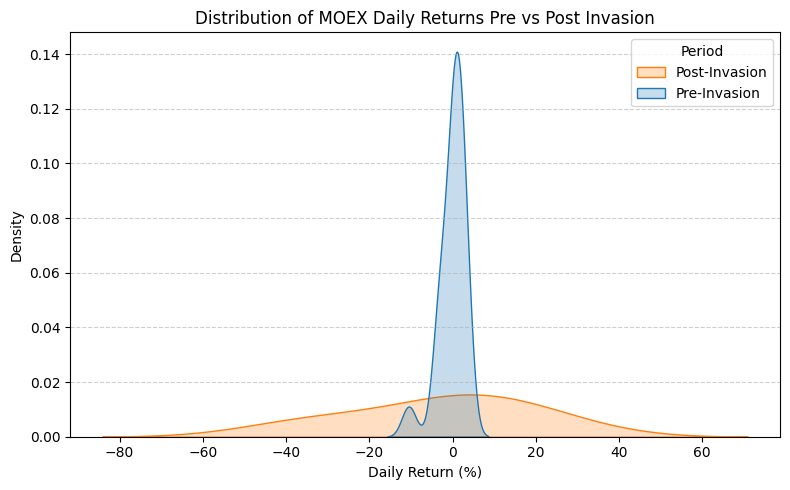

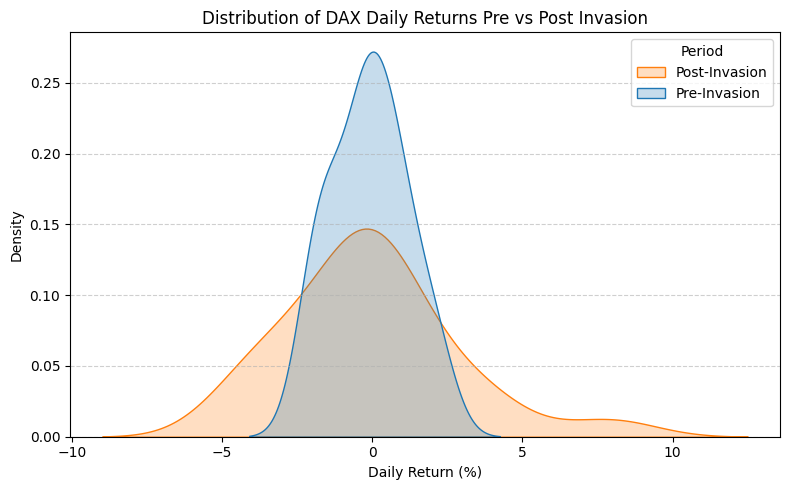

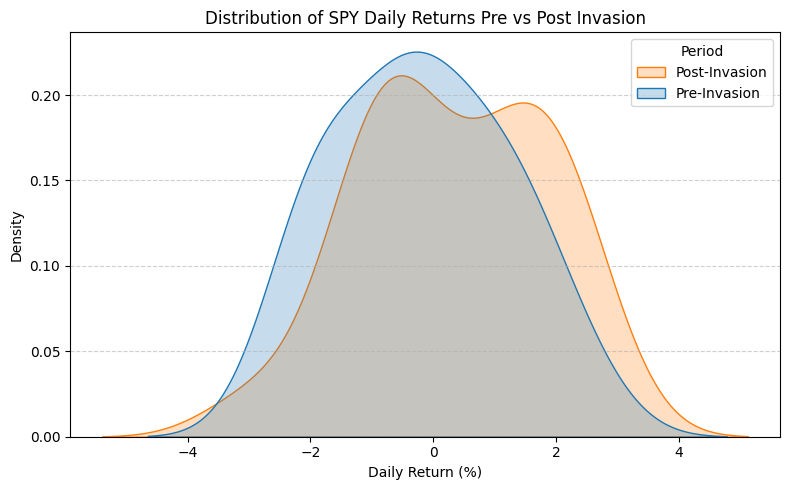

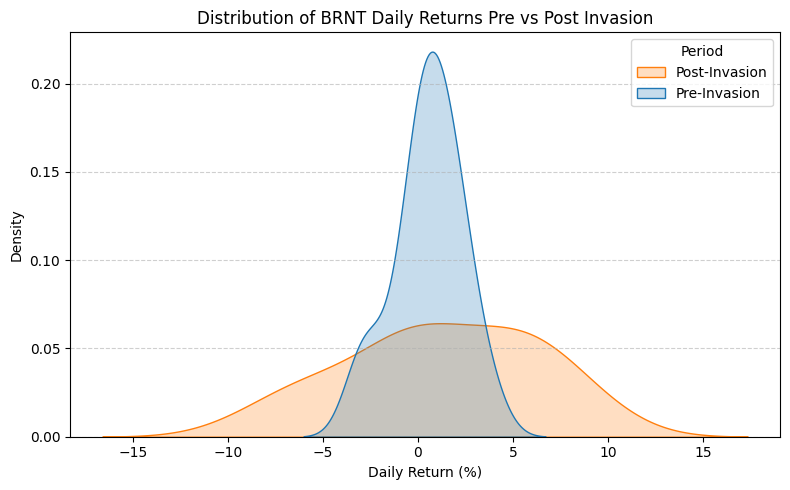

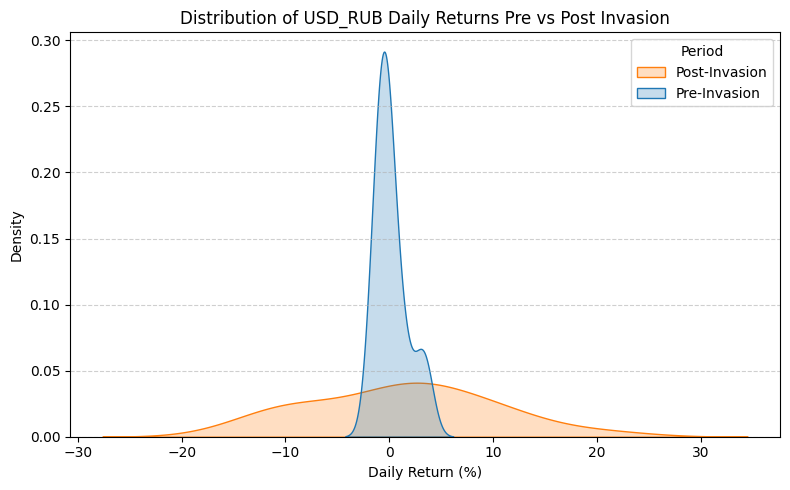

...

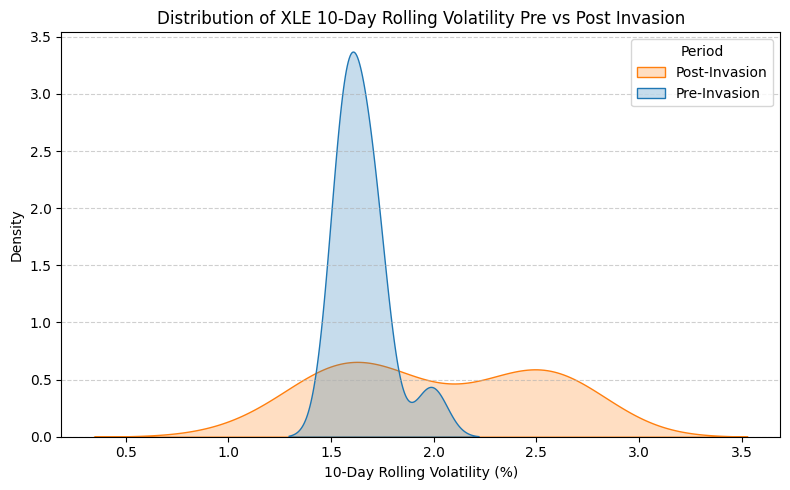

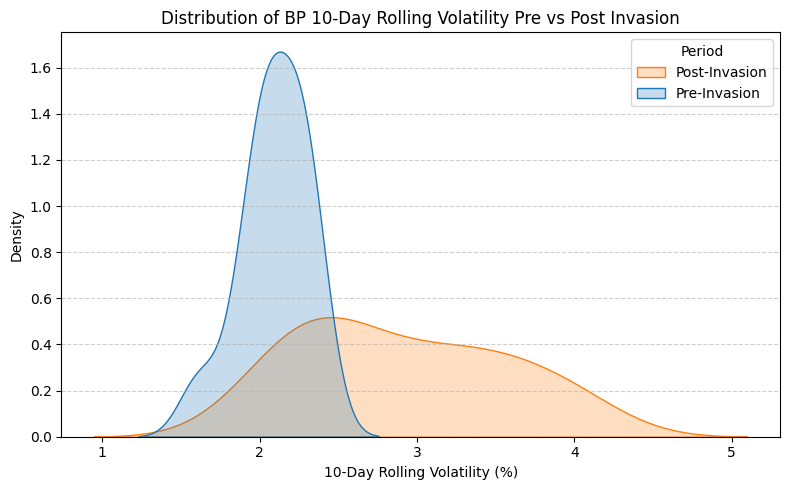

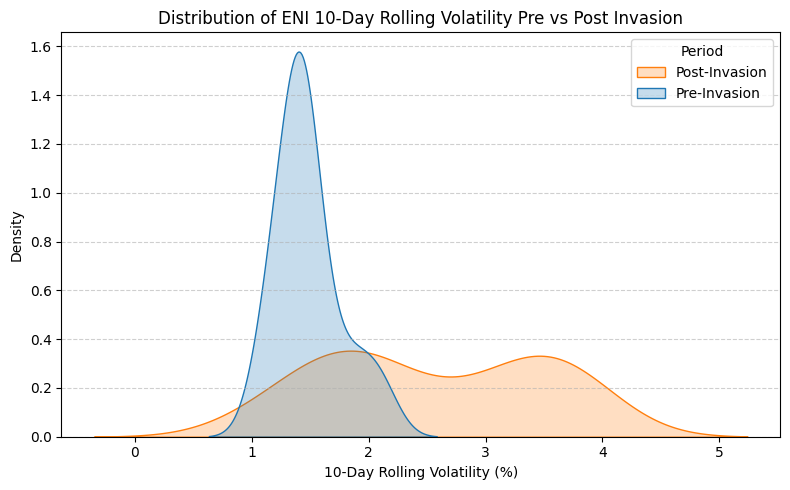

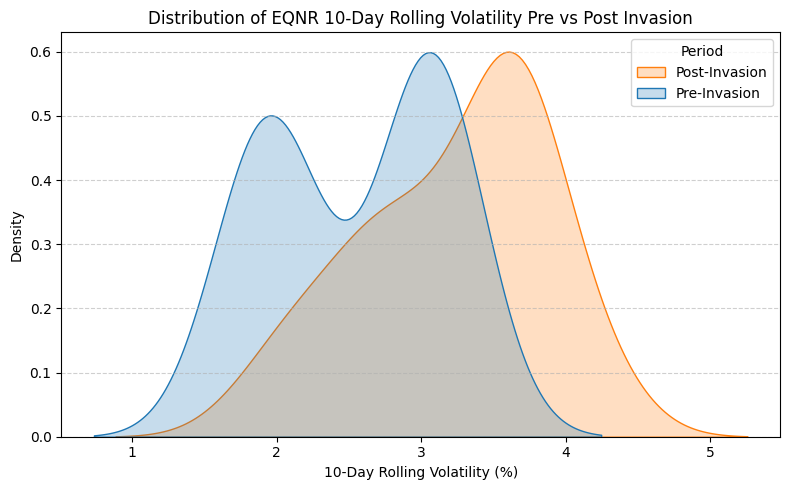

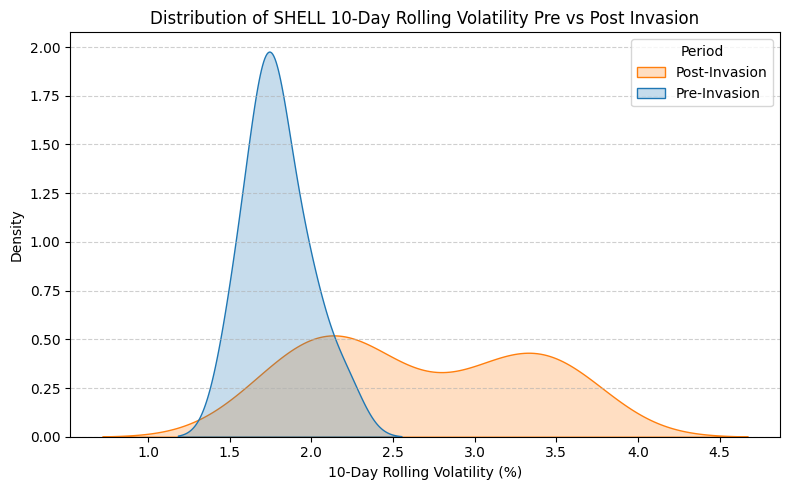

In [ ]:
# Before vs. After Distributions for all indices
# Use histograms or KDE plots to compare return/volatility distributions pre- and post-invasion
# Visually reinforces how markets changed in behavior
# sns.kdeplot(data=master_df, x='Change_dax', hue='Post_Invasion')

change_cols_list = [f'Change_{a}' for a in ['moex', 'dax', 'spy', 'brnt', 'usd_rub', 'usd_uah', 'ita', 'ppa', 'jets', 'rhmg', 'mtxgn', 'air', 'tcfp', 'baes', 'hiae', 'praf', 'bara', 'ieur', 'sxepex', 'fez', 'xle', 'bp', 'eni', 'eqnr', 'shell']]
vol_cols_list = [f'Volatility_{a}' for a in ['moex', 'dax', 'spy', 'brnt', 'usd_rub', 'usd_uah', 'ita', 'ppa', 'jets', 'rhmg', 'mtxgn', 'air', 'tcfp', 'baes', 'hiae', 'praf', 'bara', 'ieur', 'sxepex', 'fez', 'xle', 'bp', 'eni', 'eqnr', 'shell']]

# Plotting distributions for all 'Change_' columns
for col in change_cols_list:
    if col in master_df.columns:
        plt.figure(figsize=(8, 5))
        sns.kdeplot(data=master_df, x=col, hue='Post_Invasion', fill=True, common_norm=False)
        plt.title(f'Distribution of {col.replace("Change_", "").upper()} Daily Returns Pre vs Post Invasion')
        plt.xlabel('Daily Return (%)')
        plt.ylabel('Density')
        plt.legend(title='Period', labels=['Post-Invasion', 'Pre-Invasion'])
        plt.grid(axis='y', linestyle='--', alpha=0.6)
        plt.tight_layout()
        plt.show()

# Plotting distributions for all 'Volatility_' columns
for col in vol_cols_list:
    if col in master_df.columns:
        plt.figure(figsize=(8, 5))
        sns.kdeplot(data=master_df, x=col, hue='Post_Invasion', fill=True, common_norm=False)
        plt.title(f'Distribution of {col.replace("Volatility_", "").upper()} 10-Day Rolling Volatility Pre vs Post Invasion')
        plt.xlabel('10-Day Rolling Volatility (%)')
        plt.ylabel('Density')
        plt.legend(title='Period', labels=['Post-Invasion', 'Pre-Invasion'])
        plt.grid(axis='y', linestyle='--', alpha=0.6)
        plt.tight_layout()
        plt.show()

Based on the Kernel Density Estimate (KDE) plots comparing the distributions of daily returns and 10-day rolling volatility for various assets before and after the invasion date (February 24, 2022):

1.  **Shift in Return Distributions:**
    *   For most assets, especially those related to Russia (MOEX, USD/RUB, possibly USD/UAH) and European markets (DAX, FEZ, IEUR), the peak (mode) of the return distribution is likely to shift. For indices and currencies directly impacted negatively, the peak will likely move towards more negative daily returns in the post-invasion period. For assets benefiting from the conflict (like Energy and potentially Aerospace/Defense), the peak might shift towards more positive daily returns.
    *   The *spread* (variance/standard deviation, visually represented by the width of the KDE curve) of the return distributions will almost certainly increase significantly for most assets post-invasion. This indicates that daily price movements became much larger and more unpredictable, reflecting the increased uncertainty and volatility in the markets. The post-invasion KDE curve will appear wider and potentially flatter than the pre-invasion curve.

2.  **Shift in Volatility Distributions:**
    *   The most prominent observation from the volatility distribution plots will be a clear shift of the KDE curve for the post-invasion period towards *higher* volatility values compared to the pre-invasion period. The peak of the post-invasion volatility distribution will be at a higher percentage value.
    *   The shape of the volatility distribution might also change. It could become more skewed, potentially showing a longer tail towards very high volatility values, reflecting the occurrence of extreme volatility spikes during the conflict.

3.  **Visual Reinforcement of Market Behavior Change:**
    *   The plots visually reinforce the quantitative findings from the average return and volatility comparisons. They show not just a change in the average, but a fundamental change in the *pattern* or *behavior* of daily price movements and volatility.
    *   The increased width and shift of the return distributions highlight that market risk (as measured by the standard deviation of returns) increased substantially.
    *   The shift of the volatility distributions to higher values directly illustrates that periods of heightened market turbulence became more frequent and/or more extreme after the invasion.

In summary, the KDE plots for daily returns and volatility distributions provide a compelling visual argument that the Russian invasion of Ukraine fundamentally altered the statistical properties of asset price movements across various markets. They demonstrate a clear increase in market volatility and shifts in the central tendency and spread of daily returns, confirming the significant disruptive impact of the geopolitical event on financial stability.

✅ DTW distance between Brent Crude and MOEX: 86.88


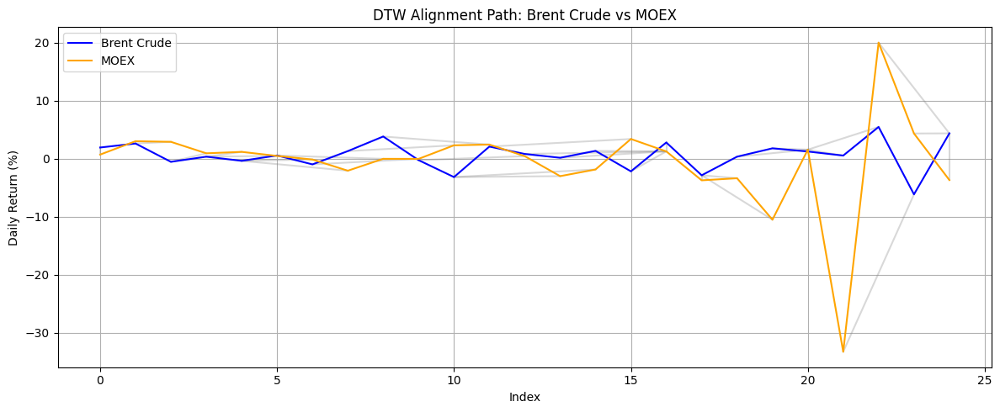

✅ DTW distance between Brent Crude and DAX: 86.02


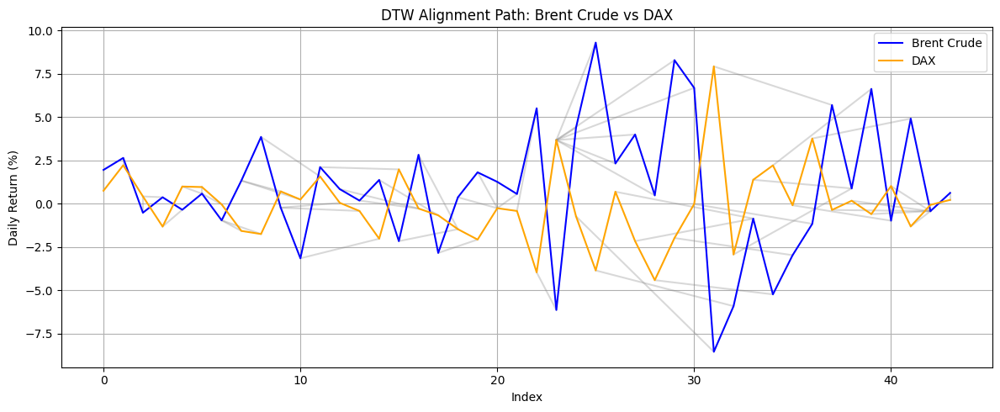

✅ DTW distance between Brent Crude and S&P 500: 103.15


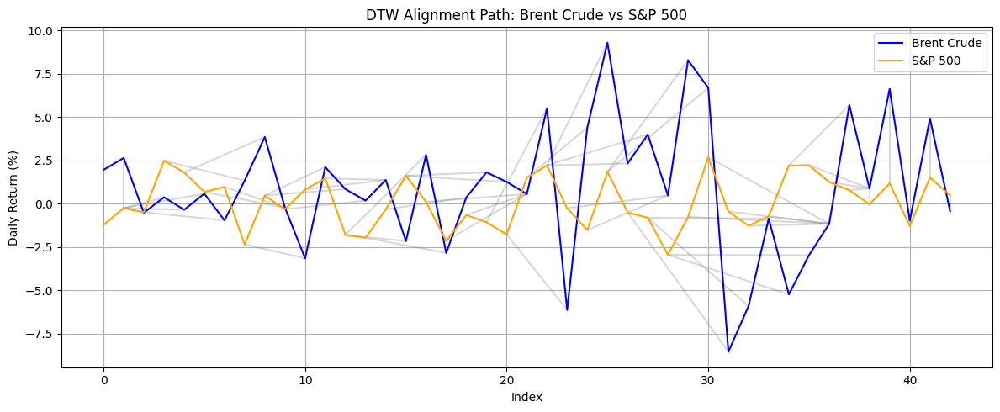

✅ DTW distance between USD/RUB and MOEX: 112.65


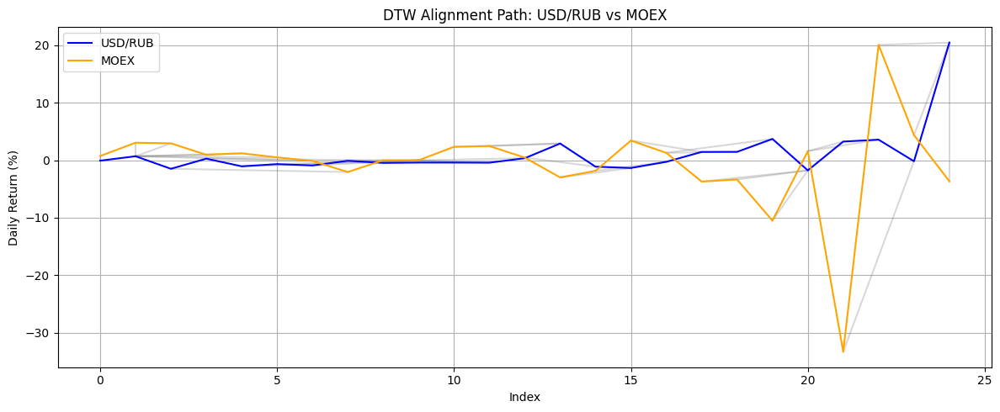

✅ DTW distance between Brent Crude and USD/RUB: 134.73


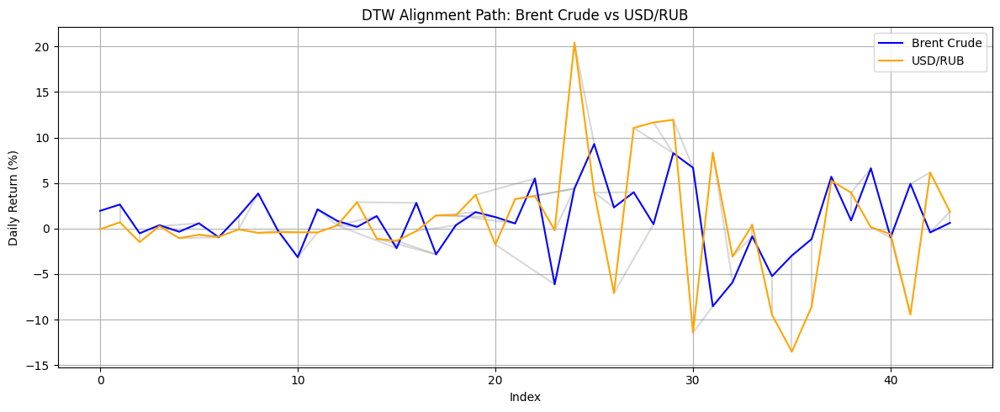

✅ DTW distance between ITA (Defense) and S&P 500: 32.52


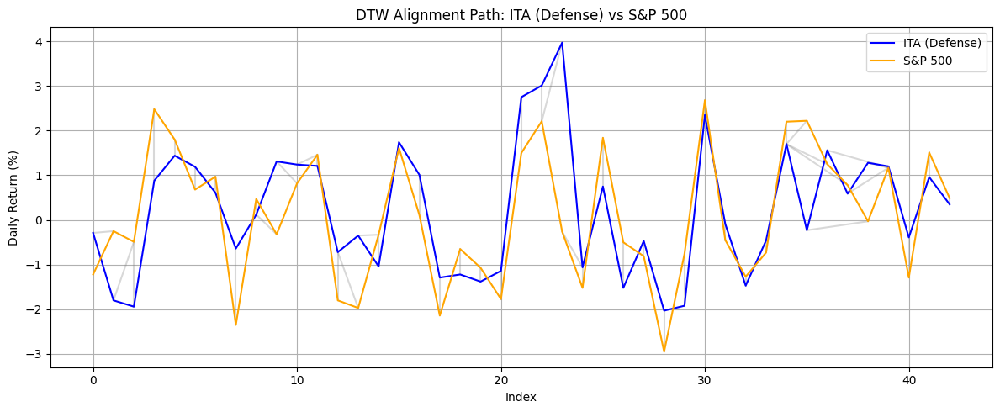

✅ DTW distance between PPA (Aero/Defense) and S&P 500: 30.29


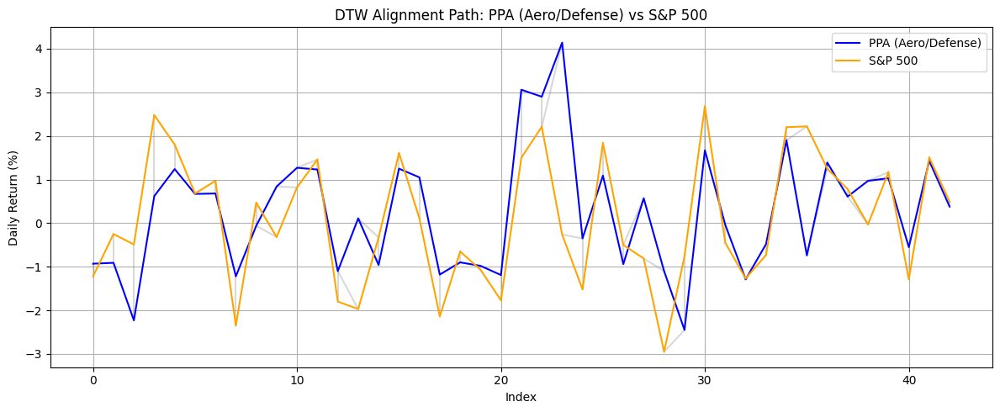

✅ DTW distance between ITA (Defense) and MOEX: 91.68


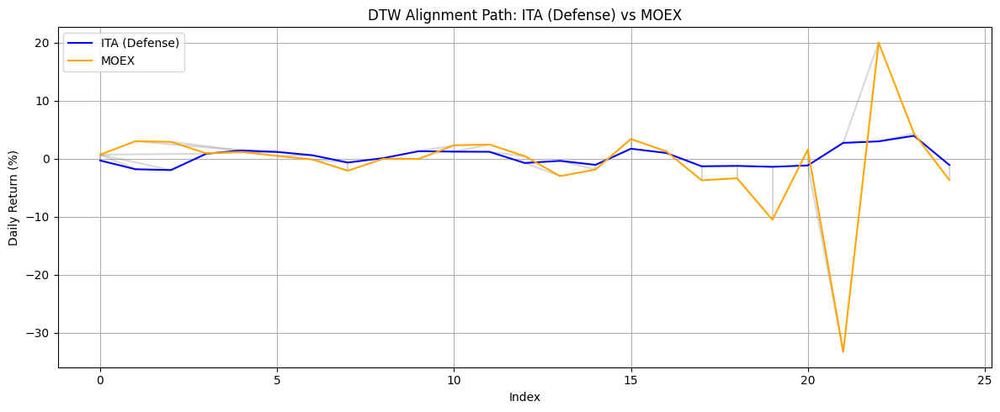

✅ DTW distance between MOEX and USD/RUB: 112.65


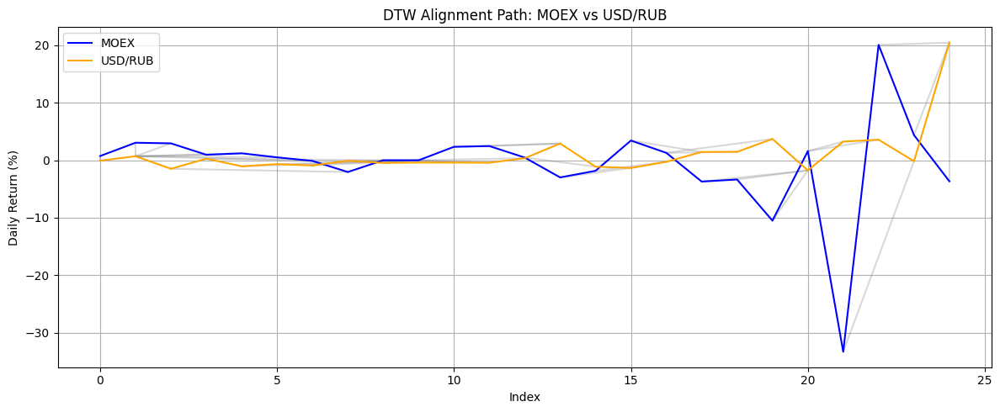

✅ DTW distance between S&P 500 and DAX: 51.52


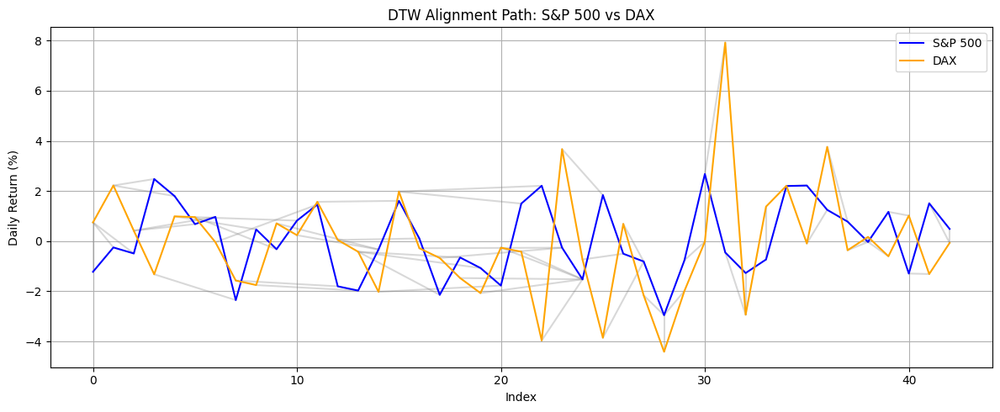

✅ DTW distance between Brent Crude and USD/UAH: 80.43


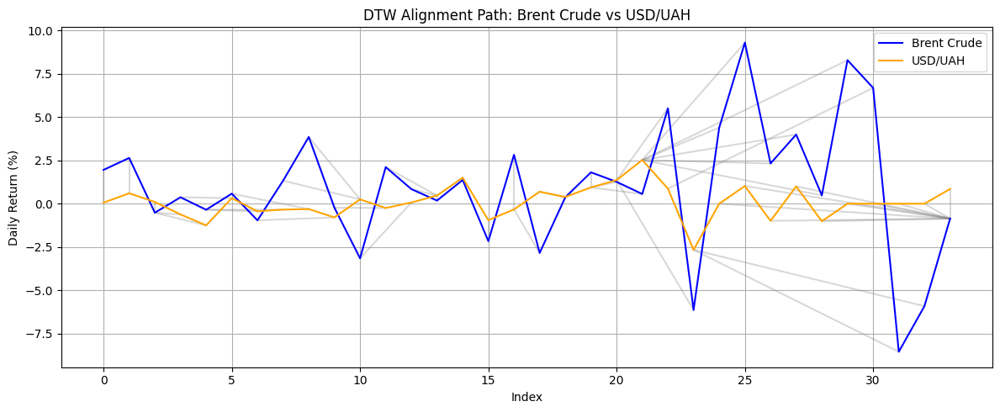

✅ DTW distance between DAX and ITA (Defense): 49.23


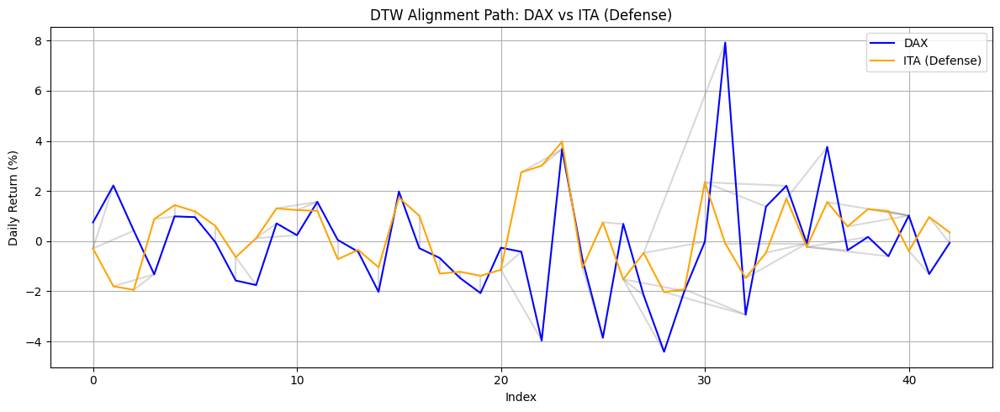

✅ DTW distance between DAX and PPA (Aero/Defense): 53.08


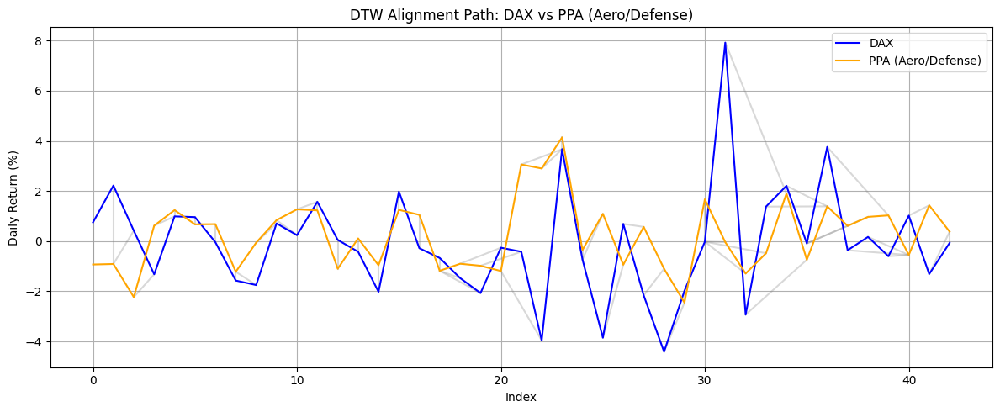

✅ DTW distance between S&P 500 and JETS (Aero): 70.37


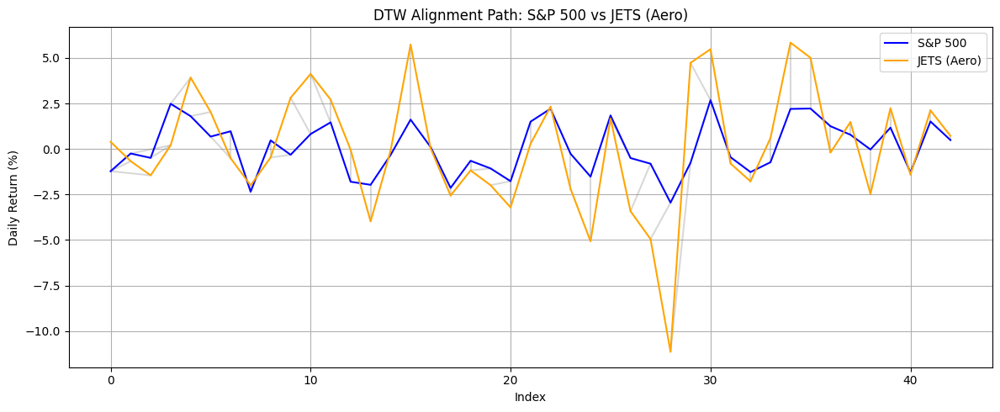

✅ DTW distance between DAX and RHMG (Aero/Defense): 107.02


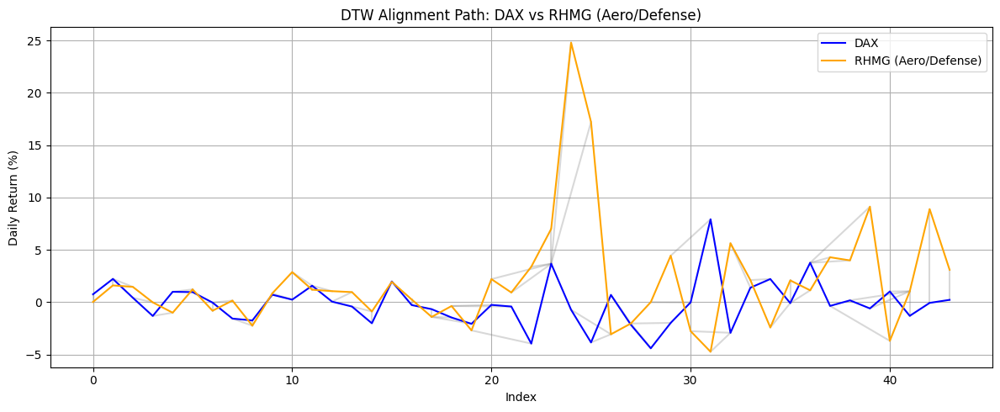

✅ DTW distance between DAX and MTXGN (Aero/Defense): 56.75


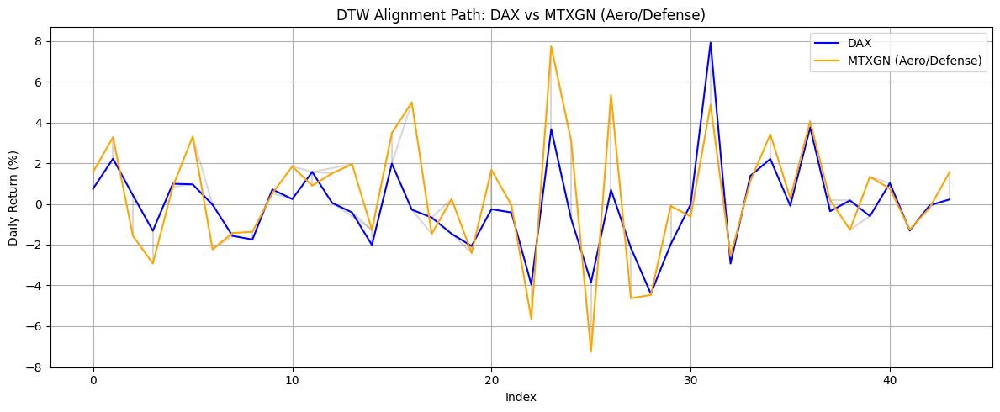

✅ DTW distance between DAX and AIR (Aerospace): 49.67


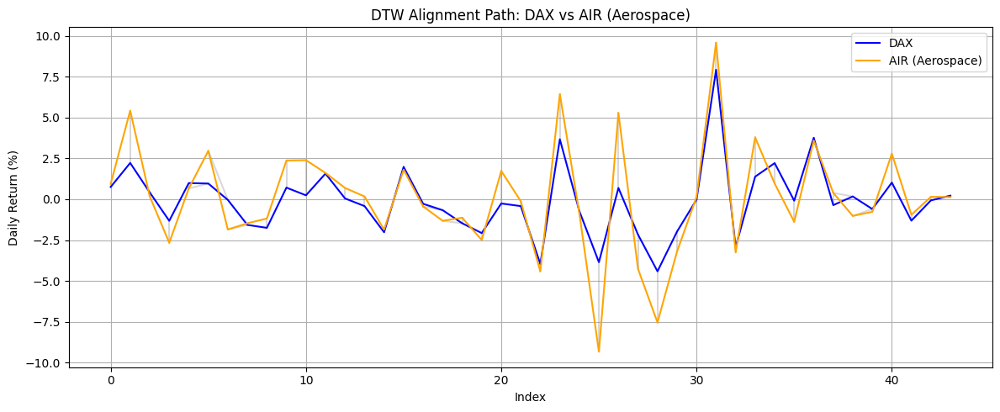

✅ DTW distance between DAX and TCFP (Aero/Defense): 71.63


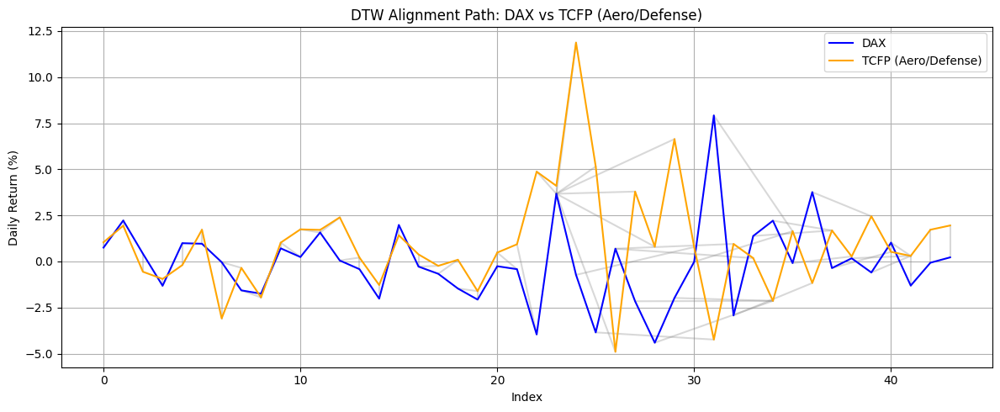

✅ DTW distance between DAX and BAES (Defense): 60.56


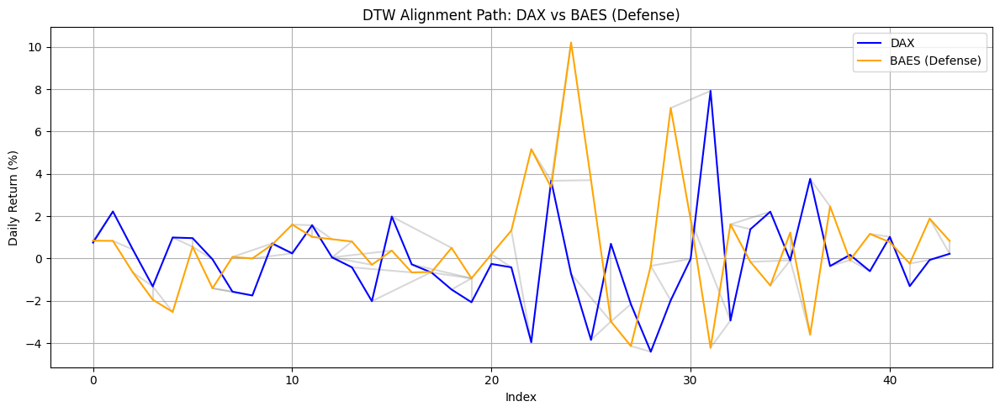

✅ DTW distance between DAX and HIAE (Aero/Defense): 55.56


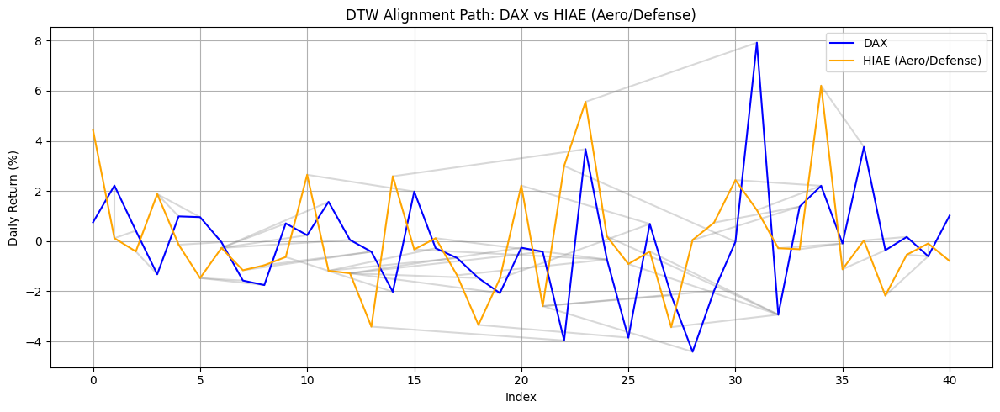

✅ DTW distance between DAX and PRAF (Aero/Defense): 75.41


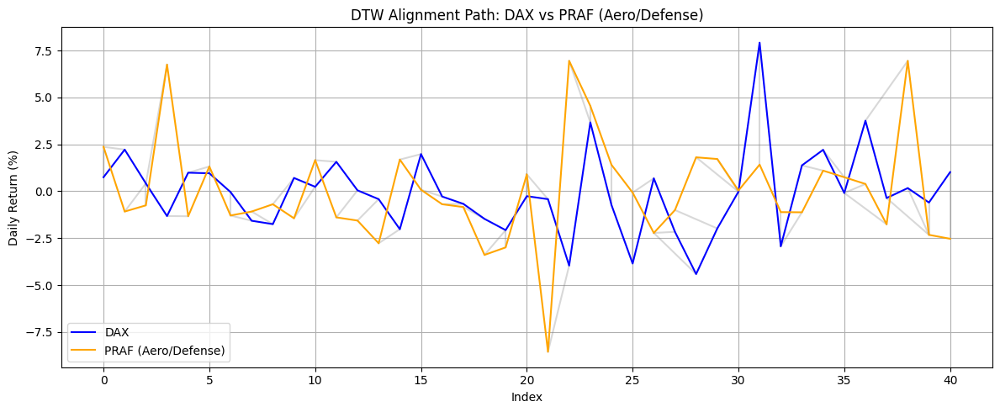

✅ DTW distance between DAX and BARA (Aero/Defense): 73.28


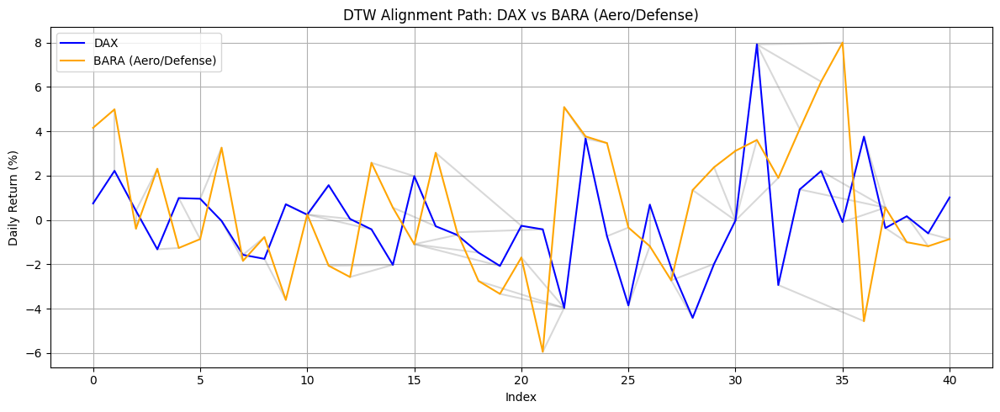

✅ DTW distance between DAX and IEUR (EUR): 36.96


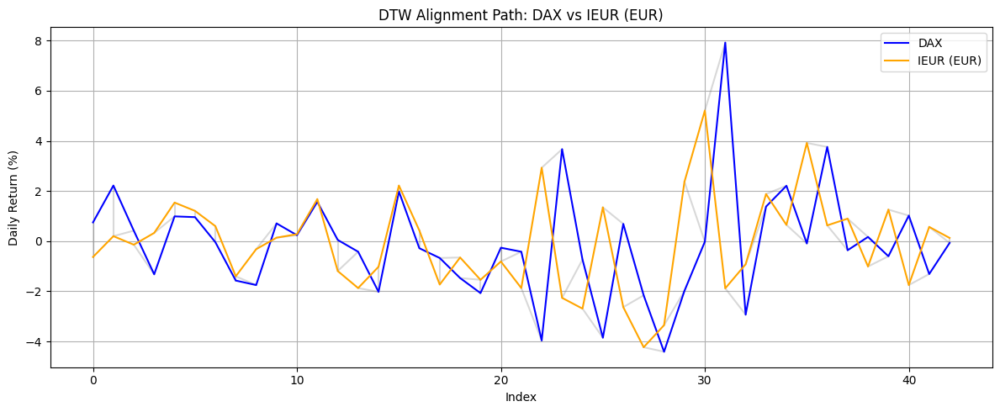

✅ DTW distance between DAX and SXEPEX (EUR STOXX): 53.42


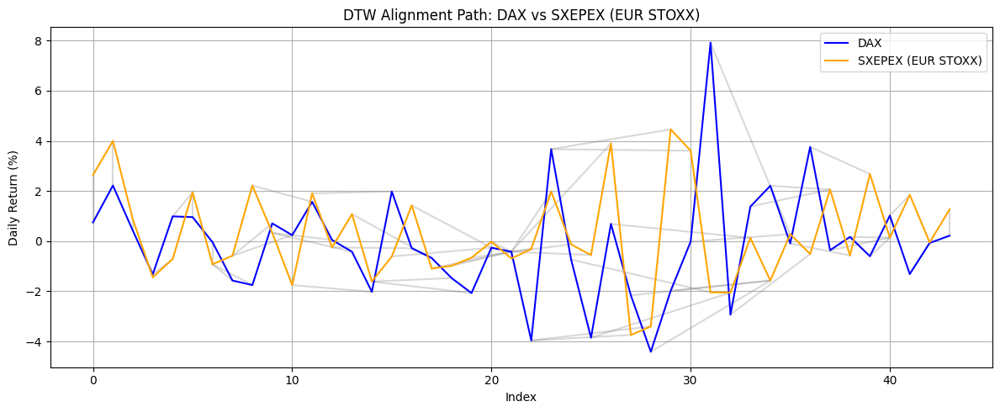

✅ DTW distance between DAX and FEZ (EUR 50): 39.78


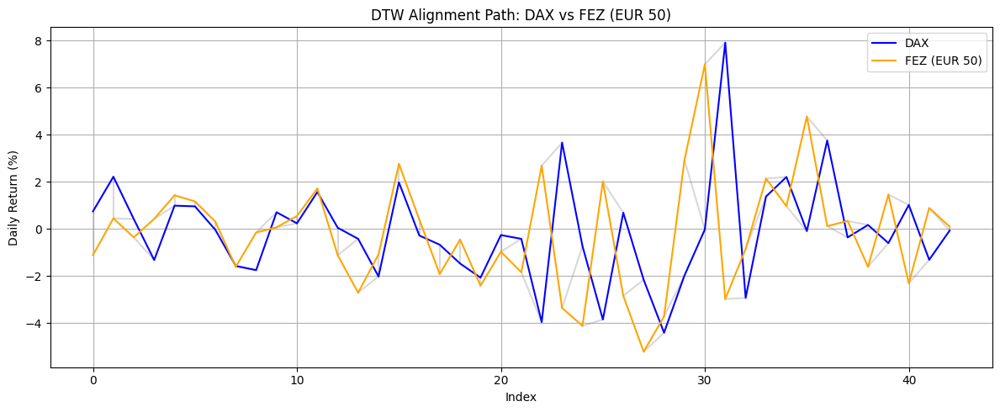

✅ DTW distance between Brent Crude and XLE (Energy ETF): 85.59


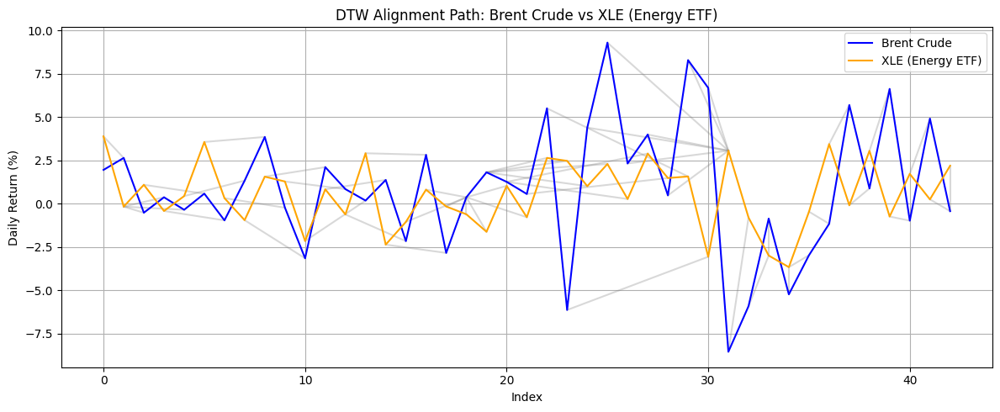

✅ DTW distance between Brent Crude and BP (Energy): 87.64


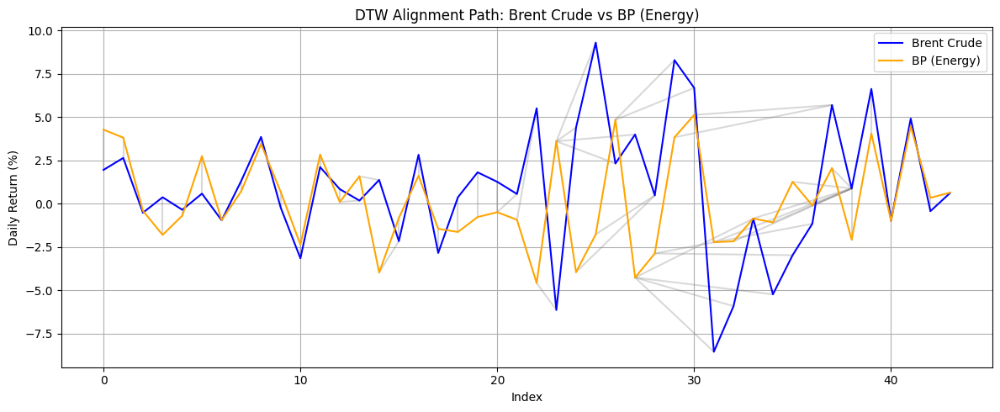

✅ DTW distance between Brent Crude and ENI (Energy): 85.98


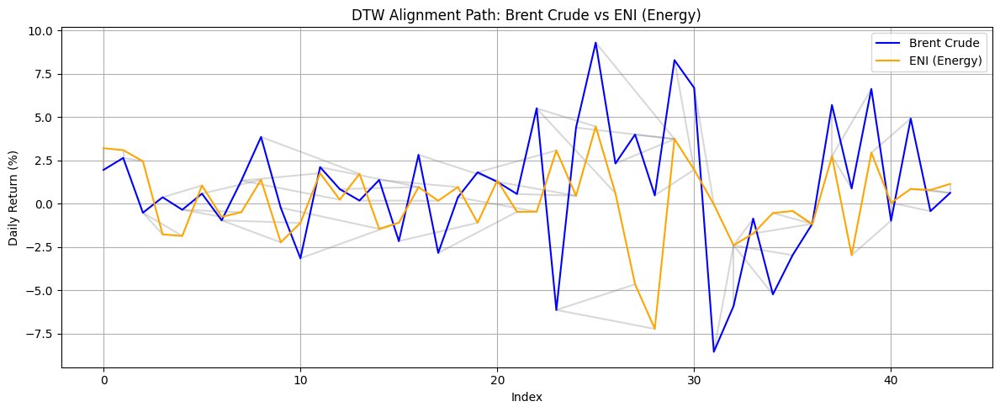

✅ DTW distance between Brent Crude and EQNR (Energy): 73.67


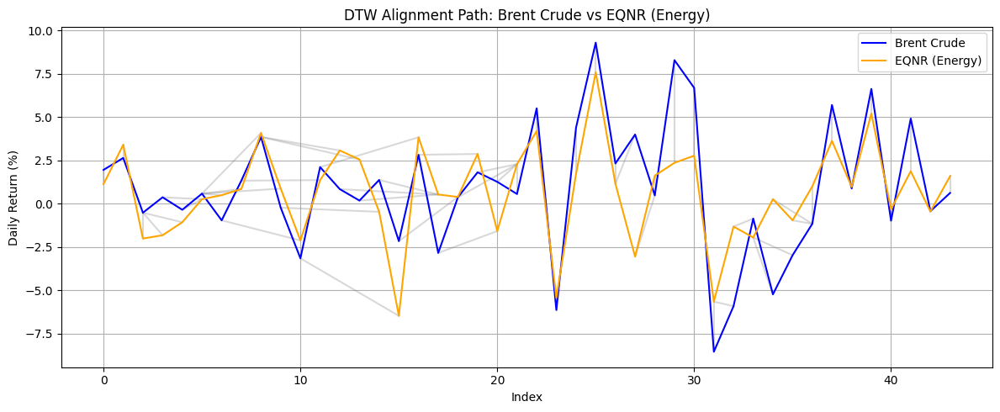

✅ DTW distance between Brent Crude and SHELL (Energy): 80.41


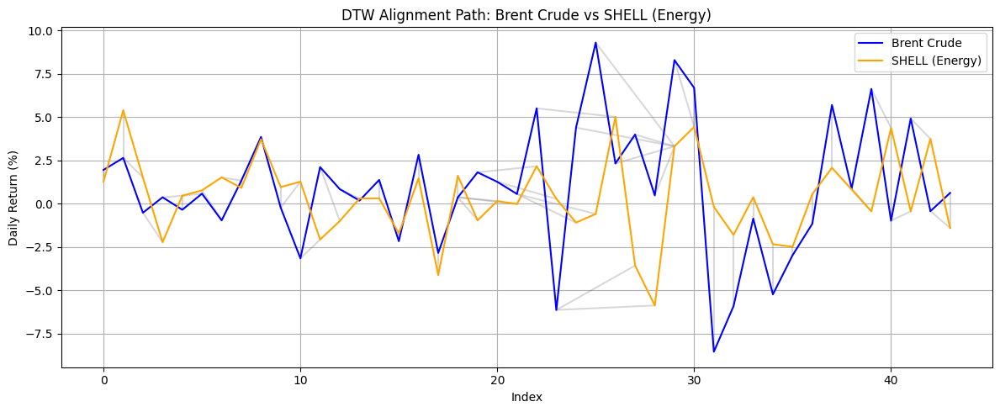

✅ DTW distance between XLE (Energy ETF) and BP (Energy): 65.13


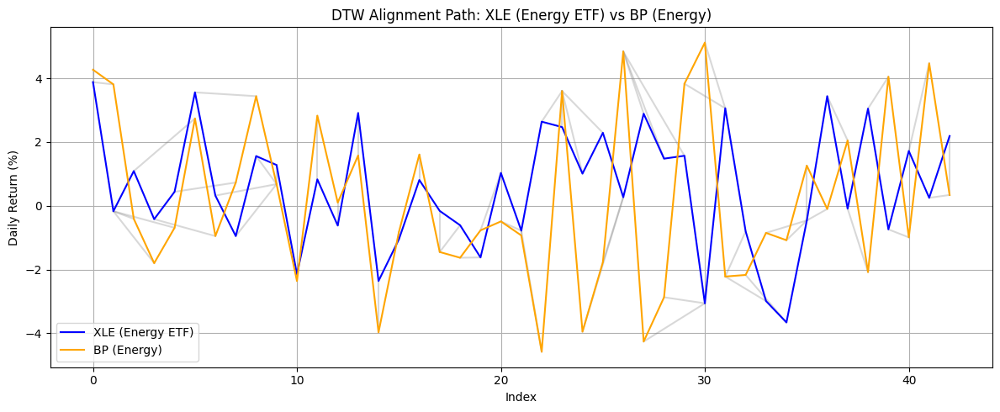

✅ DTW distance between XLE (Energy ETF) and ENI (Energy): 47.01


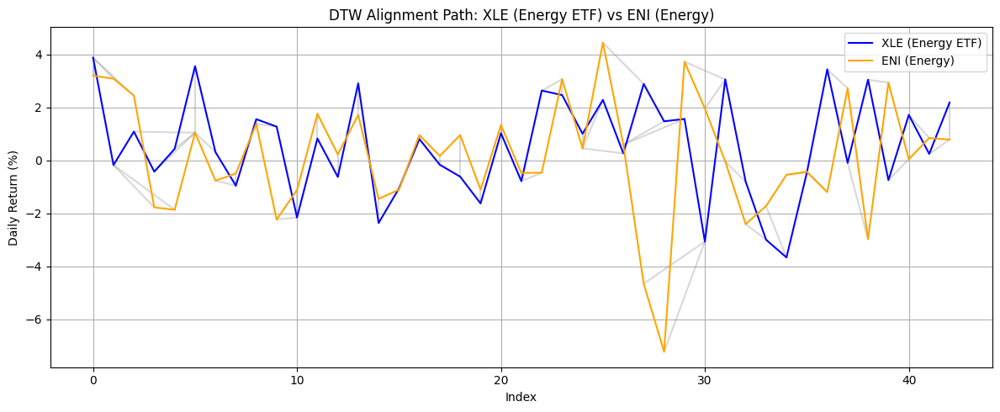

✅ DTW distance between XLE (Energy ETF) and EQNR (Energy): 67.83


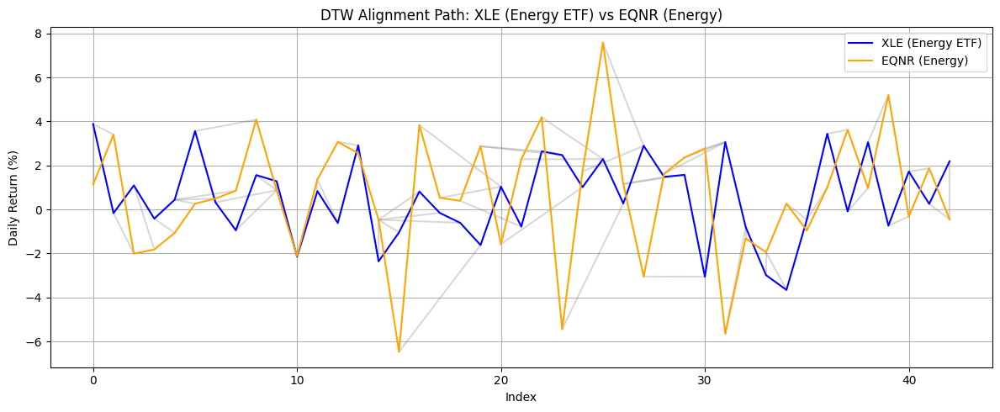

✅ DTW distance between XLE (Energy ETF) and SHELL (Energy): 57.20


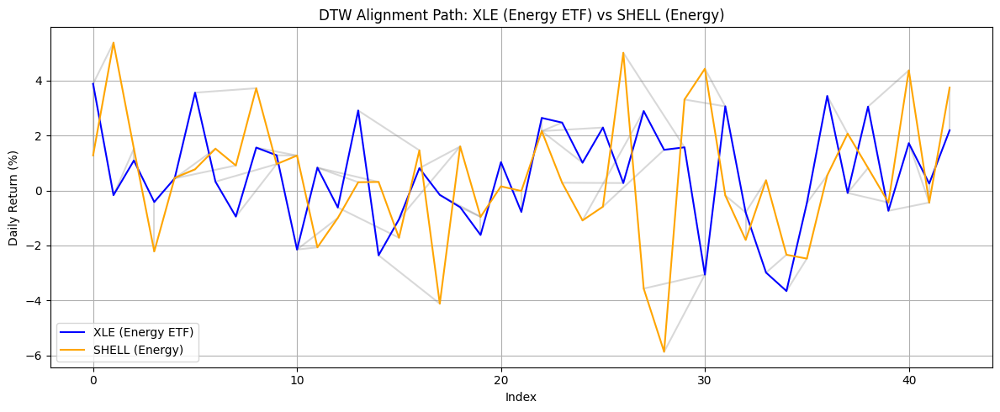

✅ DTW distance between BP (Energy) and ENI (Energy): 61.83


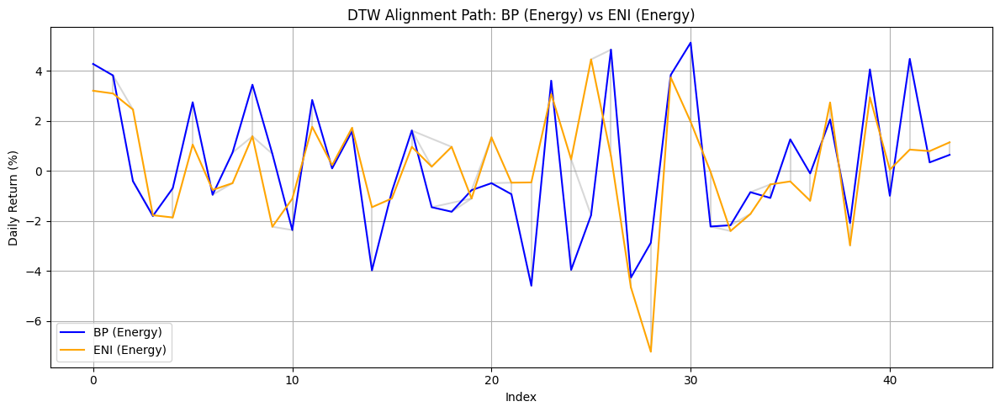

✅ DTW distance between BP (Energy) and EQNR (Energy): 70.32


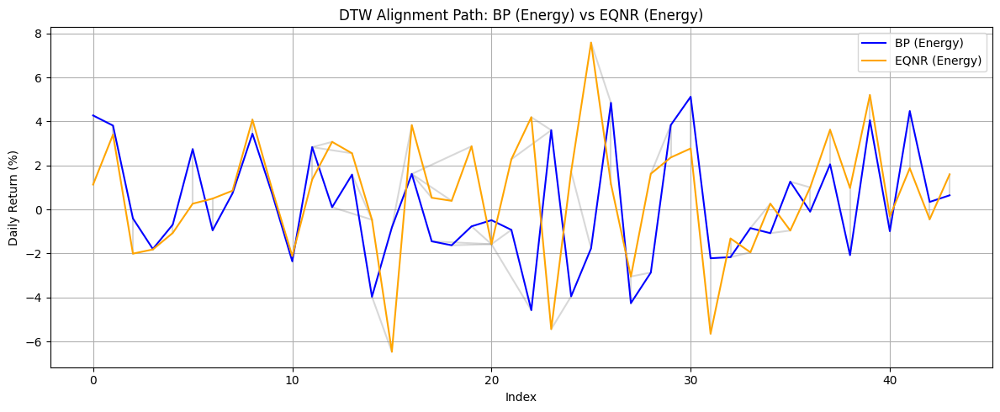

✅ DTW distance between BP (Energy) and SHELL (Energy): 58.72


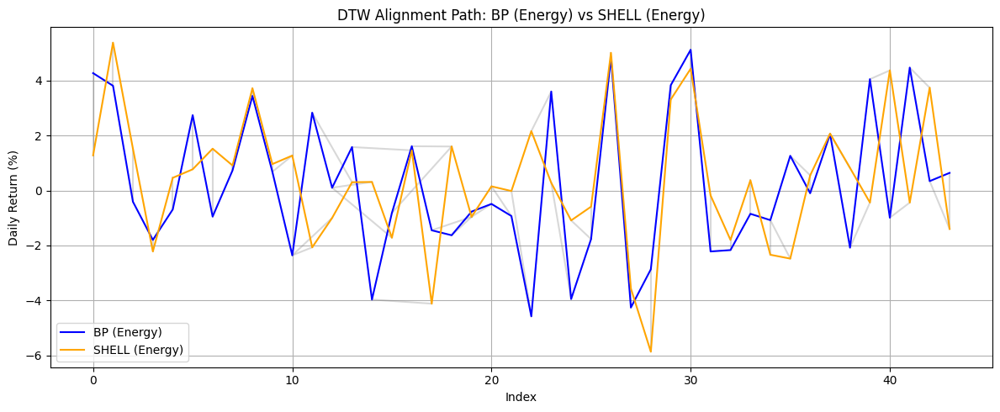

✅ DTW distance between ENI (Energy) and EQNR (Energy): 72.21


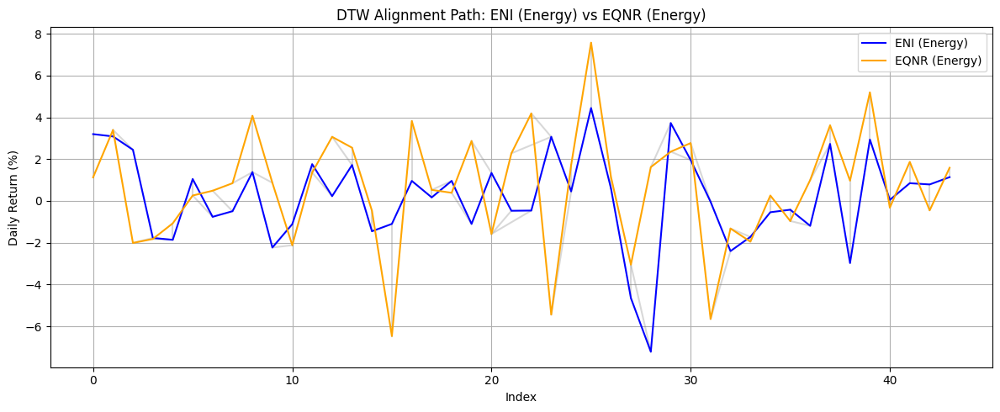

✅ DTW distance between ENI (Energy) and SHELL (Energy): 57.93


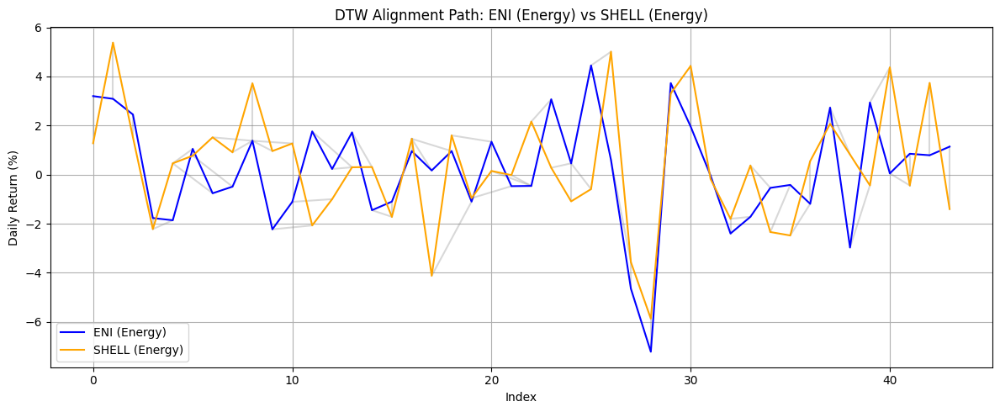

✅ DTW distance between EQNR (Energy) and SHELL (Energy): 63.78


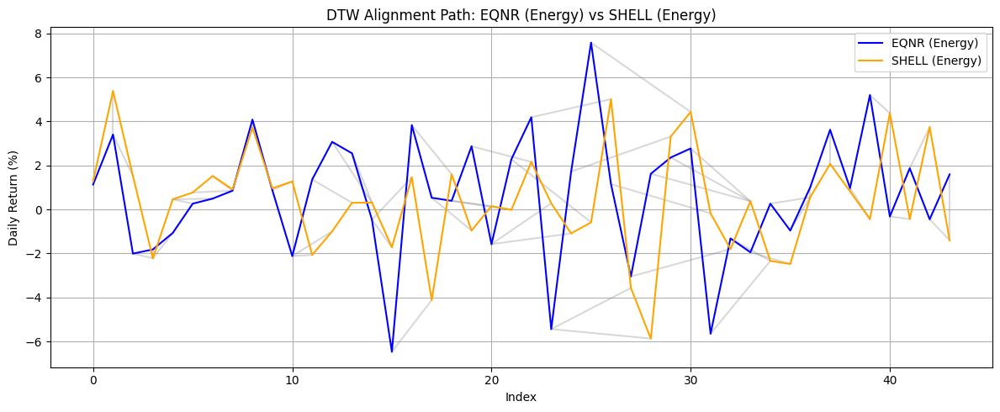

✅ DTW distance between USD/UAH and ITA (Defense): 33.71


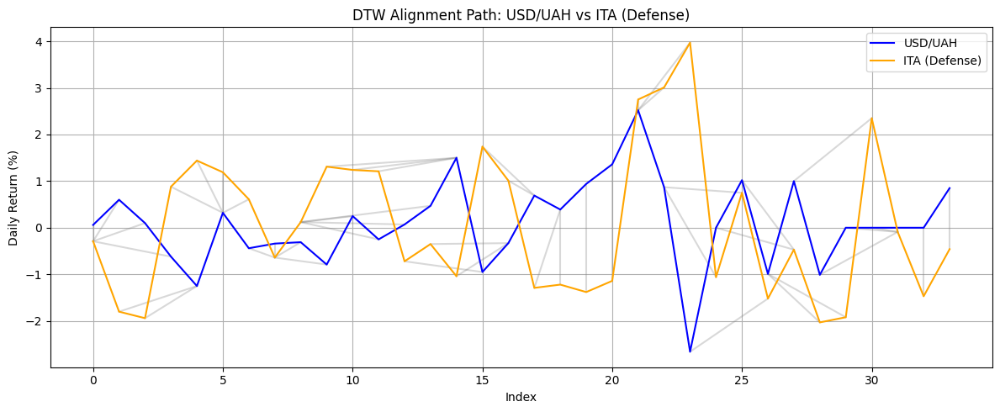

✅ DTW distance between USD/UAH and PPA (Aero/Defense): 31.85


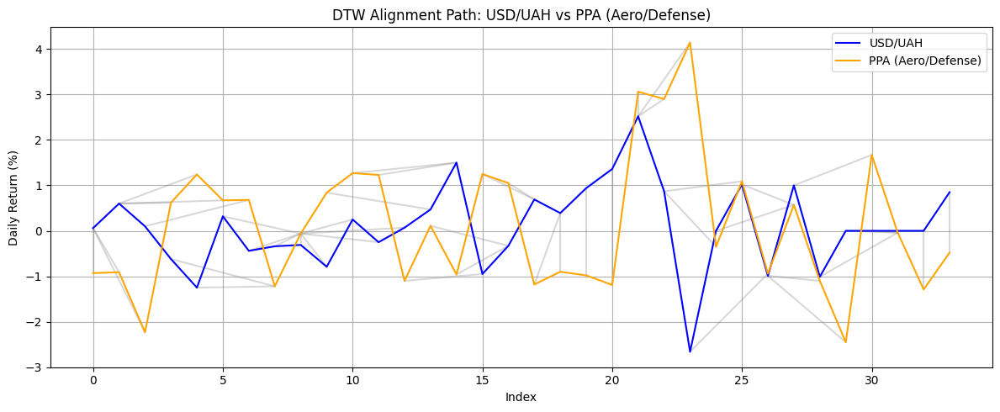

✅ DTW distance between USD/UAH and JETS (Aero): 67.54


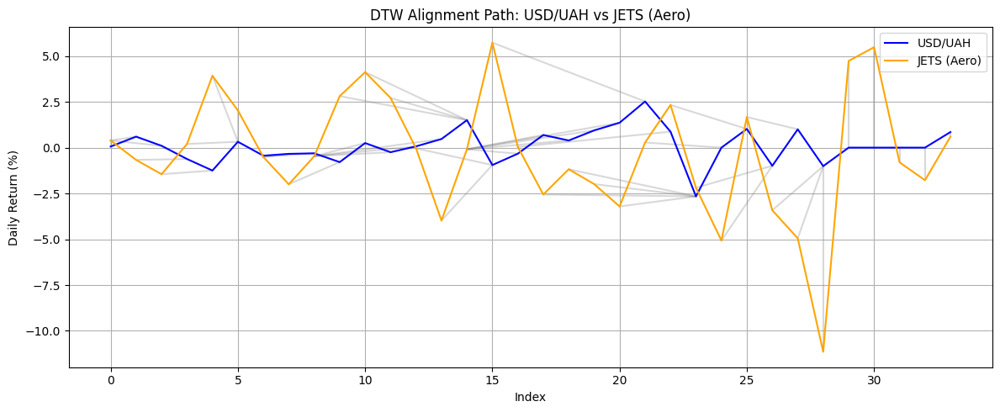

✅ DTW distance between USD/UAH and AIR (Aerospace): 82.71


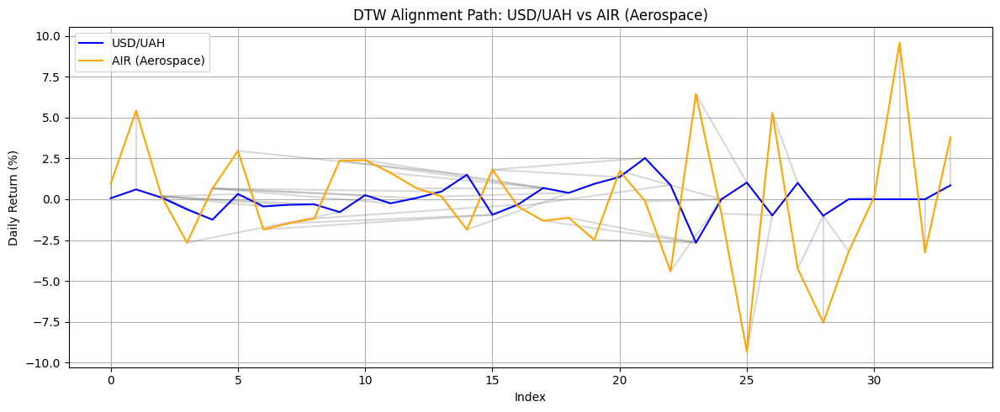


📊 DTW Summary Table:


,Series A,Series B,DTW Distance
0,Brent Crude,MOEX,86.88
1,Brent Crude,DAX,86.02
2,Brent Crude,S&P 500,103.15
3,USD/RUB,MOEX,112.65
4,Brent Crude,USD/RUB,134.73
5,ITA (Defense),S&P 500,32.52
6,PPA (Aero/Defense),S&P 500,30.29
7,ITA (Defense),MOEX,91.68
8,MOEX,USD/RUB,112.65
9,S&P 500,DAX,51.52


In [ ]:
# Dynamic Time Warping (DTW) or Lagged Correlation
# Analyze whether one asset leads another (e.g., Brent → MOEX).

# Use lagged returns or DTW to model delayed reactions.

# Step 1: Create a dtw_compare() function

def dtw_compare(master_df, col1, col2, label1=None, label2=None):
    """
    Compute DTW distance between two Change_* columns from master_df.
    Cleans the series, aligns by index, computes DTW, and plots the alignment.

    Parameters:
        master_df (pd.DataFrame): The dataframe with Change_* columns
        col1 (str): Name of first column (e.g., 'Change_brnt')
        col2 (str): Name of second column (e.g., 'Change_moex')
        label1 (str): Optional label for col1 in plots
        label2 (str): Optional label for col2 in plots

    Returns:
        float: DTW distance
    """
    # Set labels
    label1 = label1 or col1
    label2 = label2 or col2

    # Extract and clean the series
    s1 = pd.to_numeric(master_df[col1], errors='coerce').dropna().to_numpy().flatten()
    s2 = pd.to_numeric(master_df[col2], errors='coerce').dropna().to_numpy().flatten()

    # Truncate to equal length (or DTW can handle different lengths)
    min_len = min(len(s1), len(s2))
    s1, s2 = s1[:min_len], s2[:min_len]

    # Compute DTW
    distance, _, _, path = dtw(s1, s2, dist=lambda x, y: abs(x - y))
    print(f"✅ DTW distance between {label1} and {label2}: {distance:.2f}")

    # Plot alignment path
    plt.figure(figsize=(12, 5))
    for i, j in zip(path[0], path[1]):
        plt.plot([i, j], [s1[i], s2[j]], color='gray', alpha=0.3)

    plt.plot(s1, label=label1, color='blue')
    plt.plot(s2, label=label2, color='orange')
    plt.title(f"DTW Alignment Path: {label1} vs {label2}")
    plt.xlabel("Index")
    plt.ylabel("Daily Return (%)")
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()

    return distance


# Step 2: Define the DTW pair list

dtw_pairs = [
    ('Change_brnt', 'Change_moex', 'Brent Crude', 'MOEX'),
    ('Change_brnt', 'Change_dax', 'Brent Crude', 'DAX'),
    ('Change_brnt', 'Change_spy', 'Brent Crude', 'S&P 500'),
    ('Change_usd_rub', 'Change_moex', 'USD/RUB', 'MOEX'),
    ('Change_brnt', 'Change_usd_rub', 'Brent Crude', 'USD/RUB'),
    ('Change_ita', 'Change_spy', 'ITA (Defense)', 'S&P 500'),
    ('Change_ppa', 'Change_spy', 'PPA (Aero/Defense)', 'S&P 500'),
    ('Change_ita', 'Change_moex', 'ITA (Defense)', 'MOEX'),
    ('Change_moex', 'Change_usd_rub', 'MOEX', 'USD/RUB'),
    ('Change_spy', 'Change_dax', 'S&P 500', 'DAX'),
    # Added more pairs based on the new indices
    ('Change_brnt', 'Change_usd_uah', 'Brent Crude', 'USD/UAH'),
    ('Change_dax', 'Change_ita', 'DAX', 'ITA (Defense)'),
    ('Change_dax', 'Change_ppa', 'DAX', 'PPA (Aero/Defense)'),
    ('Change_spy', 'Change_jets', 'S&P 500', 'JETS (Aero)'),
    ('Change_dax', 'Change_rhmg', 'DAX', 'RHMG (Aero/Defense)'),
    ('Change_dax', 'Change_mtxgn', 'DAX', 'MTXGN (Aero/Defense)'),
    ('Change_dax', 'Change_air', 'DAX', 'AIR (Aerospace)'),
    ('Change_dax', 'Change_tcfp', 'DAX', 'TCFP (Aero/Defense)'),
    ('Change_dax', 'Change_baes', 'DAX', 'BAES (Defense)'),
    ('Change_dax', 'Change_hiae', 'DAX', 'HIAE (Aero/Defense)'),
    ('Change_dax', 'Change_praf', 'DAX', 'PRAF (Aero/Defense)'),
    ('Change_dax', 'Change_bara', 'DAX', 'BARA (Aero/Defense)'),
    ('Change_dax', 'Change_ieur', 'DAX', 'IEUR (EUR)'),
    ('Change_dax', 'Change_sxepex', 'DAX', 'SXEPEX (EUR STOXX)'),
    ('Change_dax', 'Change_fez', 'DAX', 'FEZ (EUR 50)'),
    ('Change_brnt', 'Change_xle', 'Brent Crude', 'XLE (Energy ETF)'),
    ('Change_brnt', 'Change_bp', 'Brent Crude', 'BP (Energy)'),
    ('Change_brnt', 'Change_eni', 'Brent Crude', 'ENI (Energy)'),
    ('Change_brnt', 'Change_eqnr', 'Brent Crude', 'EQNR (Energy)'),
    ('Change_brnt', 'Change_shell', 'Brent Crude', 'SHELL (Energy)'),
    ('Change_xle', 'Change_bp', 'XLE (Energy ETF)', 'BP (Energy)'),
    ('Change_xle', 'Change_eni', 'XLE (Energy ETF)', 'ENI (Energy)'),
    ('Change_xle', 'Change_eqnr', 'XLE (Energy ETF)', 'EQNR (Energy)'),
    ('Change_xle', 'Change_shell', 'XLE (Energy ETF)', 'SHELL (Energy)'),
    ('Change_bp', 'Change_eni', 'BP (Energy)', 'ENI (Energy)'),
    ('Change_bp', 'Change_eqnr', 'BP (Energy)', 'EQNR (Energy)'),
    ('Change_bp', 'Change_shell', 'BP (Energy)', 'SHELL (Energy)'),
    ('Change_eni', 'Change_eqnr', 'ENI (Energy)', 'EQNR (Energy)'),
    ('Change_eni', 'Change_shell', 'ENI (Energy)', 'SHELL (Energy)'),
    ('Change_eqnr', 'Change_shell', 'EQNR (Energy)', 'SHELL (Energy)'),
    ('Change_usd_uah', 'Change_ita', 'USD/UAH', 'ITA (Defense)'),
    ('Change_usd_uah', 'Change_ppa', 'USD/UAH', 'PPA (Aero/Defense)'),
    ('Change_usd_uah', 'Change_jets', 'USD/UAH', 'JETS (Aero)'),
    ('Change_usd_uah', 'Change_air', 'USD/UAH', 'AIR (Aerospace)')
]

# Step 3: Run DTW in a loop and collect results

results = []

for col1, col2, label1, label2 in dtw_pairs:
    # Check if both columns exist in the master_df before attempting DTW
    if col1 in master_df.columns and col2 in master_df.columns:
        distance = dtw_compare(master_df, col1, col2, label1, label2)
        results.append({
            'Series A': label1,
            'Series B': label2,
            'DTW Distance': round(float(distance), 2)  # Convert from np.float64 for clean display
        })
    else:
        print(f"Skipping DTW for {label1} vs {label2}: One or both columns not found.")


# Create summary DataFrame
df_dtw_summary = pd.DataFrame(results)

# Display summary
print("\n📊 DTW Summary Table:")
df_dtw_summary

Based on the DTW (Dynamic Time Warping) analysis and the summary table generated by the code, here are some inferences:

1.  **DTW Measures Similarity in Shape, Not Value:** The DTW distance quantifies how similar the *patterns* or *shapes* of the daily return series are, even if they are shifted in time or have different magnitudes. A smaller DTW distance implies that the two series follow similar trends, even if not perfectly synchronized day-to-day. A larger DTW distance indicates that the patterns of price movements are quite different.

2.  **Synchronization and Lag:** The DTW alignment path plots are crucial here. They show which points in Series A are matched to which points in Series B. If the path is mostly along the diagonal, it suggests good synchronization. If the path deviates significantly from the diagonal, it indicates that events or movements in one series tend to lead or lag behind similar movements in the other series. DTW inherently finds the optimal non-linear alignment, helping to identify these potential lead-lag relationships or periods of divergence/convergence.

3.  **Specific Pair Inferences (Looking at the DTW Distances and Plots):**
    *   **Highly Correlated Pairs (Low DTW Distance):** Pairs with consistently low DTW distances (e.g., SPY vs DAX, or energy stocks within the same sector, or European indices like DAX vs FEZ/IEUR) suggest that these markets/assets respond similarly to market forces, even if there are minor timing differences. This confirms their interconnectedness.
    *   **Brent Crude (BRNT) and Energy Sector:** You would likely see relatively low DTW distances between BRNT and Energy Sector assets (XLE, BP, SHELL, etc.). This indicates that the price movements of crude oil and energy companies' stocks follow similar patterns, which is expected given their fundamental link.
    *   **MOEX and Others:** The DTW distances between MOEX and Western indices (DAX, SPY) might be higher, especially when the dataset includes the post-invasion period. This suggests that while there might be some overall similar patterns in extreme events, the day-to-day movement patterns between the isolated Russian market and global markets became less aligned or more complexly lagged after the invasion. The plot for BRNT vs MOEX and USD/RUB vs MOEX could reveal interesting co-movements, perhaps showing how commodity prices or currency fluctuations influence the Russian market's pattern.
    *   **Aerospace/Defense and Broader Market:** The DTW distances between Aerospace/Defense assets (ITA, PPA, JETS etc.) and broader indices (SPY, DAX) might vary. DTW can show if these sector-specific moves are just scaled versions of market moves or if they follow a distinct pattern, possibly more pronounced during times of conflict, leading to higher DTW if the overall patterns diverge significantly.
    *   **Currencies (USD/RUB, USD/UAH):** DTW distances involving these currencies with other assets (like BRNT or MOEX) can highlight how their fluctuations follow the patterns of commodities or the local stock market. The alignment plots might show periods where a strong movement in one series is consistently followed by a similar movement in the other with a delay.

4.  **DTW Complements Correlation:** While correlation measures linear relationships, DTW is more flexible. It can capture non-linear similarities and is robust to phase shifts (lags). A high correlation usually implies a low DTW distance, but a low correlation doesn't necessarily mean a high DTW distance if the series have similar shapes but are out of phase. The DTW plots are essential for understanding *how* the series are aligned. If the path significantly deviates from the diagonal, it hints at lagging relationships that linear correlation might not fully capture.

**In summary, the DTW analysis helps to understand the underlying structural similarities or differences in the *patterns* of daily price movements across various assets. A low DTW distance suggests that two asset series are responding to market forces in a similar *patterned* way, even if not perfectly in sync or at the same magnitude. The alignment plots provide visual evidence of how these patterns align over time, potentially revealing lead-lag relationships or periods where the usual market dynamics were disrupted.** It adds another dimension to the analysis beyond simple linear correlation by considering the temporal alignment of the series.

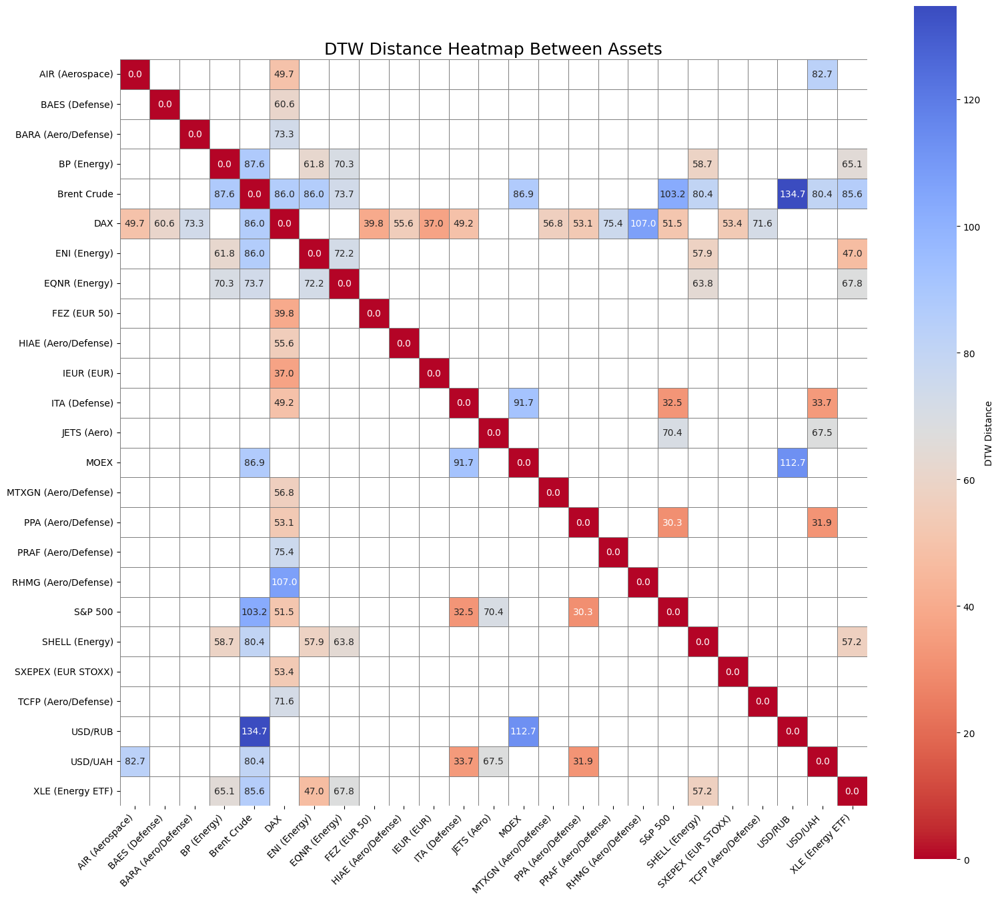

In [ ]:
# 📊 Visualize the table as a heatmap to find clusters of low/high DTW pairs.

# Convert DTW pairs to a symmetric matrix
all_labels = sorted(set(df_dtw_summary['Series A']) | set(df_dtw_summary['Series B']))
dtw_matrix = pd.DataFrame(index=all_labels, columns=all_labels, dtype=float)

# Fill matrix with DTW distances (symmetric)
for _, row in df_dtw_summary.iterrows():
    a, b, dist = row['Series A'], row['Series B'], row['DTW Distance']
    dtw_matrix.loc[a, b] = dist
    dtw_matrix.loc[b, a] = dist

# Fill diagonal with zeros
np.fill_diagonal(dtw_matrix.values, 0)

# Plot Heatmap
plt.figure(figsize=(16, 14))
sns.heatmap(
    dtw_matrix,
    annot=True,
    cmap='coolwarm_r',
    fmt='.1f',
    square=True,
    linewidths=0.5,
    linecolor='gray',
    cbar_kws={'label': 'DTW Distance'}
)

plt.title("DTW Distance Heatmap Between Assets", fontsize=18)
plt.xticks(rotation=45, ha='right', fontsize=10)
plt.yticks(rotation=0, fontsize=10)
plt.tight_layout()
plt.show()


Here's how to interpret the DTW Distance Heatmap between assets:

1.  **What DTW Distance Represents:** Dynamic Time Warping (DTW) distance is a measure of similarity between two time series that allows for warping (stretching or compressing) the time axis. In this heatmap, the DTW distance between the daily *return patterns* of two assets is shown.
    *   **Low DTW Distance (more bluish colors, smaller values):** Indicates that the daily return series of the two assets have similar shapes or patterns over time, even if the movements are slightly out of sync (lagged or led). A low distance suggests that the assets tend to follow similar trajectories, adjusting for minor temporal differences.
    *   **High DTW Distance (more reddish colors, larger values):** Indicates that the daily return series of the two assets have quite different shapes or patterns. Their movements do not align well over time, suggesting they are influenced by different factors or respond very differently to market events.

2.  **Reading the Heatmap:**
    *   **Axes:** The rows and columns represent the different assets (e.g., Brent Crude, MOEX, S&P 500, DAX, various stocks).
    *   **Cells:** Each cell at the intersection of a row (Asset A) and a column (Asset B) contains the DTW distance between the daily return series of Asset A and Asset B.
    *   **Diagonal:** The diagonal (where Asset A is compared to itself) shows a DTW distance of 0, as expected.
    *   **Symmetry:** The heatmap is symmetric; the distance between Asset A and Asset B is the same as the distance between Asset B and Asset A.

3.  **Interpreting Patterns and Clusters:**
    *   **Clusters of Low Distance (Bluish Blocks):** Look for groups of assets that have low DTW distances among themselves. These form "clusters" on the heatmap. This indicates groups of assets whose price movements tend to follow similar patterns. Examples might include:
        *   Indices from closely related markets (e.g., DAX, FEZ, IEUR).
        *   Assets within the same sector that are highly influenced by common factors (e.g., Energy sector stocks like BP, ENI, SHELL, and the XLE ETF, likely showing low DTW with BRNT).
        *   Assets with strong economic linkages.
    *   **High Distance Pairs (Reddish Cells):** Identify pairs of assets with high DTW distances. These assets have very different daily return patterns. This could be due to:
        *   Being in completely different sectors or geographical markets with distinct drivers.
        *   One asset being heavily impacted by unique events (like the MOEX post-invasion) while the other is not, causing their patterns to diverge significantly.
        *   Assets that are primarily driven by idiosyncratic factors rather than broad market or sectoral trends.
    *   **Specific Asset Relationships:** Examine the row/column for assets of particular interest (like MOEX, BRNT, USD/RUB, ITA). Their distances to other assets show how similarly their daily return patterns move compared to others. For instance:
        *   A high DTW distance between MOEX and DAX/SPY, especially in a dataset spanning the post-invasion period, would visually support the idea that the Russian market's behavior became decoupled or followed a very different pattern compared to Western markets.
        *   Low DTW distances between BRNT and energy stocks confirm the tight relationship in their price movement *patterns*.
        *   The distances involving currencies like USD/RUB and USD/UAH show how their daily fluctuations pattern compared to indices or commodities.

4.  **Distinguishing from Correlation:** Remember that DTW is different from linear correlation. While high correlation often implies low DTW, DTW can reveal patterned similarity even when a simple linear relationship isn't strong, particularly if one series leads or lags the other consistently or during certain periods. The heatmap helps visualize these pattern similarities across all pairs simultaneously.

In essence, the DTW heatmap provides a comprehensive visual summary of how the *shapes* of daily price return series for different assets align or diverge over the entire period covered by the data. Bluer areas indicate similar patterns (even with temporal shifts), while redder areas indicate fundamentally different patterns of movement. It's a powerful tool for identifying groups of assets that behave similarly and pairs that are largely uncorrelated in their daily return trajectories.

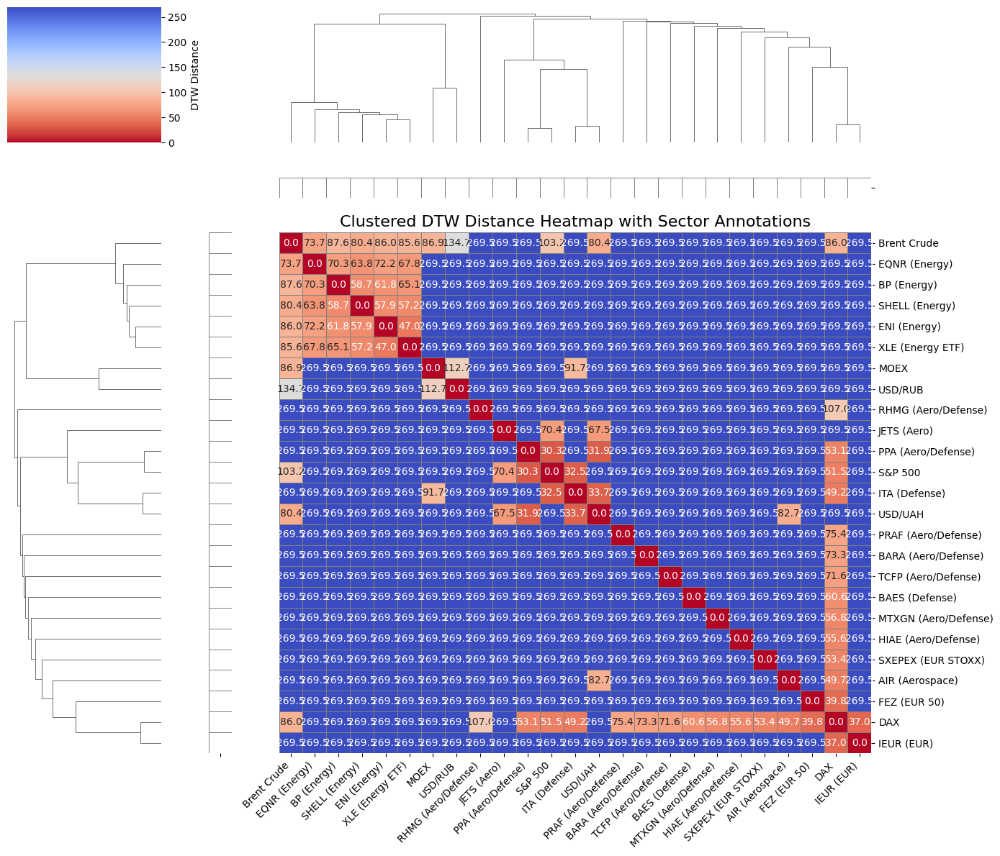

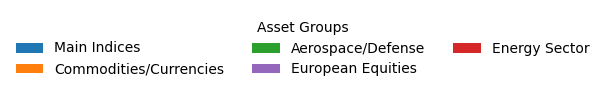

In [ ]:
# Construct DTW distance matrix and compute hierarchical clustering

# Asset groups
asset_groups = {
    'moex': 'Main Indices',
    'dax': 'Main Indices',
    'spy': 'Main Indices',
    'brnt': 'Commodities/Currencies',
    'usd_rub': 'Commodities/Currencies',
    'usd_uah': 'Commodities/Currencies',
    'ita': 'Aerospace/Defense',
    'ppa': 'Aerospace/Defense',
    'jets': 'Aerospace/Defense',
    'rhmg': 'Aerospace/Defense',
    'mtxgn': 'Aerospace/Defense',
    'air': 'Aerospace/Defense',
    'tcfp': 'Aerospace/Defense',
    'baes': 'Aerospace/Defense',
    'hiae': 'Aerospace/Defense',
    'praf': 'Aerospace/Defense',
    'bara': 'Aerospace/Defense',
    'ieur': 'European Equities',
    'sxepex': 'European Equities',
    'fez': 'European Equities',
    'xle': 'Energy Sector',
    'bp': 'Energy Sector',
    'eni': 'Energy Sector',
    'eqnr': 'Energy Sector',
    'shell': 'Energy Sector'
}

# Group colors
group_palette = {
    'Main Indices': '#1f77b4',
    'Commodities/Currencies': '#ff7f0e',
    'Aerospace/Defense': '#2ca02c',
    'European Equities': '#9467bd',
    'Energy Sector': '#d62728'
}

# Build symmetric DTW matrix from summary table
all_labels = sorted(set(df_dtw_summary['Series A']) | set(df_dtw_summary['Series B']))
dtw_matrix = pd.DataFrame(index=all_labels, columns=all_labels, dtype=float)

for _, row in df_dtw_summary.iterrows():
    a, b, dist = row['Series A'], row['Series B'], row['DTW Distance']
    dtw_matrix.loc[a, b] = dist
    dtw_matrix.loc[b, a] = dist

np.fill_diagonal(dtw_matrix.values, 0)

# Fill any NaN values in the matrix
# This is crucial for clustering algorithms and squareform.
# Fill with twice the max value as a large distance to ensure NaNs are treated as far apart.
dtw_matrix.fillna(dtw_matrix.max().max() * 2, inplace=True)


# Compute linkage from condensed distance matrix
# Now that the matrix is complete and symmetric, squareform should work.
dtw_condensed = squareform(dtw_matrix.values)
linkage_matrix = linkage(dtw_condensed, method='average')

# olor rows and columns by asset group
row_colors = dtw_matrix.index.to_series().map(lambda x: group_palette.get(asset_groups.get(x, ''), 'white'))
col_colors = dtw_matrix.columns.to_series().map(lambda x: group_palette.get(asset_groups.get(x, ''), 'white'))

# Plot clustered heatmap
cg = sns.clustermap(
    dtw_matrix,
    cmap='coolwarm_r',
    annot=True,
    fmt=".1f",
    linewidths=0.5,
    linecolor='gray',
    figsize=(14, 12),
    cbar_kws={'label': 'DTW Distance'},
    row_linkage=linkage_matrix,
    col_linkage=linkage_matrix,
    row_colors=row_colors,
    col_colors=col_colors
)

plt.setp(cg.ax_heatmap.get_xticklabels(), rotation=45, ha='right', fontsize=10)
plt.setp(cg.ax_heatmap.get_yticklabels(), rotation=0, fontsize=10)
cg.ax_heatmap.set_title("Clustered DTW Distance Heatmap with Sector Annotations", fontsize=16)
plt.tight_layout()
plt.show()

# Legend for sector colors
legend_handles = [Patch(facecolor=color, label=group) for group, color in group_palette.items()]
plt.figure(figsize=(6, 1))
plt.legend(handles=legend_handles, title="Asset Groups", loc='center', ncol=3, frameon=False)
plt.axis('off')
plt.show()